<a id='top'></a>
# Big Data Analytics A.A. 2020/21 2nd Mid Term: Model(s) implementation and evaluation 
## Flu Shot Learning: Predict H1N1 and Seasonal Flu Vaccines
#### Malucs : Luca Corbucci 516450, Cinzia Lestini 219809, Marco Giuseppe Marino 596673 and Simone Rossi 507267

## Table of Contents
1. [Datasets Loading](#dataset)
2. [Balancing](#bc)
    1. [Reference model](#rm1)
    2. [Undersampling](#us)
    3. [Oversampling](#ov)
    4. [SMOTE](#smote)
    6. [ADASYN](#ad)
    7. [Under/Over](#uo)
    8. [Over/Under](#ou)
    9. [Under/SMOTE](#usm)
    10. [Over/SMOTE](#osm)
    11. [Class weight](#cw)
    12. [Best balancing tecnique](#bt)
3. [Data Transformation assessment](#dta)
    1. [Dataset spliting](#ds)
    2. [New features](#nf)
4. [Modeling](#mod)
    1. [Predict the Seasonal Vaccine](#seasmod)
        1. [Feature selection Seasonal Vaccine](#fsseas)
    2. [Predict the H1N1 Vaccine](#h1n1mod)
        1. [Feature selection H1N1](#fsh1n1)

In [1]:
# packages import
%matplotlib inline
import pandas as pd
import numpy as np
#import of a set of supporting functions
from Utils import Utils
import warnings
warnings.filterwarnings("ignore")
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn import metrics
import graphviz 
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn import svm
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn import preprocessing
from keras.layers import Input, Dense
from keras.models import Model, Sequential
from keras import regularizers
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
import keras
from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras import layers
import tensorflow as tf
from keras.utils.vis_utils import plot_model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.metrics import precision_recall_curve
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import StratifiedKFold
from keras.wrappers.scikit_learn import KerasClassifier
from keras.optimizers import Adamax
from keras.optimizers import RMSprop
from tensorflow.keras import activations
from keras.constraints import maxnorm
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
import matplotlib.colors as mcolors
import seaborn as sns
from keras.callbacks import Callback
from sklearn.dummy import DummyClassifier

np.random.seed(42)

/opt/conda/lib/python3.8/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


<a id='dataset'></a>
## 1. Datasets Loading ([to top](#top))

0. Vaccine full dataset with no new variable.
1. Vaccine full dataset with new variables.
2. H1N1 dataset with no new variable.
3. H1N1 dataset with new variables.
4. Seasonal dataset with no new variable.
5. Seasonal dataset with new variables.

In [2]:
#load of datasets
DF = [pd.read_csv("./Data/vaccines_noNewV.csv")] + [pd.read_csv("./Data/vaccines.csv")] +[pd.read_csv("./Data/h1n1_noNewV.csv")]+[pd.read_csv("./Data/h1n1.csv")]+[pd.read_csv("./Data/seasonal_noNewV.csv")]+[pd.read_csv("./Data/seasonal.csv")] 

In [3]:
#Vaccine full dataset with no new variable.
DF[0].head()

,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,...,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
0,0,0,0,0,0,1,1,0,0,0,...,3,0,0,1,8,2,0,0,0,0
1,2,0,1,0,1,1,1,0,0,0,...,3,1,0,0,1,0,0,0,0,1
2,1,0,1,0,0,0,0,0,0,1,...,3,1,1,0,9,0,2,0,0,0
3,1,0,1,0,1,0,0,0,1,1,...,3,0,0,1,5,1,0,0,0,1
4,1,0,1,0,1,0,1,0,0,0,...,3,0,1,0,9,0,1,0,0,0


In [4]:
#Vaccine full dataset with new variables.
DF[1].head()

,h1n1_knowledge,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,...,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,h1n1_vaccine,seasonal_vaccine,FamilySize,behavior
0,0,0,0,0,0,0,3,1,2,2,...,3,0,0,1,8,2,0,0,1,2
1,2,0,0,0,0,0,5,4,4,4,...,3,1,0,0,1,0,0,1,1,4
2,1,0,0,1,0,0,3,1,1,4,...,3,1,1,0,9,0,0,0,3,1
3,1,0,1,1,0,0,3,3,5,5,...,3,0,0,1,5,1,0,1,1,2
4,1,0,0,0,0,0,3,3,2,3,...,3,0,1,0,9,0,0,0,2,3


In [5]:
#H1N1 dataset with no new variable.
DF[2].head()

,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,chronic_med_condition,child_under_6_months,...,age_group,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,household_adults,household_children,h1n1_vaccine
0,0,0,0,0,0,1,1,0,0,0,...,3,3,0,0,1,8,2,0,0,0
1,2,0,1,0,1,1,1,0,0,0,...,1,3,1,0,0,1,0,0,0,0
2,1,0,1,0,0,0,0,0,1,0,...,0,3,1,1,0,9,0,2,0,0
3,1,0,1,0,1,0,0,0,1,0,...,4,3,0,0,1,5,1,0,0,0
4,1,0,1,0,1,0,1,0,0,0,...,2,3,0,1,0,9,0,1,0,0


In [6]:
#H1N1 dataset with new variables.
DF[3].head()

,h1n1_knowledge,doctor_recc_h1n1,chronic_med_condition,child_under_6_months,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,age_group,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,h1n1_vaccine,FamilySize,behavior
0,0,0,0,0,0,3,1,2,3,3,0,0,1,8,2,0,1,2
1,2,0,0,0,0,5,4,4,1,3,1,0,0,1,0,0,1,4
2,1,0,1,0,0,3,1,1,0,3,1,1,0,9,0,0,3,1
3,1,0,1,0,0,3,3,5,4,3,0,0,1,5,1,0,1,2
4,1,0,0,0,0,3,3,2,2,3,0,1,0,9,0,0,2,3


In [7]:
#Seasonal dataset with no new variable.
DF[4].head()

,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_outside_home,behavioral_touch_face,doctor_recc_seasonal,chronic_med_condition,health_worker,opinion_seas_vacc_effective,...,age_group,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,household_adults,household_children,seasonal_vaccine
0,0,0,0,0,1,1,0,0,0,2,...,3,3,0,0,1,8,2,0,0,0
1,0,1,0,1,1,1,0,0,0,4,...,1,3,1,0,0,1,0,0,0,1
2,0,1,0,0,0,0,0,1,0,4,...,0,3,1,1,0,9,0,2,0,0
3,0,1,0,1,0,0,1,1,0,5,...,4,3,0,0,1,5,1,0,0,1
4,0,1,0,1,0,1,0,0,0,3,...,2,3,0,1,0,9,0,1,0,0


In [8]:
#Seasonal dataset with new variables.
DF[5].head()

,doctor_recc_seasonal,chronic_med_condition,health_worker,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,seasonal_vaccine,FamilySize,behavior
0,0,0,0,2,1,2,3,3,0,0,1,8,2,0,1,2
1,0,0,0,4,2,4,1,3,1,0,0,1,0,1,1,4
2,0,1,0,4,1,2,0,3,1,1,0,9,0,0,3,1
3,1,1,0,5,4,1,4,3,0,0,1,5,1,1,1,2
4,0,0,0,3,1,4,2,3,0,1,0,9,0,0,2,3


<a id='bc'></a>
## 2. Balancing ([to top](#top))



The H1n1 vaccine dataset is numeros, contains 26707 row, but is not balanced because
we have 79 % respondent who did not receive the vaccine (class 0) and only 21% that
received the vaccine (class 1).
This imbalance has negative effects on the performance of class 1, on the applied training
models.

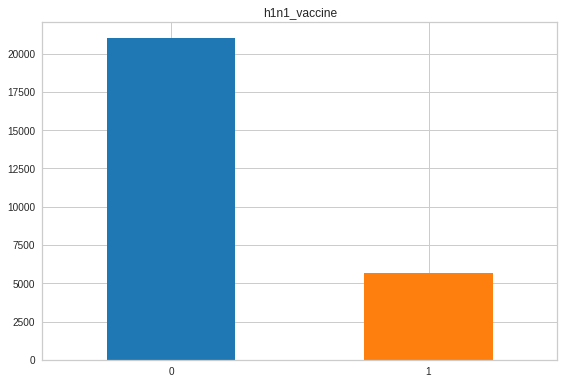

In [9]:
Utils.plotSingleFeatureBarPlot(DF[1],'h1n1_vaccine')

<a id='rm1'></a>
### 2A. Reference model ([to top](#top))
We will use the same model to compare the various Balancing methods.<br>
The chosen classifier is the Decision tree.<br>
We use the Grid Search method to find the best hyperparameters of the model for both the h1n1 vaccine full and the reduced one (which are both dataset with new variables).<br>
After that for both the training set h1n1 vaccine full and the reduced one, various balancing methods will be applied and the performance of each classifier will be compared after balancing the training set.<br>
Important: The balancing method is applied only on the training set and not on the test set.<br>
We evaluate the Performance of the Decision tree model with the Best hyperparameters before applying the various balancing methods.<br>
A Scatter plot of PCA of each dataset before Balancing




In [10]:
#Vaccine full dataset with new variables.
tmp_ds= DF[1].drop('seasonal_vaccine', axis=1)
SL_h1n1_full = Utils.split_train_test(tmp_ds,'h1n1_vaccine',100)
#H1N1 dataset with new variables.
SL_h1n1_red=Utils.split_train_test(DF[3],'h1n1_vaccine',100)

In [11]:
param_list = {'min_samples_split': list(range(50,500,50)),'min_samples_leaf': list(range(50,500,50))}
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame'+'\033[0m')
Utils.DT_grid_sh(SL_h1n1_full, param_list)
print('\033[1m' +'Grid search on the H1N1 DataFrame'+'\033[0m')
#grid search h1n1 reduced
Utils.DT_grid_sh(SL_h1n1_red, param_list)

Grid search on the vaccine full DataFrame
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 300}

Mean validation score: 0.82960 (std: 0.00432)
Parameters: {'min_samples_leaf': 250, 'min_samples_split': 50}

Mean validation score: 0.82960 (std: 0.0

Performance of Decision Tree Classifier before balancing the training set of the full and reduced H1N1 vaccines.

In [12]:
acc_train_full=[]
acc_train_red=[]
acc_test_full=[]
acc_test_red=[]
F1_train_full=[]
F1_train_red=[]
F1_test_full=[]
F1_test_red=[]
precision_0_full_train=[]
precision_1_full_train=[]
precision_0_full_test=[]
precision_1_full_test=[]
recall_0_full_train=[]
recall_1_full_train=[]
recall_0_full_test=[]
recall_1_full_test=[]
precision_0_red_train=[]
precision_1_red_train=[]
precision_0_red_test=[]
precision_1_red_test=[]
recall_0_red_train=[]
recall_1_red_train=[]
recall_0_red_test=[]
recall_1_red_test=[]
print('\033[1m' +'Decision Tree classifier before balancing on the vaccine full DataFrame'+'\033[0m')
tmp=Utils.Model_Eval_DT(SL_h1n1_full[2],SL_h1n1_full[4],SL_h1n1_full[3],SL_h1n1_full[5], 50, 200)
clf_h1n1_full = tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier before balancing on the H1N1 DataFrame'+'\033[0m')
tmp= Utils.Model_Eval_DT(SL_h1n1_red[2],SL_h1n1_red[4],SL_h1n1_red[3],SL_h1n1_red[5], 400, 50)
clf_h1n1_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier before balancing on the vaccine full DataFrame
Training set
Accuracy 0.8321386541136193
F1-score [0.89887858 0.50629327]
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     14722
           1       0.67      0.41      0.51      3972

    accuracy                           0.83     18694
   macro avg       0.77      0.68      0.70     18694
weighted avg       0.82      0.83      0.82     18694

Test set
Accuracy 0.8304005990265818
F1-score [0.89785795 0.50055127]
              precision    recall  f1-score   support

           0       0.85      0.95      0.90      6311
           1       0.67      0.40      0.50      1702

    accuracy                           0.83      8013
   macro avg       0.76      0.67      0.70      8013
weighted avg       0.81      0.83      0.81      8013

Decision Tree classifier before balancing on the H1N1 DataFrame
Training set
Accuracy 0.8349202952819086
F1-score [0.89982471 0.53

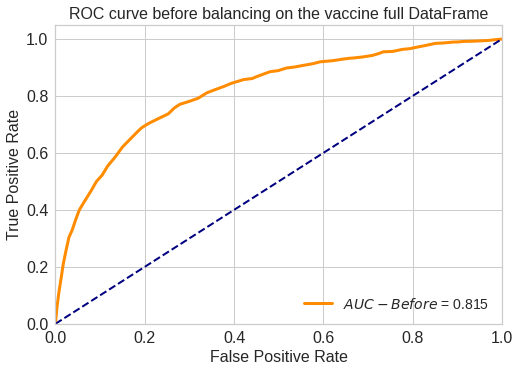

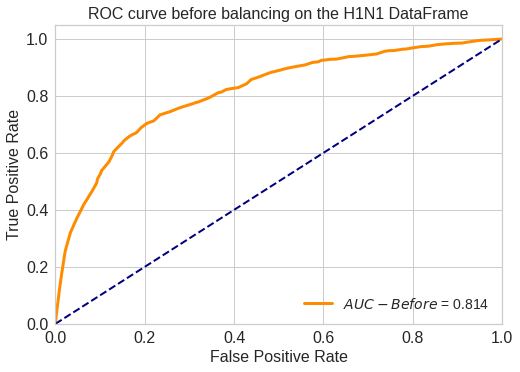

In [13]:
Utils.print_single_ROC_curve(clf_h1n1_full, SL_h1n1_full,'ROC curve before balancing on the vaccine full DataFrame', '$AUC-Before$ = %.3f', 'darkorange')
Utils.print_single_ROC_curve(clf_h1n1_red, SL_h1n1_red,'ROC curve before balancing on the H1N1 DataFrame', '$AUC-Before$ = %.3f', 'darkorange')

Full vaccine DataFrame
Shape :
(18694, 2)


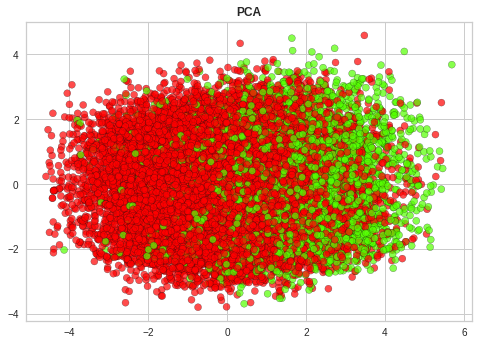

H1N1 vaccine DataFrame
Shape :
(18694, 2)


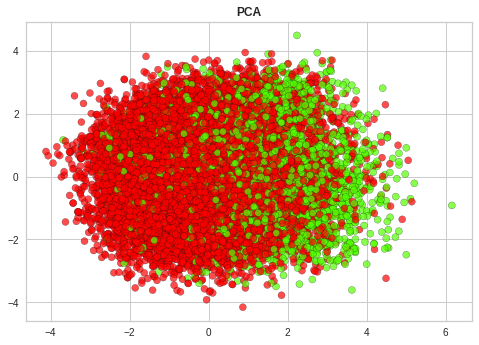

In [14]:
print('\033[1m' +'Full vaccine DataFrame'+'\033[0m')
Utils.show_PCA(SL_h1n1_full[2],SL_h1n1_full[4])
print('\033[1m' +'H1N1 vaccine DataFrame'+'\033[0m')
Utils.show_PCA(SL_h1n1_red[2],SL_h1n1_full[4])

<a id='us'></a>
### 2B. Undersampling ([to top](#top))

We use the Random Under-sampling balancing technique.<br>
The champions of the majority class are randomly removed.<br>
Flaws: The technique could increase the variance of the classifier and potentially discard useful and important samples.<br>
We have devised a function called "best_under".<br>
The function samples the dataset in input (training set and test set) with all the possible sampling percentages of Under sampling method.<br> For each sampling it applies the same Decision Tree Model with the best selected hyperparameters in input  and
gives out the performance values and the summary figures of them.<br>
The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables).<br>
In output to the function, the performance of the model for each percentage of sampling.<br>
A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.
We compare the dataset before and after balancing, showing the scatter plot of the PCA ofthe training sets.










In [15]:
#Temporary sampling
under_full=Utils.under_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, 0.5)
under_red=Utils.under_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, 0.5)
SL_under_full=list(SL_h1n1_full)
SL_under_full[2]=under_full[0]
SL_under_full[4]=under_full[1]
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after undersampling'+'\033[0m')
Utils.DT_grid_sh(SL_under_full, param_list)
SL_under_red=list(SL_h1n1_red)
SL_under_red[2]=under_red[0]
SL_under_red[4]=under_red[1]
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after undersampling'+'\033[0m')
Utils.DT_grid_sh(SL_under_red, param_list)

Resampled dataset shape Counter({0: 7944, 1: 3972})
Resampled dataset shape Counter({0: 7944, 1: 3972})
Grid search on the vaccine full DataFrame after undersampling
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame after undersampling
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 300}

Mean v


Resampled dataset shape Counter({0: 13240, 1: 3972})
Sampling perc :  0.3

Accuracy 0.8249095220267066
F1-score [0.89277799 0.52295138]
              precision    recall  f1-score   support

           0       0.86      0.93      0.89      6311
           1       0.62      0.45      0.52      1702

    accuracy                           0.82      8013
   macro avg       0.74      0.69      0.71      8013
weighted avg       0.81      0.82      0.81      8013


Resampled dataset shape Counter({0: 9930, 1: 3972})
Sampling perc :  0.4

Accuracy 0.8190440534132035
F1-score [0.88555643 0.56793802]
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      6311
           1       0.58      0.56      0.57      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.72      0.73      8013
weighted avg       0.82      0.82      0.82      8013


Resampled dataset shape Counter({0: 7944, 1: 3972})
Sampling perc :  0.5

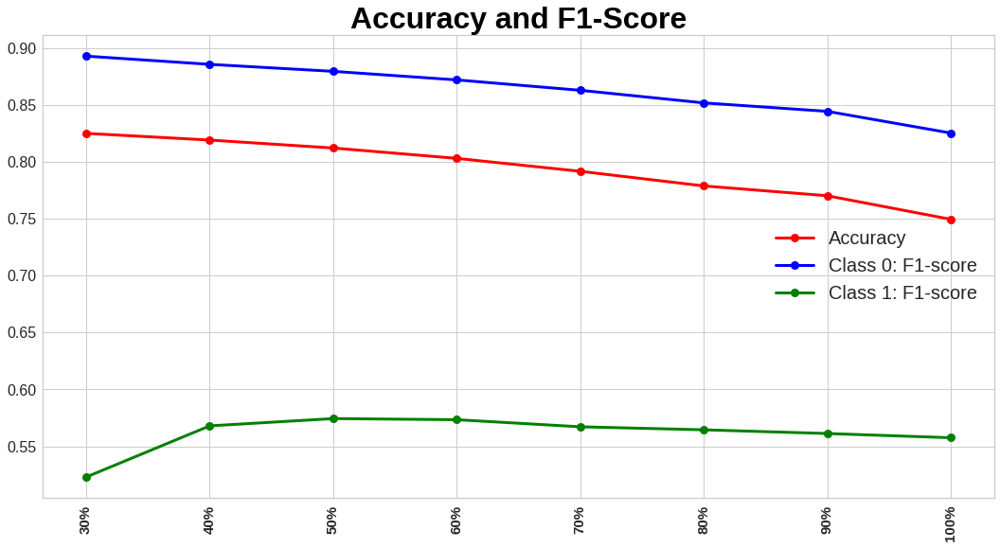

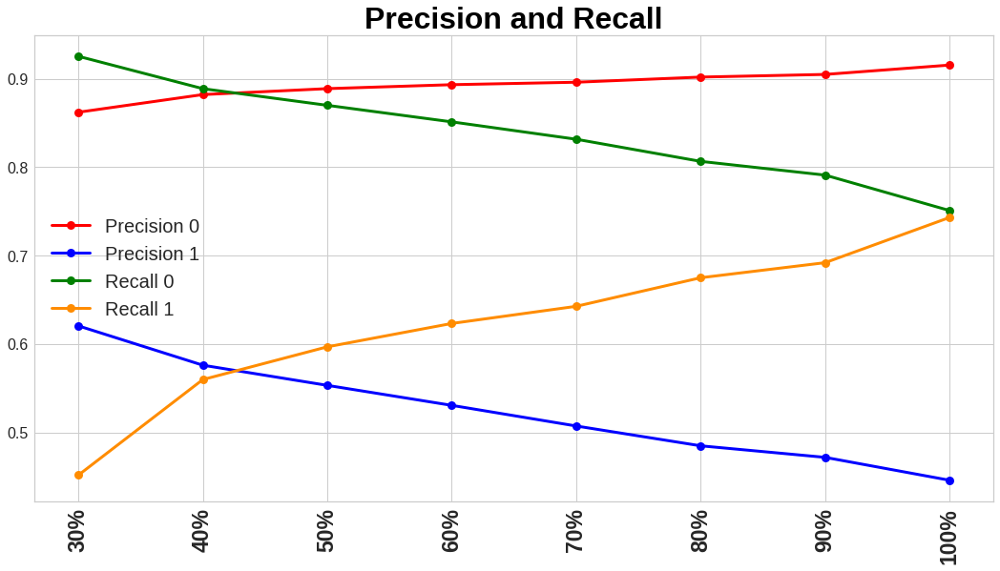

In [16]:
#Best under for full DS
Utils.best_under(SL_h1n1_full, min_split= 200, min_leaf = 50, seed = 42)


Resampled dataset shape Counter({0: 13240, 1: 3972})
Sampling perc :  0.3

Accuracy 0.8217895919131412
F1-score [0.88869836 0.55319149]
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      6311
           1       0.59      0.52      0.55      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.71      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 9930, 1: 3972})
Sampling perc :  0.4

Accuracy 0.8180456757768626
F1-score [0.88598686 0.54972205]
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      6311
           1       0.58      0.52      0.55      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.71      0.72      8013
weighted avg       0.81      0.82      0.81      8013


Resampled dataset shape Counter({0: 7944, 1: 3972})
Sampling perc :  0.5

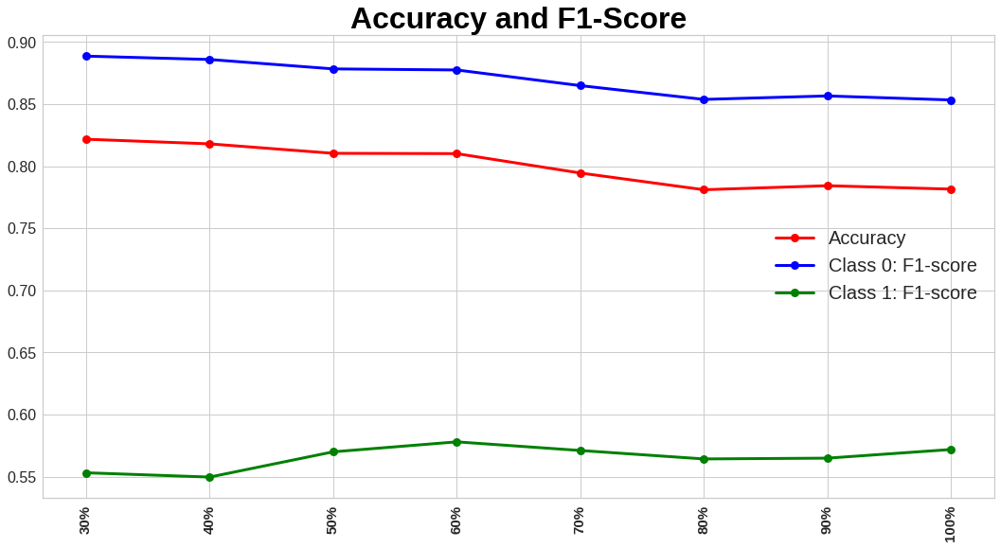

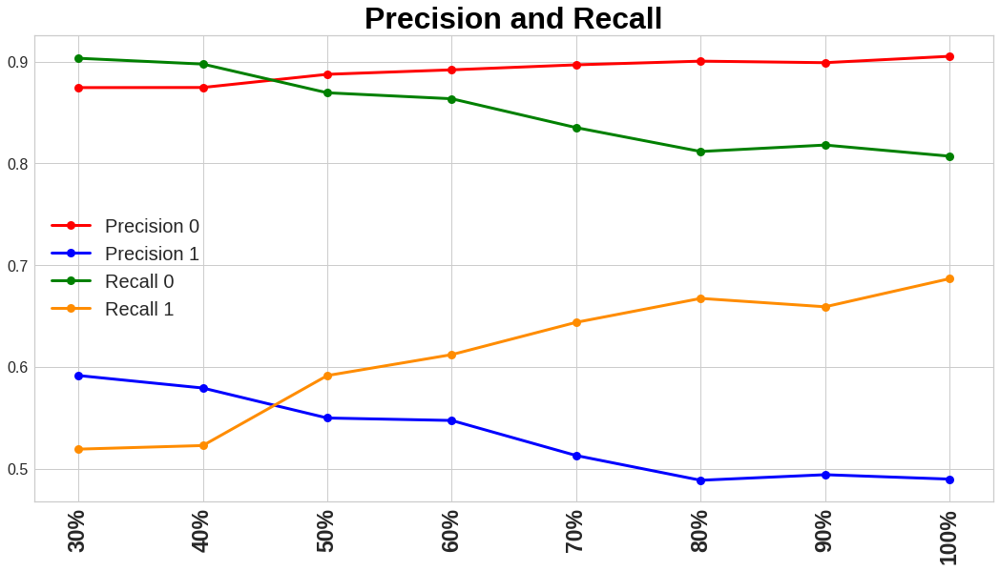

In [17]:
#Best under for H1N1 DS
Utils.best_under(SL_h1n1_red, min_split= 450, min_leaf = 50, seed = 42)

In [18]:
under_full=Utils.under_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, perc = 0.6)
under_red=Utils.under_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, perc= 0.6)

Resampled dataset shape Counter({0: 6620, 1: 3972})
Resampled dataset shape Counter({0: 6620, 1: 3972})


Full vaccine DataFrame after undersampling
Shape :
(10592, 2)


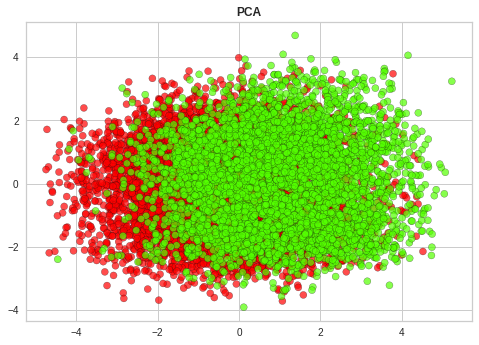

H1N1 vaccine DataFrame after undersampling
Shape :
(10592, 2)


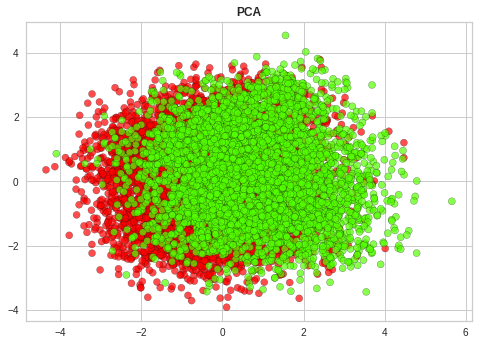

In [19]:
print('\033[1m' +'Full vaccine DataFrame after undersampling'+'\033[0m')
Utils.show_PCA(under_full[0],under_full[1])
print('\033[1m' +'H1N1 vaccine DataFrame after undersampling'+'\033[0m')
Utils.show_PCA(under_red[0],under_red[1])

In [20]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame after undersampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(under_full[0],under_full[1],SL_under_full[3],SL_under_full[5], 200, 50)
clf_h1n1_under_full =tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier on H1N1 DataFrame after undersampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(under_red[0],under_red[1],SL_under_red[3],SL_under_red[5], 450, 50)
clf_h1n1_under_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier on the vaccine full DataFrame after undersampling
Training set
Accuracy 0.7778512084592145
F1-score [0.82888517 0.68343872]
              precision    recall  f1-score   support

           0       0.80      0.86      0.83      6620
           1       0.73      0.64      0.68      3972

    accuracy                           0.78     10592
   macro avg       0.77      0.75      0.76     10592
weighted avg       0.77      0.78      0.77     10592

Test set
Accuracy 0.8029452140272058
F1-score [0.87188641 0.57335855]
              precision    recall  f1-score   support

           0       0.89      0.85      0.87      6311
           1       0.53      0.62      0.57      1702

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.80      0.81      8013

Decision Tree classifier on H1N1 DataFrame after undersampling
Training set
Accuracy 0.7729418429003021
F1-score [0.82603978 0.

In [21]:
acc_train_full

[0.8321386541136193, 0.7778512084592145]

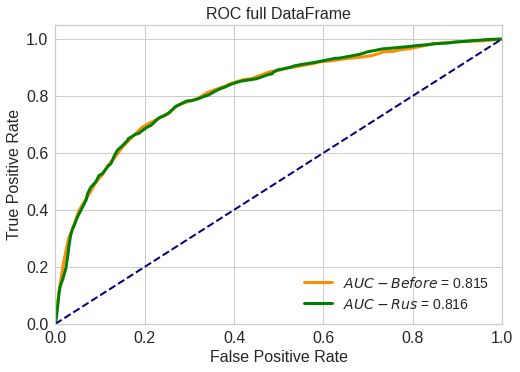

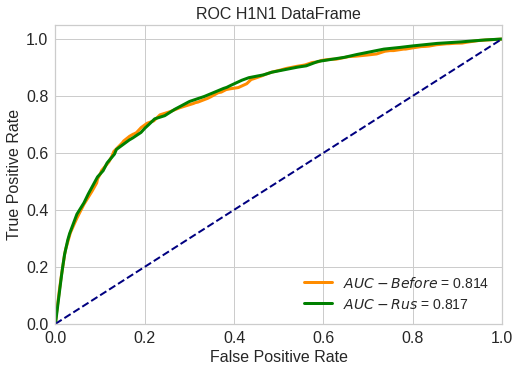

In [22]:
clf_g = [clf_h1n1_full, clf_h1n1_under_full]
split_list_g = [SL_h1n1_full, SL_under_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-Rus$ = %.3f']
color_list = ['darkorange', 'green']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_under_red]
split_list_g = [SL_h1n1_red, SL_under_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-Rus$ = %.3f']
color_list = ['darkorange', 'green']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='ov'></a>
### 2C. Oversampling ([to top](#top))

We use the Random Over-sampling balancing technique<br>
Random oversampling involves randomly selecting examples from the minority class, with replacement, and adding them to the training dataset.<br>
Random oversampling duplicates examples from the minority class in the training dataset and can result in overfitting for some models.<br>
We have devised a function called "best_over".<br>
The function samples the datasetin input (training set and test set) with all the possible sampling percentages of Over sampling method.<br>
For each sampling it applies the same Decision Tree Model with the best selected hyperparameters in input and gives out the performance values and the summary figures of them.<br>
The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables).<br>
In output to the function, the performance of the model for each percentage of sampling.<br>
A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.<br>
We compare the dataset before and after balancing, showing the scatter plot of the PCA of the training sets.

In [23]:
#Temporary sampling
over_full=Utils.over_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, 1.0)
over_red=Utils.over_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, 1.0)
SL_over_full=list(SL_h1n1_full)
SL_over_full[2]=over_full[0]
SL_over_full[4]=over_full[1]
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after oversampling'+'\033[0m')
Utils.DT_grid_sh(SL_over_full, param_list)
SL_over_red=list(SL_h1n1_red)
SL_over_red[2]=over_red[0]
SL_over_red[4]=over_red[1]
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after oversampling'+'\033[0m')
Utils.DT_grid_sh(SL_over_red, param_list)

Resampled dataset shape Counter({0: 14722, 1: 14722})
Resampled dataset shape Counter({0: 14722, 1: 14722})
Grid search on the vaccine full DataFrame after oversampling
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame after oversampling
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 300}

Mean


Resampled dataset shape Counter({0: 14722, 1: 4416})
Sampling perc :  0.3

Accuracy 0.8250343192312493
F1-score [0.89266575 0.52699055]
              precision    recall  f1-score   support

           0       0.86      0.92      0.89      6311
           1       0.62      0.46      0.53      1702

    accuracy                           0.83      8013
   macro avg       0.74      0.69      0.71      8013
weighted avg       0.81      0.83      0.81      8013


Resampled dataset shape Counter({0: 14722, 1: 5888})
Sampling perc :  0.4

Accuracy 0.8222887807313116
F1-score [0.88921736 0.55107188]
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      6311
           1       0.59      0.51      0.55      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.71      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 14722, 1: 7361})
Sampling perc :  0

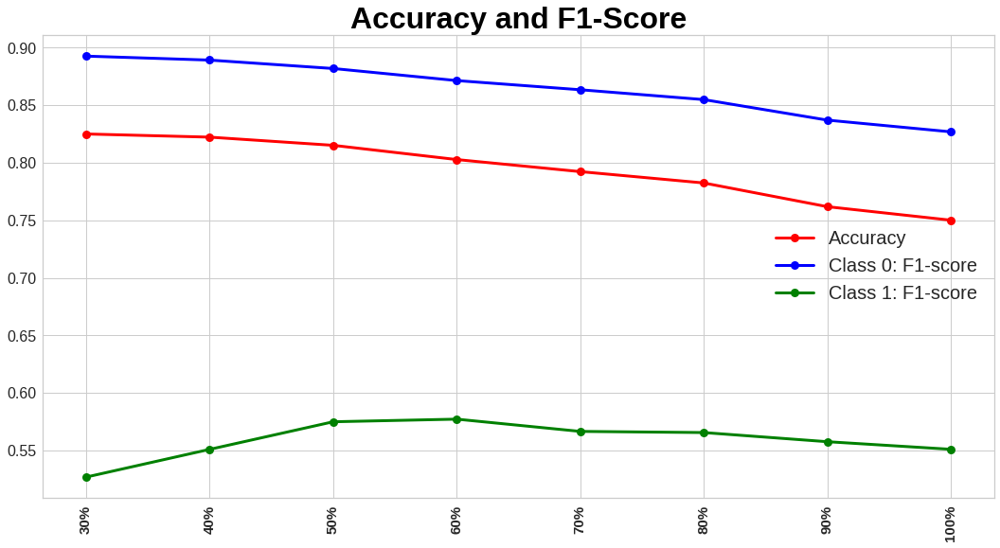

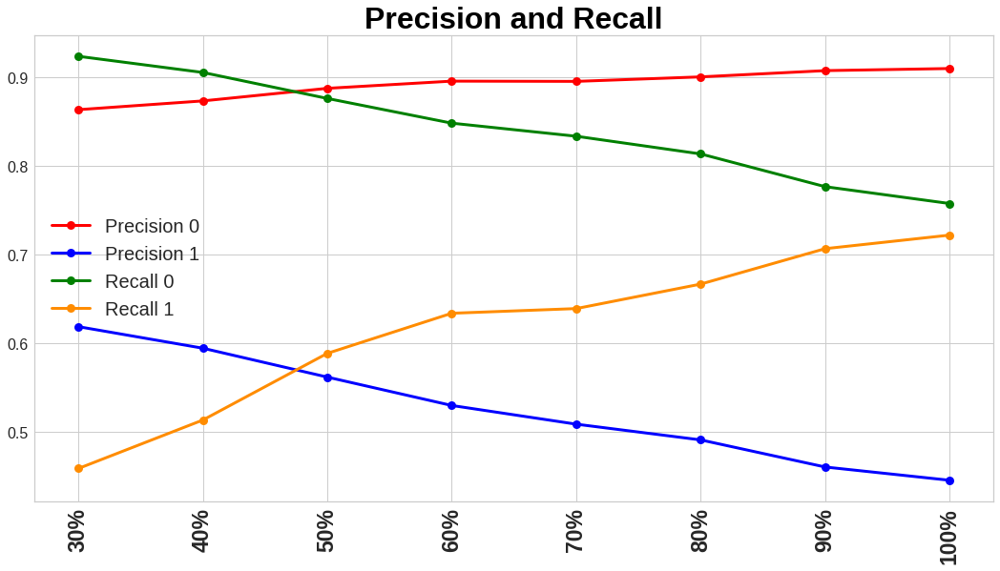

In [24]:
#Best over for full DS
Utils.best_over(SL_h1n1_full, min_split= 200, min_leaf = 50, seed = 42)


Resampled dataset shape Counter({0: 14722, 1: 4416})
Sampling perc :  0.3

Accuracy 0.8260326968675902
F1-score [0.89322917 0.53063973]
              precision    recall  f1-score   support

           0       0.86      0.92      0.89      6311
           1       0.62      0.46      0.53      1702

    accuracy                           0.83      8013
   macro avg       0.74      0.69      0.71      8013
weighted avg       0.81      0.83      0.82      8013


Resampled dataset shape Counter({0: 14722, 1: 5888})
Sampling perc :  0.4

Accuracy 0.8146761512542119
F1-score [0.88421053 0.53608247]
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      6311
           1       0.57      0.50      0.54      1702

    accuracy                           0.81      8013
   macro avg       0.72      0.70      0.71      8013
weighted avg       0.81      0.81      0.81      8013


Resampled dataset shape Counter({0: 14722, 1: 7361})
Sampling perc :  0

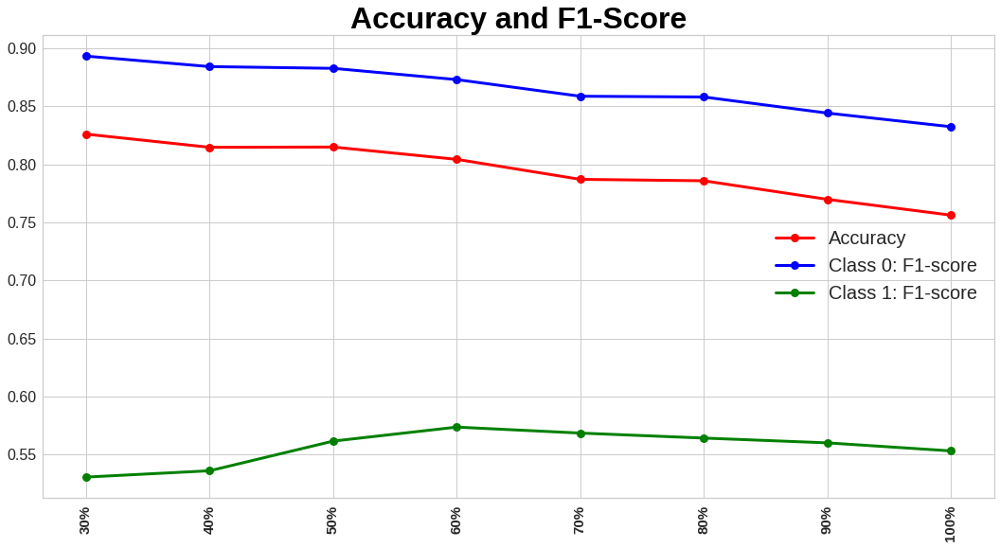

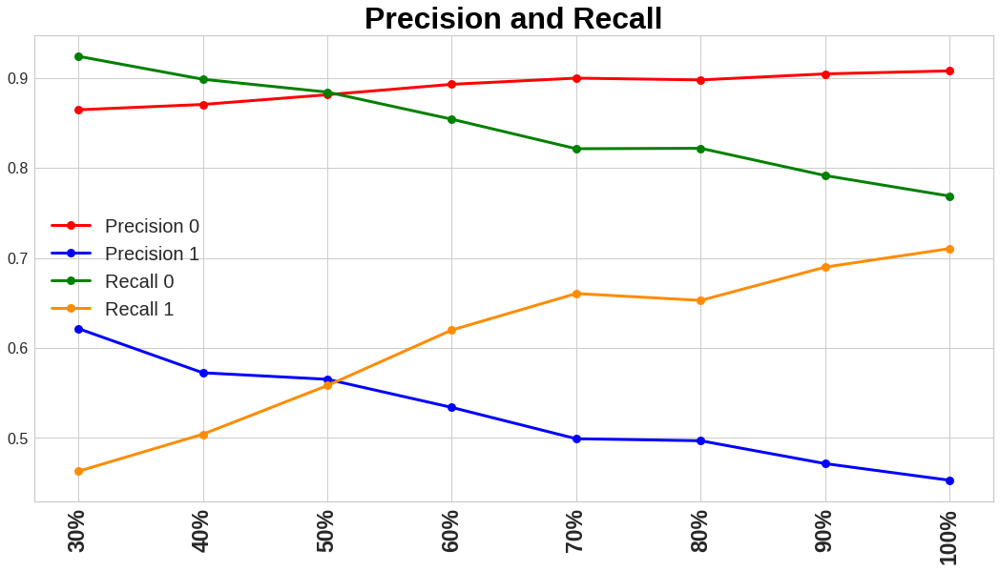

In [25]:
#Best over for H1N1 DS
Utils.best_over(SL_h1n1_red, min_split= 450, min_leaf = 50, seed = 42)

In [26]:
over_full=Utils.over_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42,0.6)
over_red=Utils.over_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42,0.6)

Resampled dataset shape Counter({0: 14722, 1: 8833})
Resampled dataset shape Counter({0: 14722, 1: 8833})


Full vaccine DataFrame after oversampling
Shape :
(23555, 2)


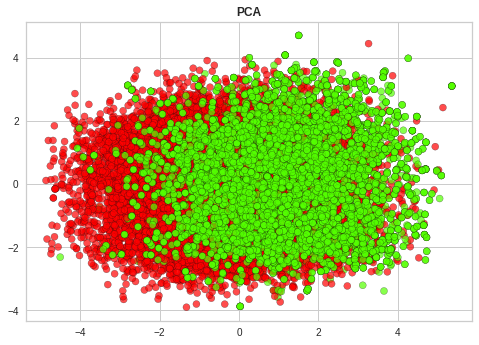

H1N1 vaccine DataFrame after oversampling
Shape :
(23555, 2)


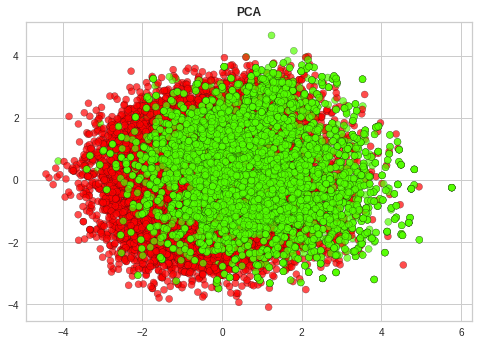

In [27]:
print('\033[1m' +'Full vaccine DataFrame after oversampling'+'\033[0m')
Utils.show_PCA(over_full[0],over_full[1])
print('\033[1m' +'H1N1 vaccine DataFrame after oversampling'+'\033[0m')
Utils.show_PCA(over_red[0],over_red[1])

In [28]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame after oversampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(over_full[0],over_full[1],SL_over_full[3],SL_over_full[5], 200, 50)
clf_h1n1_over_full =tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier on H1N1 DataFrame after oversampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(over_red[0],over_red[1],SL_over_red[3],SL_over_red[5], 450, 50)
clf_h1n1_over_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier on the vaccine full DataFrame after oversampling
Training set
Accuracy 0.7847590745064742
F1-score [0.83313586 0.69687911]
              precision    recall  f1-score   support

           0       0.81      0.86      0.83     14722
           1       0.74      0.66      0.70      8833

    accuracy                           0.78     23555
   macro avg       0.77      0.76      0.77     23555
weighted avg       0.78      0.78      0.78     23555

Test set
Accuracy 0.8028204168226631
F1-score [0.87141927 0.57731407]
              precision    recall  f1-score   support

           0       0.90      0.85      0.87      6311
           1       0.53      0.63      0.58      1702

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.80      0.81      8013

Decision Tree classifier on H1N1 DataFrame after oversampling
Training set
Accuracy 0.7775843769900234
F1-score [0.82890827 0.68

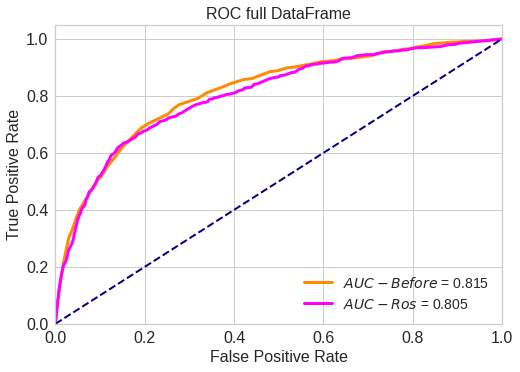

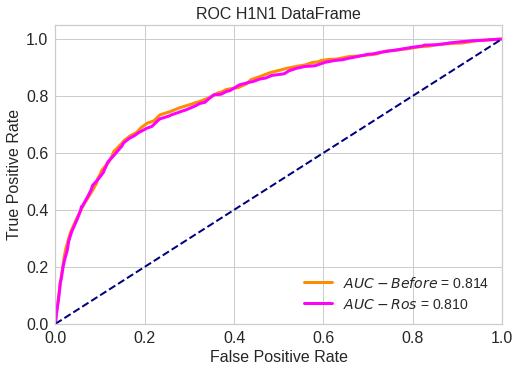

In [29]:
clf_g = [clf_h1n1_full, clf_h1n1_over_full]
split_list_g = [SL_h1n1_full, SL_over_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-Ros$ = %.3f']
color_list = ['darkorange', 'magenta']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_over_red]
split_list_g = [SL_h1n1_red, SL_over_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-Ros$ = %.3f']
color_list = ['darkorange', 'magenta']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='smote'></a>
### 2D. SMOTE ([to top](#top))

Oversampling with SMOTE<br> Synthetic Minority Oversampling Technique, or SMOTE for short.<br>I works by oversampling the underlying dataset with new synthetic points.<br>
SMOTE works by selecting examples that are close in the feature space, drawing a line between the examples in the feature space and drawing a new sample at a point along that line.<br>
"SMOTE first selects a minority class instance a at random and finds its k nearest minority class neighbors. The synthetic instance is then created by choosing one of the k nearest neighbors b at random and connecting a and b to form a line segment in the feature space. The synthetic instances are generated as a convex combination of the two chosen instances a and b".<br>
We have devised a function called "best_smote". <br>
The function samples the datasetin input (training set and test set) with all the possible sampling percentages of Smote method.<br> For each sampling it applies the same Decision Tree Model with the best selected hyperparameters in input and gives out the performance values and the summary figures of them.<br> The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables). <br>In output to the function, the performance of the model for each percentage of sampling.<br> A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.<br>
We compare the dataset before and after balancing, showing the scatter plot of the PCA of the training sets.

In [30]:
#Temporary sampling
smote_full=Utils.smote_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, 1.0)
smote_red=Utils.smote_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, 1.0)
SL_smote_full=list(SL_h1n1_full)
SL_smote_full[2]=smote_full[0]
SL_smote_full[4]=smote_full[1]
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after smotesampling'+'\033[0m')
Utils.DT_grid_sh(SL_smote_full, param_list)
SL_smote_red=list(SL_h1n1_red)
SL_smote_red[2]=smote_red[0]
SL_smote_red[4]=smote_red[1]
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after smotesampling'+'\033[0m')
Utils.DT_grid_sh(SL_smote_red, param_list)

Resampled dataset shape Counter({0: 14722, 1: 14722})
Resampled dataset shape Counter({0: 14722, 1: 14722})
Grid search on the vaccine full DataFrame after smotesampling
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame after smotesampling
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 300}

Me


Resampled dataset shape Counter({0: 14722, 1: 4416})
Sampling perc :  0.3

Accuracy 0.8254087108448771
F1-score [0.89280515 0.5297479 ]
              precision    recall  f1-score   support

           0       0.86      0.92      0.89      6311
           1       0.62      0.46      0.53      1702

    accuracy                           0.83      8013
   macro avg       0.74      0.69      0.71      8013
weighted avg       0.81      0.83      0.82      8013


Resampled dataset shape Counter({0: 14722, 1: 5888})
Sampling perc :  0.4

Accuracy 0.8154249344814676
F1-score [0.88362578 0.55411516]
              precision    recall  f1-score   support

           0       0.88      0.89      0.88      6311
           1       0.57      0.54      0.55      1702

    accuracy                           0.82      8013
   macro avg       0.72      0.71      0.72      8013
weighted avg       0.81      0.82      0.81      8013


Resampled dataset shape Counter({0: 14722, 1: 7361})
Sampling perc :  0

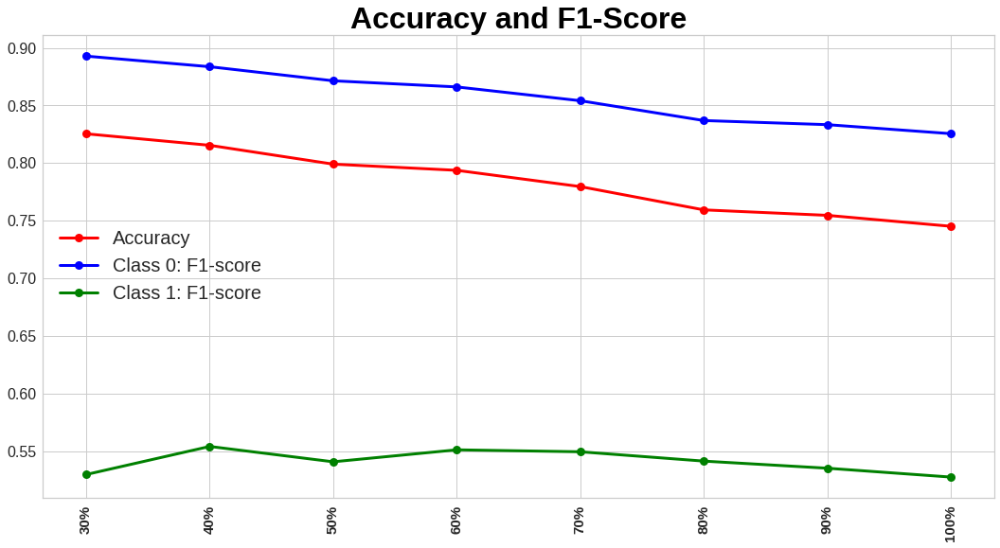

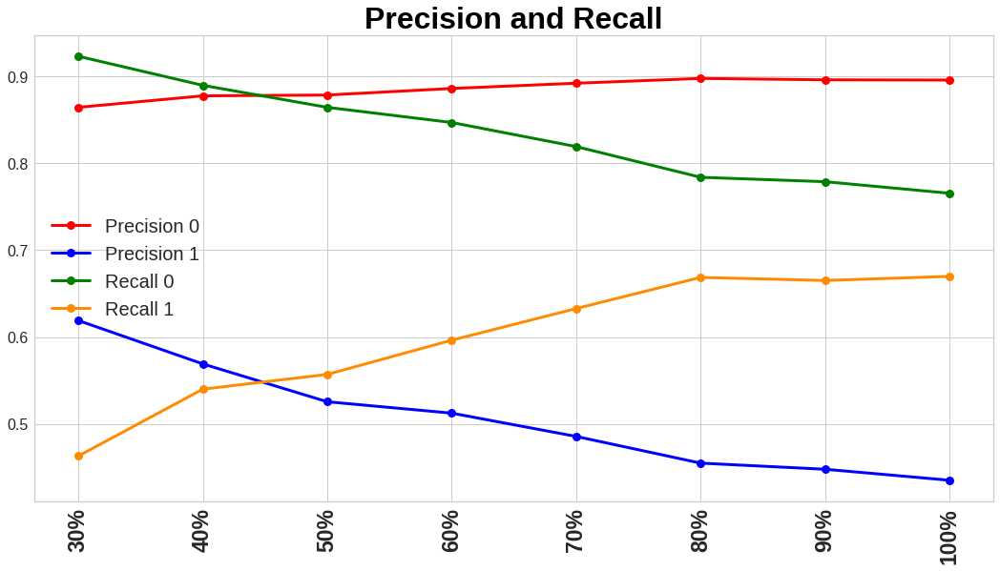

In [31]:
#Best smote for full DS
Utils.best_smote(SL_h1n1_full, min_split= 200, min_leaf = 50, seed = 42)


Resampled dataset shape Counter({0: 14722, 1: 4416})
Sampling perc :  0.3

Accuracy 0.8279046549357294
F1-score [0.89544317 0.51392316]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90      6311
           1       0.64      0.43      0.51      1702

    accuracy                           0.83      8013
   macro avg       0.75      0.68      0.70      8013
weighted avg       0.81      0.83      0.81      8013


Resampled dataset shape Counter({0: 14722, 1: 5888})
Sampling perc :  0.4

Accuracy 0.8232871583676525
F1-score [0.89026658 0.54644459]
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      6311
           1       0.60      0.50      0.55      1702

    accuracy                           0.82      8013
   macro avg       0.74      0.71      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 14722, 1: 7361})
Sampling perc :  0

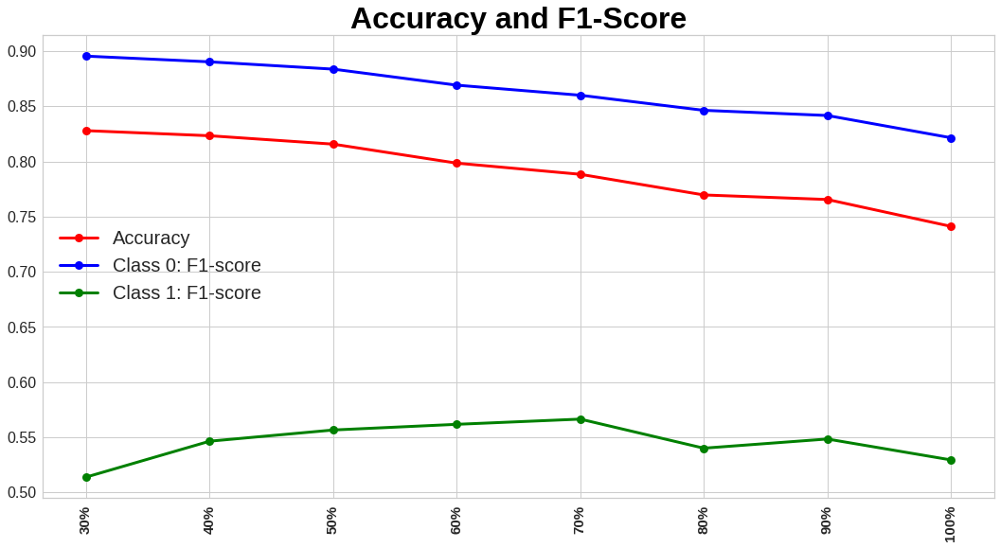

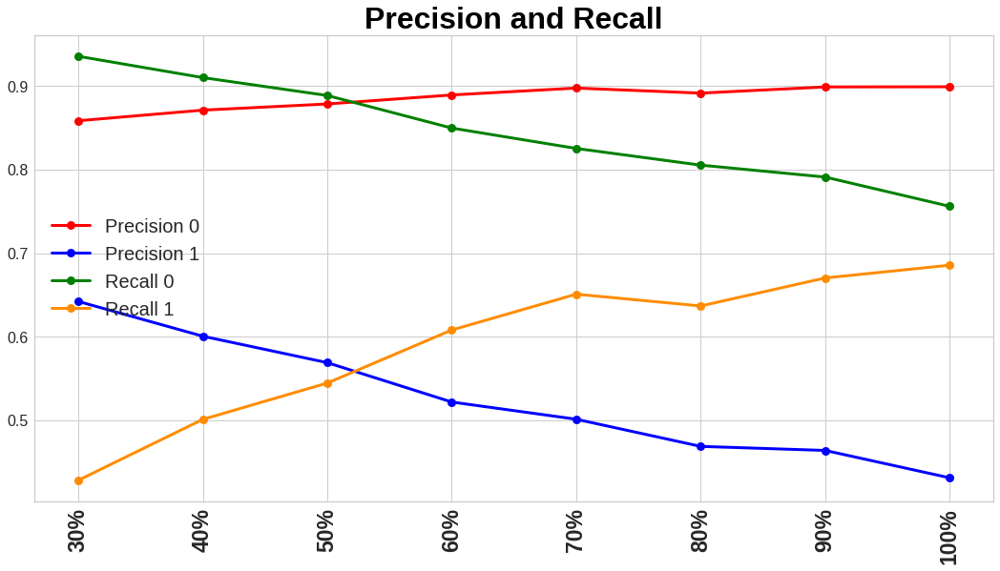

In [32]:
#Best smote for H1N1 DS
Utils.best_smote(SL_h1n1_red, min_split= 450, min_leaf = 50, seed = 42)

In [33]:
smote_full=Utils.smote_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42,0.4)
smote_red=Utils.smote_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42,0.7)

Resampled dataset shape Counter({0: 14722, 1: 5888})
Resampled dataset shape Counter({0: 14722, 1: 10305})


Full vaccine DataFrame after SMOTE sampling
Shape :
(20610, 2)


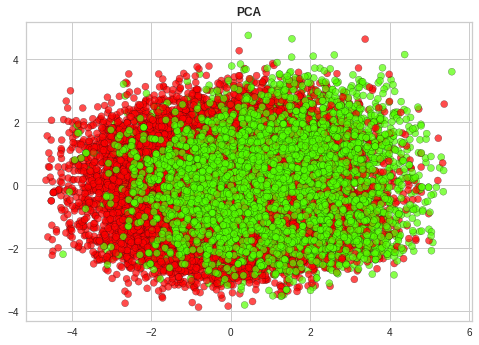

H1N1 vaccine DataFrame after SMOTE sampling
Shape :
(25027, 2)


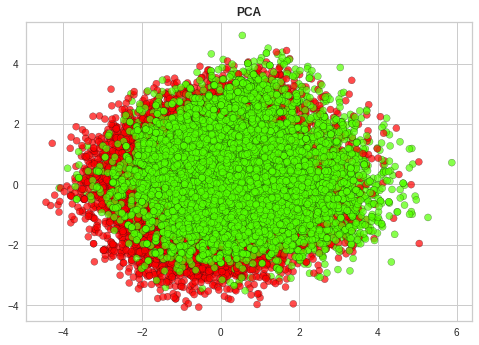

In [34]:
print('\033[1m' +'Full vaccine DataFrame after SMOTE sampling'+'\033[0m')
Utils.show_PCA(smote_full[0],smote_full[1])
print('\033[1m' +'H1N1 vaccine DataFrame after SMOTE sampling'+'\033[0m')
Utils.show_PCA(smote_red[0],smote_red[1])

In [35]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame after SMOTE sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(smote_full[0],smote_full[1],SL_smote_full[3],SL_smote_full[5], 200, 50)
clf_h1n1_smote_full =tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier on H1N1 DataFrame after SMOTE sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(smote_red[0],smote_red[1],SL_smote_red[3],SL_smote_red[5], 450, 50)
clf_h1n1_smote_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier on the vaccine full DataFrame after SMOTE sampling
Training set
Accuracy 0.7980591945657448
F1-score [0.86422653 0.60609502]
              precision    recall  f1-score   support

           0       0.83      0.90      0.86     14722
           1       0.68      0.54      0.61      5888

    accuracy                           0.80     20610
   macro avg       0.76      0.72      0.74     20610
weighted avg       0.79      0.80      0.79     20610

Test set
Accuracy 0.8154249344814676
F1-score [0.88362578 0.55411516]
              precision    recall  f1-score   support

           0       0.88      0.89      0.88      6311
           1       0.57      0.54      0.55      1702

    accuracy                           0.82      8013
   macro avg       0.72      0.71      0.72      8013
weighted avg       0.81      0.82      0.81      8013

Decision Tree classifier on H1N1 DataFrame after SMOTE sampling
Training set
Accuracy 0.747312902065769
F1-score [0.79434146 0

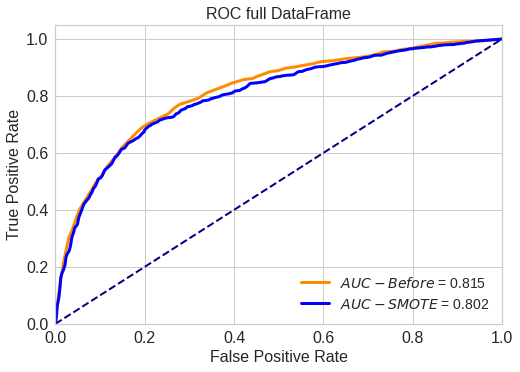

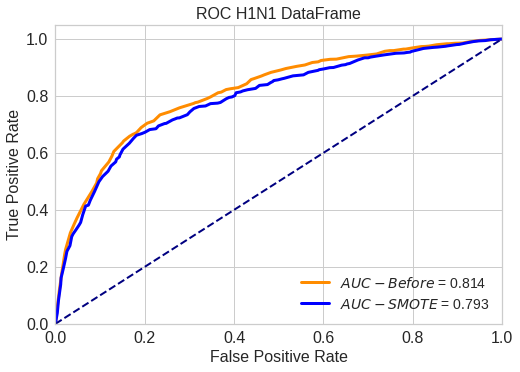

In [36]:
clf_g = [clf_h1n1_full, clf_h1n1_smote_full]
split_list_g = [SL_h1n1_full, SL_smote_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-SMOTE$ = %.3f']
color_list = ['darkorange', 'blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_smote_red]
split_list_g = [SL_h1n1_red, SL_smote_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-SMOTE$ = %.3f']
color_list = ['darkorange', 'blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='ad'></a>
### 2E. ADASYN ([to top](#top))

The other oversampling technique implemented in imlearn is adaptive synthetic sampling, or ADASYN. ADASYN is similar to SMOTE, and derived from it, featuring just one important difference. it will bias the sample space (that is, the likelihood that any particular point will be chosen for duping) towards points which are located not in homogenous neighborhoods. <br>
We have devised a function called "best_adasyn". <br>
The function samples the datasetin input (training set and test set) with all the possible sampling percentages of Adasyn method.<br> For each sampling it applies the same Decision Tree Model with the best selected hyperparameters in input and gives out the performance values and the summary figures of them.<br> The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables). <br>In output to the function, the performance of the model for each percentage of sampling.<br> A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.<br>
We compare the dataset before and after balancing, showing the scatter plot of the PCA of the training sets.

In [37]:
#Temporary sampling
adasyn_full=Utils.adasyn_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, 0.5)
adasyn_red=Utils.adasyn_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, 0.5)
SL_adasyn_full=list(SL_h1n1_full)
SL_adasyn_full[2]=adasyn_full[0]
SL_adasyn_full[4]=adasyn_full[1]
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after adasynsampling'+'\033[0m')
Utils.DT_grid_sh(SL_adasyn_full, param_list)
SL_adasyn_red=list(SL_h1n1_red)
SL_adasyn_red[2]=adasyn_red[0]
SL_adasyn_red[4]=adasyn_red[1]
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after adasynsampling'+'\033[0m')
Utils.DT_grid_sh(SL_adasyn_red, param_list)

Resampled dataset shape Counter({0: 14722, 1: 7368})
Resampled dataset shape Counter({0: 14722, 1: 7444})
Grid search on the vaccine full DataFrame after adasynsampling
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame after adasynsampling
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 300}

Me


Resampled dataset shape Counter({0: 14722, 1: 5837})
Sampling perc :  0.4

Accuracy 0.8046923748908025
F1-score [0.87714891 0.52388196]
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      6311
           1       0.54      0.51      0.52      1702

    accuracy                           0.80      8013
   macro avg       0.71      0.70      0.70      8013
weighted avg       0.80      0.80      0.80      8013


Resampled dataset shape Counter({0: 14722, 1: 7368})
Sampling perc :  0.5

Accuracy 0.7969549482091601
F1-score [0.86991285 0.53765274]
              precision    recall  f1-score   support

           0       0.88      0.86      0.87      6311
           1       0.52      0.56      0.54      1702

    accuracy                           0.80      8013
   macro avg       0.70      0.71      0.70      8013
weighted avg       0.80      0.80      0.80      8013


Resampled dataset shape Counter({0: 14722, 1: 9233})
Sampling perc :  0

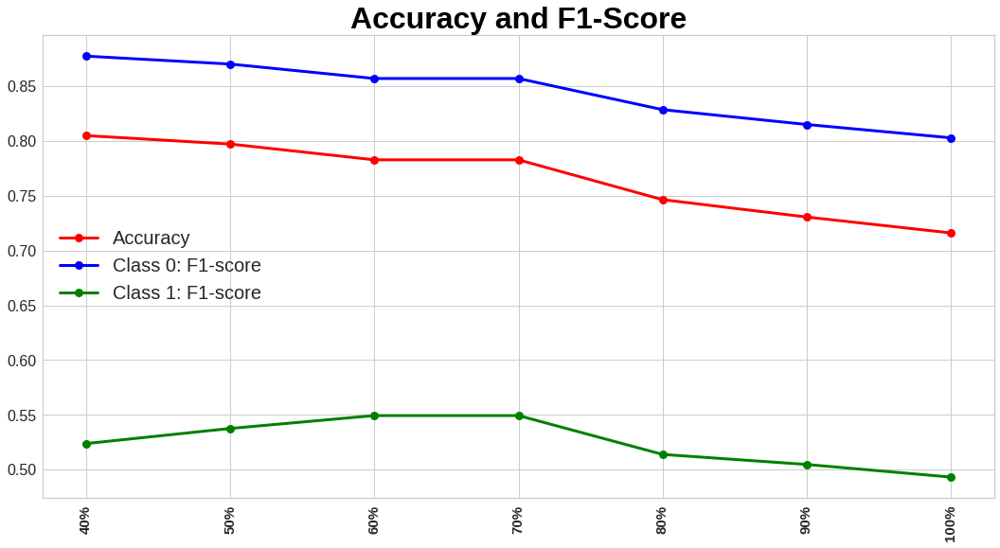

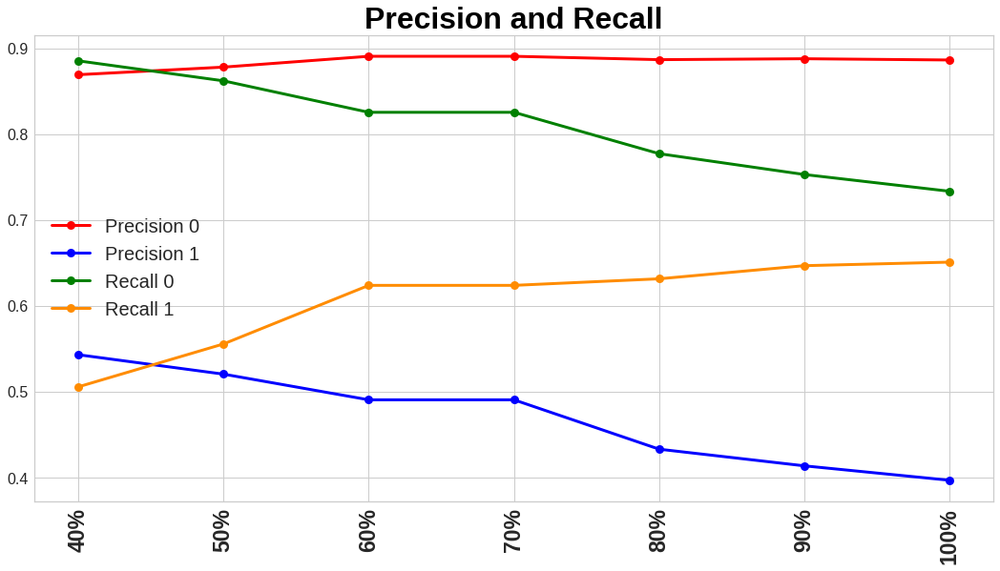

In [38]:
#Best adasyn for full DS
Utils.best_adasyn(SL_h1n1_full, min_split= 200, min_leaf = 50, seed = 42)


Resampled dataset shape Counter({0: 14722, 1: 5891})
Sampling perc :  0.4

Accuracy 0.8186696617995757
F1-score [0.88677628 0.54494206]
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      6311
           1       0.58      0.51      0.54      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.71      0.72      8013
weighted avg       0.81      0.82      0.81      8013


Resampled dataset shape Counter({0: 14722, 1: 7444})
Sampling perc :  0.5

Accuracy 0.81267939598153
F1-score [0.88120301 0.55735771]
              precision    recall  f1-score   support

           0       0.88      0.88      0.88      6311
           1       0.56      0.56      0.56      1702

    accuracy                           0.81      8013
   macro avg       0.72      0.72      0.72      8013
weighted avg       0.81      0.81      0.81      8013


Resampled dataset shape Counter({0: 14722, 1: 9363})
Sampling perc :  0.6

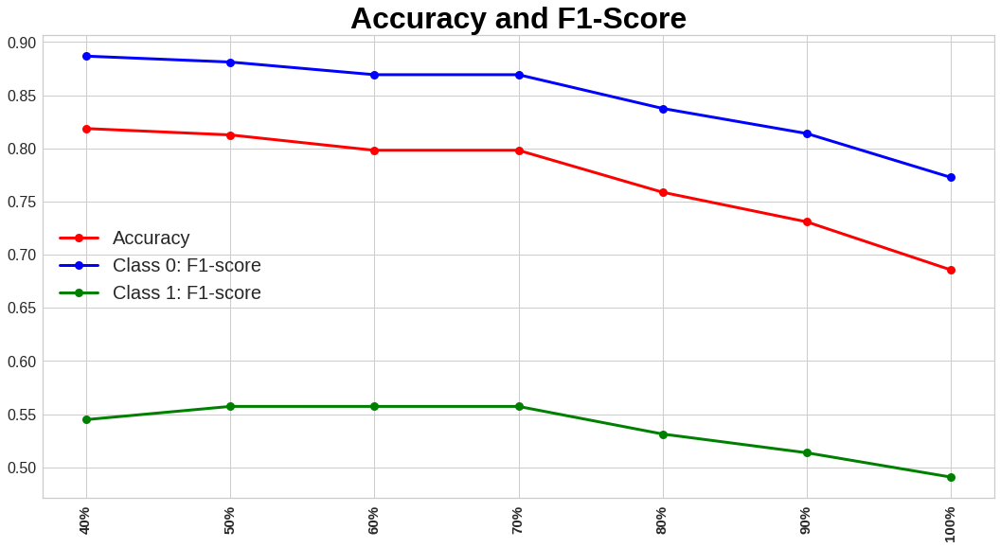

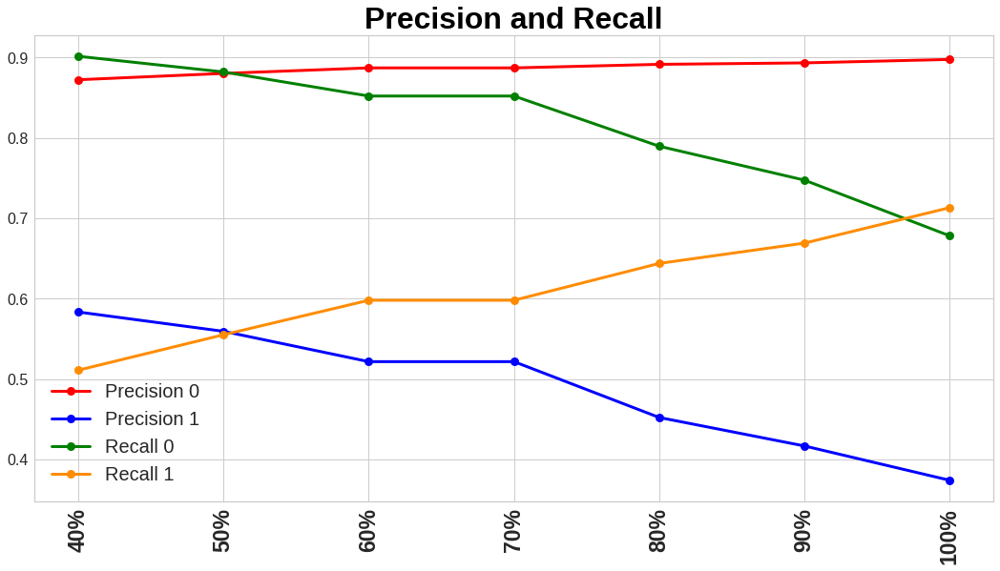

In [39]:
#Best adasyn for H1N1 DS
Utils.best_adasyn(SL_h1n1_red, min_split= 450, min_leaf = 50, seed = 42)

In [40]:
adasyn_full=Utils.adasyn_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42,0.6)
adasyn_red=Utils.adasyn_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42,0.6)

Resampled dataset shape Counter({0: 14722, 1: 9233})
Resampled dataset shape Counter({0: 14722, 1: 9363})


Full vaccine DataFrame after ADASYN sampling
Shape :
(23955, 2)


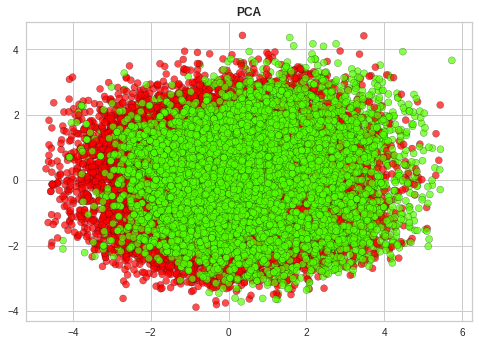

H1N1 vaccine DataFrame after ADASYN sampling
Shape :
(24085, 2)


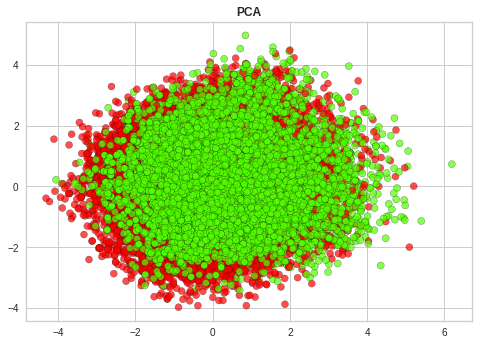

In [41]:
print('\033[1m' +'Full vaccine DataFrame after ADASYN sampling'+'\033[0m')
Utils.show_PCA(adasyn_full[0],adasyn_full[1])
print('\033[1m' +'H1N1 vaccine DataFrame after ADASYN sampling'+'\033[0m')
Utils.show_PCA(adasyn_red[0],adasyn_red[1])

In [42]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame after ADASYN sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(adasyn_full[0],adasyn_full[1],SL_adasyn_full[3],SL_adasyn_full[5], 200, 50)
clf_h1n1_adasyn_full =tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier on H1N1 DataFrame after ADASYN sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(adasyn_red[0],adasyn_red[1],SL_adasyn_red[3],SL_adasyn_red[5], 450, 50)
clf_h1n1_adasyn_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier on the vaccine full DataFrame after ADASYN sampling
Training set
Accuracy 0.7431851388019203
F1-score [0.80040231 0.63998127]
              precision    recall  f1-score   support

           0       0.77      0.84      0.80     14722
           1       0.70      0.59      0.64      9233

    accuracy                           0.74     23955
   macro avg       0.73      0.72      0.72     23955
weighted avg       0.74      0.74      0.74     23955

Test set
Accuracy 0.782603269686759
F1-score [0.85674342 0.54940507]
              precision    recall  f1-score   support

           0       0.89      0.83      0.86      6311
           1       0.49      0.62      0.55      1702

    accuracy                           0.78      8013
   macro avg       0.69      0.72      0.70      8013
weighted avg       0.81      0.78      0.79      8013

Decision Tree classifier on H1N1 DataFrame after ADASYN sampling
Training set
Accuracy 0.7290844924226697
F1-score [0.79413157

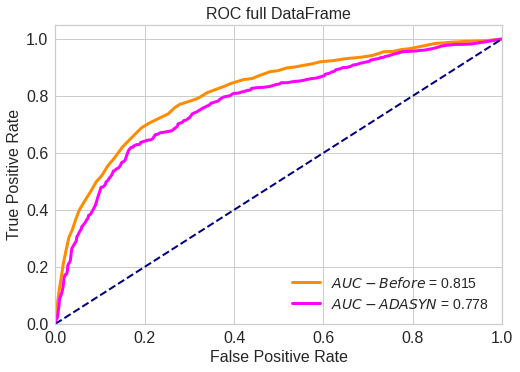

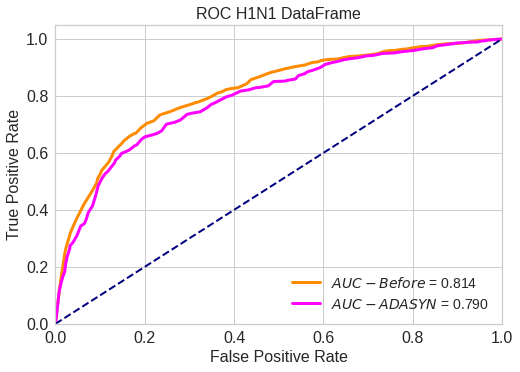

In [43]:
clf_g = [clf_h1n1_full, clf_h1n1_adasyn_full]
split_list_g = [SL_h1n1_full, SL_adasyn_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-ADASYN$ = %.3f']
color_list = ['darkorange', 'magenta']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_adasyn_red]
split_list_g = [SL_h1n1_red, SL_adasyn_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-ADASYN$ = %.3f']
color_list = ['darkorange', 'magenta']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='uo'></a>
### 2F. Under/Over ([to top](#top))

In This method,we use the Random Under-sampling balancing method and  then we use the Over sampling on the same already balanced dataset<br>
We have devised a function called "best_under_over". <br>
The function samples the dataset in input (training set and test set) with all the possible sampling percentages before balancing the dataset with Random Under method, and after with Random Over sampling.<br> For each sampling it applies the same Decision Tree Model with the best selected hyperparameters in input and gives out the performance values and the summary figures of them.<br> The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables). <br>In output to the function, the performance of the model for each percentage of sampling.<br> A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.<br>
We compare the dataset before and after balancing, showing the scatter plot of the PCA of the training sets.

In [44]:
#Temporary sampling
under_over_full=Utils.under_over_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, 0.5, 0.6)
under_over_red=Utils.under_over_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, 0.5, 0.6)
SL_under_over_full=list(SL_h1n1_full)
SL_under_over_full[2]=under_over_full[0]
SL_under_over_full[4]=under_over_full[1]
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after under_oversampling'+'\033[0m')
Utils.DT_grid_sh(SL_under_over_full, param_list)
SL_under_over_red=list(SL_h1n1_red)
SL_under_over_red[2]=under_over_red[0]
SL_under_over_red[4]=under_over_red[1]
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after under_oversampling'+'\033[0m')
Utils.DT_grid_sh(SL_under_over_red, param_list)

Resampled dataset shape Counter({0: 7944, 1: 4766})
Resampled dataset shape Counter({0: 7944, 1: 4766})
Grid search on the vaccine full DataFrame after under_oversampling
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame after under_oversampling
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 30


Resampled dataset shape Counter({0: 13240, 1: 5296})
perc_1 :  0.3
perc_2 :  0.4

Accuracy 0.8202920254586298
F1-score [0.88785047 0.5480226 ]
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      6311
           1       0.59      0.51      0.55      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.71      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 13240, 1: 6620})
perc_1 :  0.3
perc_2 :  0.5

Accuracy 0.8111818295270186
F1-score [0.87916301 0.56833096]
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      6311
           1       0.55      0.59      0.57      1702

    accuracy                           0.81      8013
   macro avg       0.72      0.73      0.72      8013
weighted avg       0.82      0.81      0.81      8013


Resampled dataset shape Counter({0: 13240, 1: 7944})
perc

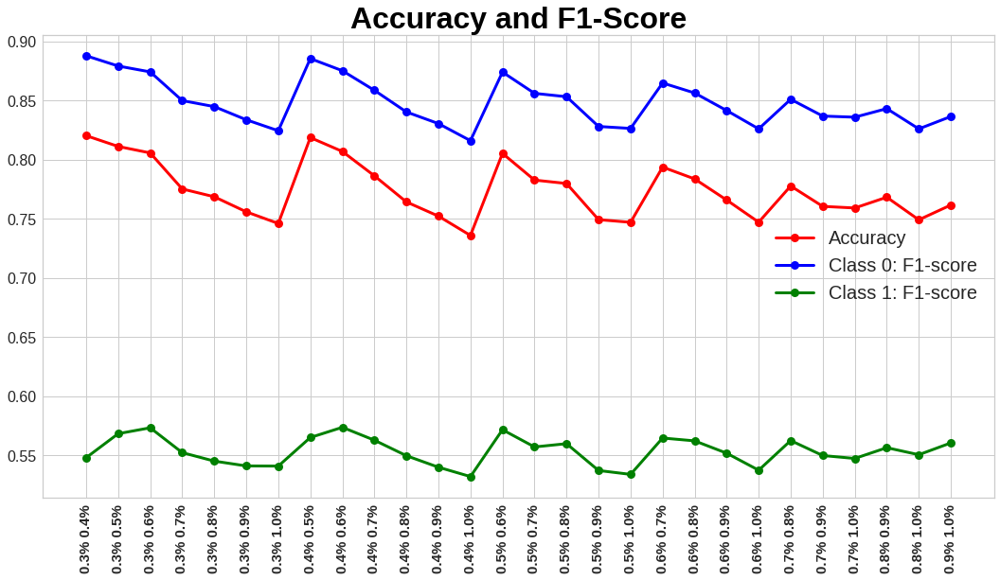

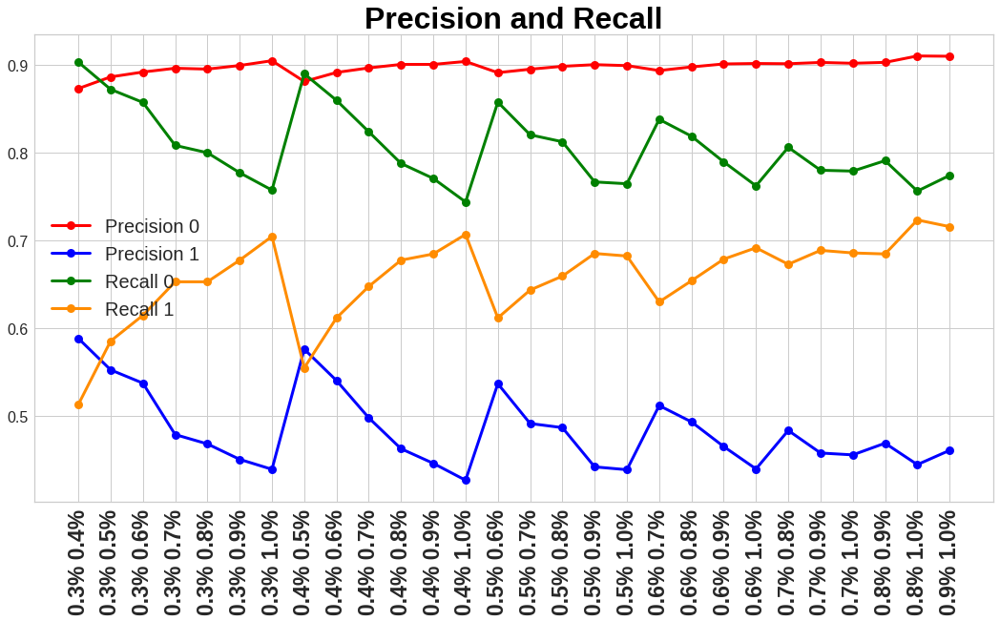

In [45]:
#Best Under/Over for full DS
Utils.best_under_over(SL_h1n1_full, min_split= 200, min_leaf = 50, seed = 42)


Resampled dataset shape Counter({0: 13240, 1: 5296})
perc_1 :  0.3
perc_2 :  0.4

Accuracy 0.8225383751403968
F1-score [0.88843559 0.56646341]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      6311
           1       0.59      0.55      0.57      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.72      0.73      8013
weighted avg       0.82      0.82      0.82      8013


Resampled dataset shape Counter({0: 13240, 1: 6620})
perc_1 :  0.3
perc_2 :  0.5

Accuracy 0.8196680394359166
F1-score [0.88612184 0.56697633]
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      6311
           1       0.58      0.56      0.57      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.72      0.73      8013
weighted avg       0.82      0.82      0.82      8013


Resampled dataset shape Counter({0: 13240, 1: 7944})
perc

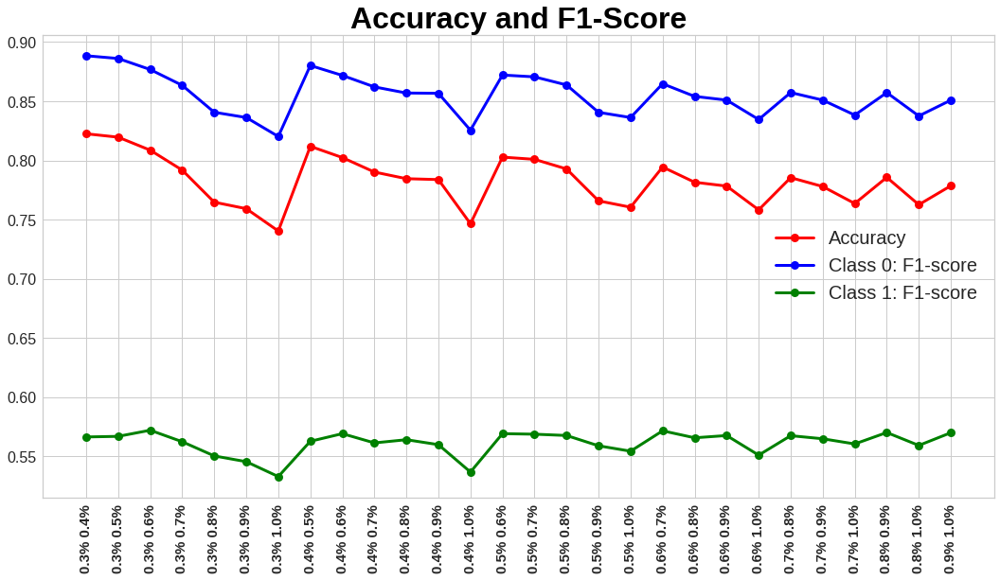

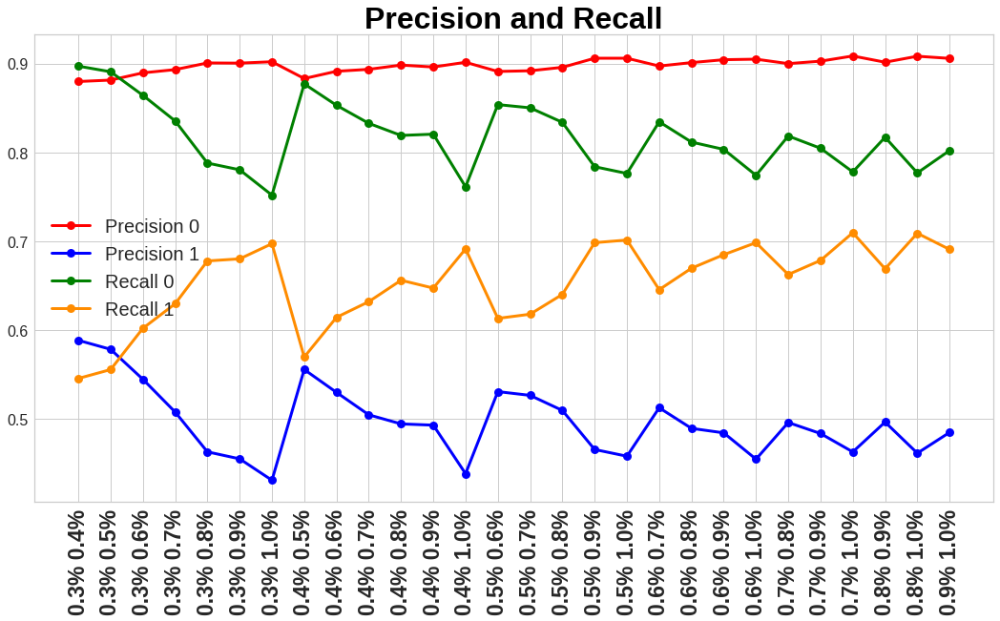

In [46]:
#Best Under/Over for H1N1 DS
Utils.best_under_over(SL_h1n1_red, min_split= 450, min_leaf = 50, seed = 42)

In [47]:
under_over_full=Utils.under_over_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42,0.4,0.5)
under_over_red=Utils.under_over_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42,0.4,0.5)

Resampled dataset shape Counter({0: 9930, 1: 4965})
Resampled dataset shape Counter({0: 9930, 1: 4965})


Full vaccine DataFrame after Under/Over sampling
Shape :
(14895, 2)


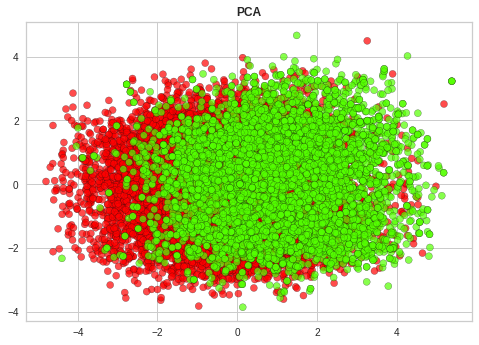

H1N1 vaccine DataFrame after Under/Over sampling
Shape :
(14895, 2)


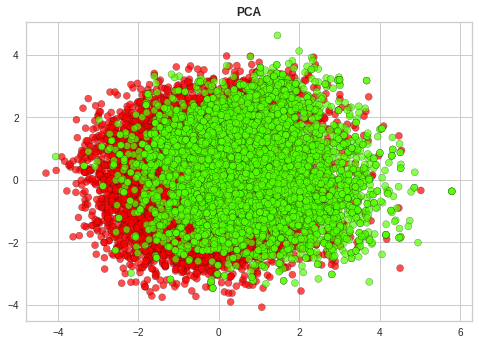

In [48]:
print('\033[1m' +'Full vaccine DataFrame after Under/Over sampling'+'\033[0m')
Utils.show_PCA(under_over_full[0],under_over_full[1])
print('\033[1m' +'H1N1 vaccine DataFrame after Under/Over sampling'+'\033[0m')
Utils.show_PCA(under_over_red[0],under_over_red[1])

In [49]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame after Under/Over sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(under_over_full[0],under_over_full[1],SL_under_over_full[3],SL_under_over_full[5], 200, 50)
clf_h1n1_under_over_full =tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier on H1N1 DataFrame after Under/Over sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(under_over_red[0],under_over_red[1],SL_under_over_red[3],SL_under_over_red[5], 450, 50)
clf_h1n1_under_over_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier on the vaccine full DataFrame after Under/Over sampling
Training set
Accuracy 0.7892581403155421
F1-score [0.85033138 0.64398321]
              precision    recall  f1-score   support

           0       0.81      0.90      0.85      9930
           1       0.74      0.57      0.64      4965

    accuracy                           0.79     14895
   macro avg       0.77      0.73      0.75     14895
weighted avg       0.78      0.79      0.78     14895

Test set
Accuracy 0.8186696617995757
F1-score [0.88545526 0.56510027]
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      6311
           1       0.58      0.55      0.57      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.72      0.73      8013
weighted avg       0.82      0.82      0.82      8013

Decision Tree classifier on H1N1 DataFrame after Under/Over sampling
Training set
Accuracy 0.7843571668345082
F1-score [0

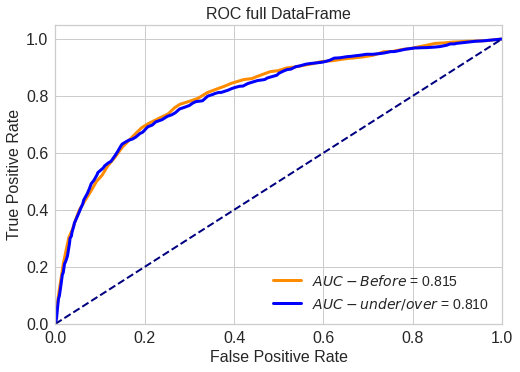

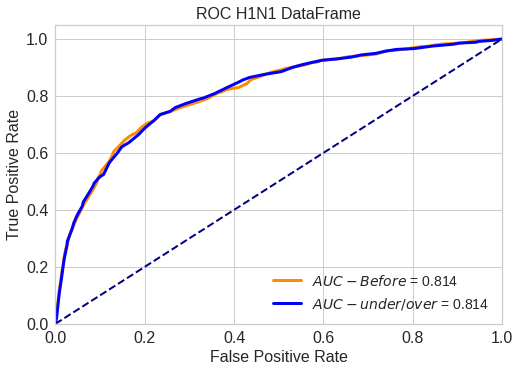

In [50]:
clf_g = [clf_h1n1_full, clf_h1n1_under_over_full]
split_list_g = [SL_h1n1_full, SL_under_over_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-under/over$ = %.3f']
color_list = ['darkorange', 'blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_under_over_red]
split_list_g = [SL_h1n1_red, SL_under_over_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-under/over$ = %.3f']
color_list = ['darkorange', 'blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='ou'></a>
### 2G. Over/Under ([to top](#top))

In this method,we use the Random Over-sampling balancing method and then we use the Random Under sampling on the same already balanced dataset<br>
We have devised a function called "best_over_under". <br>
The function samples the dataset in input (training set and test set) with all the possible sampling percentages before balancing the dataset with Random Over method, and after with Random Under sampling.<br> For each sampling it applies the same Decision Tree Model with the best selected hyperparameters in input and gives out the performance values and the summary figures of them.<br> The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables). <br>In output to the function, the performance of the model for each percentage of sampling.<br> A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.<br>
We compare the dataset before and after balancing, showing the scatter plot of the PCA of the training sets.

In [51]:
#Temporary sampling 
over_under_full=Utils.over_under_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, 0.5, 0.6)
over_under_red=Utils.over_under_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, 0.5, 0.6)
SL_over_under_full=list(SL_h1n1_full)
SL_over_under_full[2]=over_under_full[0]
SL_over_under_full[4]=over_under_full[1]
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after over_undersampling'+'\033[0m')
Utils.DT_grid_sh(SL_over_under_full, param_list)
SL_over_under_red=list(SL_h1n1_red)
SL_over_under_red[2]=over_under_red[0]
SL_over_under_red[4]=over_under_red[1]
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after over_undersampling'+'\033[0m')
Utils.DT_grid_sh(SL_over_under_red, param_list)

Resampled dataset shape Counter({0: 12268, 1: 7361})
Resampled dataset shape Counter({0: 12268, 1: 7361})
Grid search on the vaccine full DataFrame after over_undersampling
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame after over_undersampling
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 


Resampled dataset shape Counter({0: 11040, 1: 4416})
perc_1 :  0.3
perc_2 :  0.4

Accuracy 0.8216647947085985
F1-score [0.88866381 0.552178  ]
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      6311
           1       0.59      0.52      0.55      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.71      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 8832, 1: 4416})
perc_1 :  0.3
perc_2 :  0.5

Accuracy 0.8083114938225384
F1-score [0.87727709 0.56239316]
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      6311
           1       0.55      0.58      0.56      1702

    accuracy                           0.81      8013
   macro avg       0.72      0.72      0.72      8013
weighted avg       0.81      0.81      0.81      8013


Resampled dataset shape Counter({0: 7360, 1: 4416})
perc_1

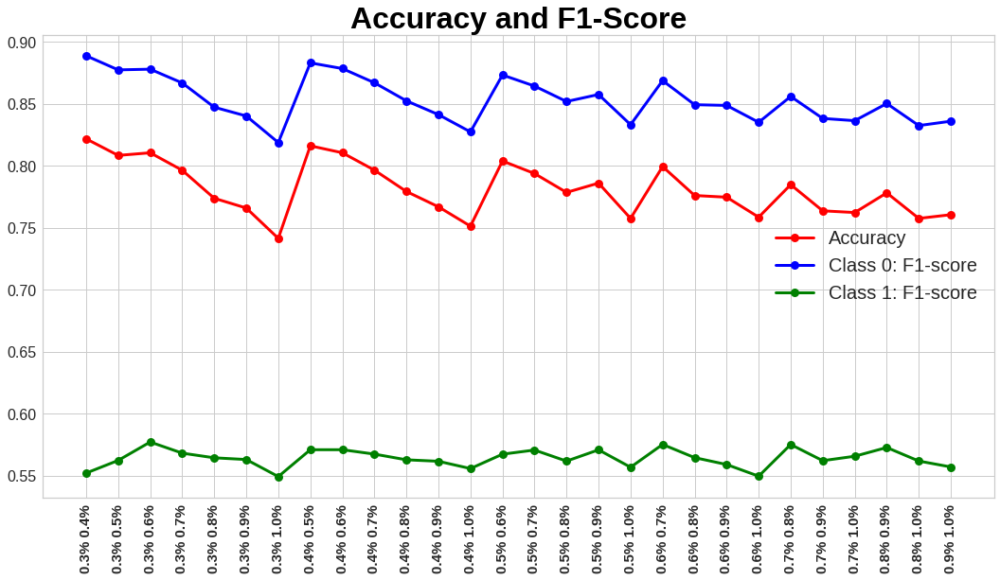

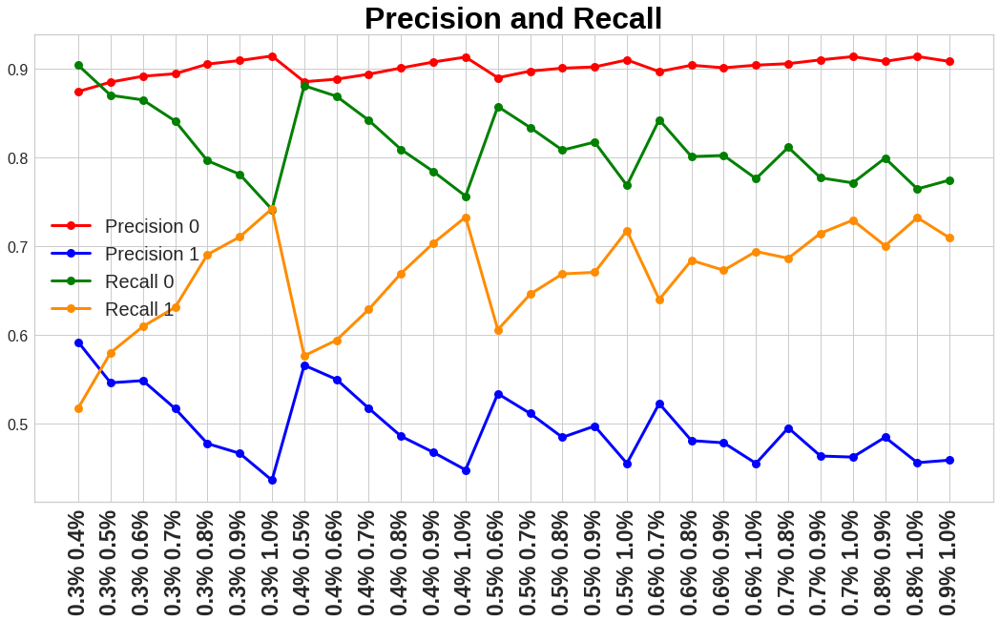

In [52]:
#Best Over/Under for full DS
Utils.best_over_under(SL_h1n1_full, min_split= 200, min_leaf = 50, seed = 42)


Resampled dataset shape Counter({0: 11040, 1: 4416})
perc_1 :  0.3
perc_2 :  0.4

Accuracy 0.820541619867715
F1-score [0.88728641 0.55997552]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      6311
           1       0.58      0.54      0.56      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.72      0.72      8013
weighted avg       0.82      0.82      0.82      8013


Resampled dataset shape Counter({0: 8832, 1: 4416})
perc_1 :  0.3
perc_2 :  0.5

Accuracy 0.8165481093223512
F1-score [0.88395958 0.56223943]
              precision    recall  f1-score   support

           0       0.88      0.89      0.88      6311
           1       0.57      0.55      0.56      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.72      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 7360, 1: 4416})
perc_1 

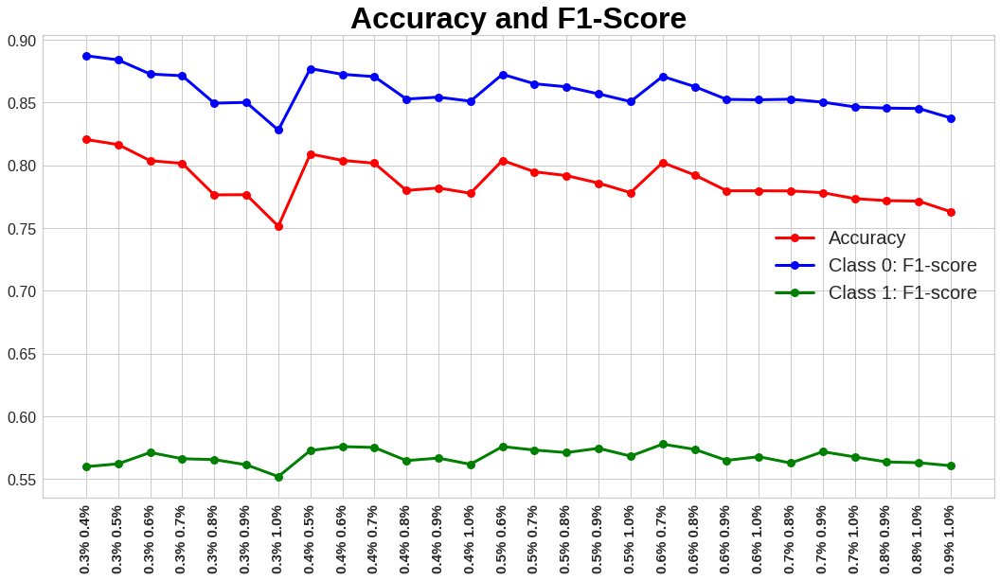

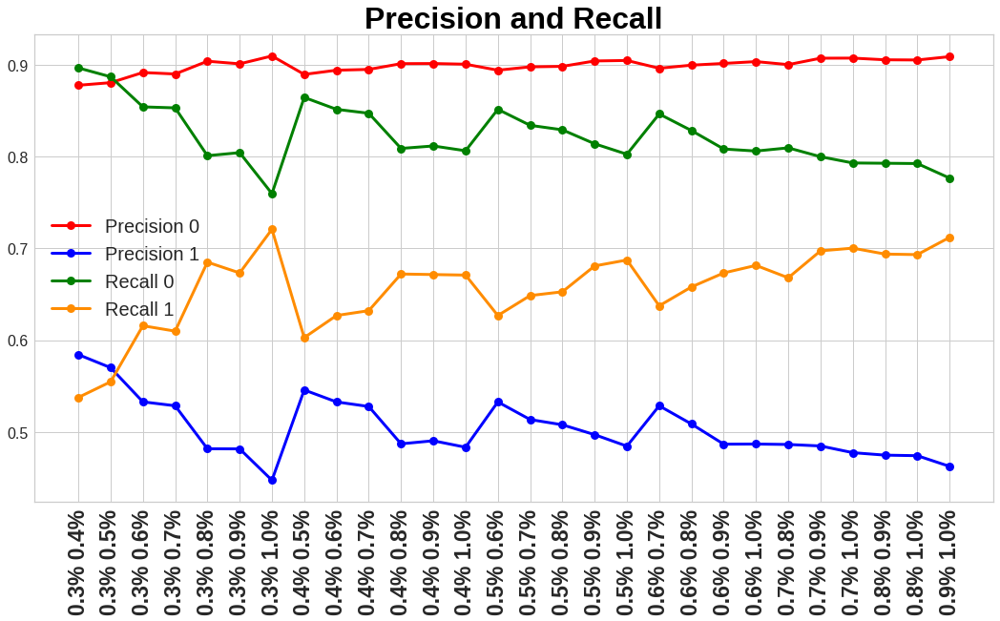

In [53]:
#Best Over/Under for H1N1 DS
Utils.best_over_under(SL_h1n1_red, min_split= 450, min_leaf = 50, seed = 42)

In [54]:
over_under_full=Utils.over_under_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42,0.3,0.6)
over_under_red=Utils.over_under_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42,0.4,0.6)

Resampled dataset shape Counter({0: 7360, 1: 4416})
Resampled dataset shape Counter({0: 9813, 1: 5888})


Full vaccine DataFrame after Over/Under sampling
Shape :
(11776, 2)


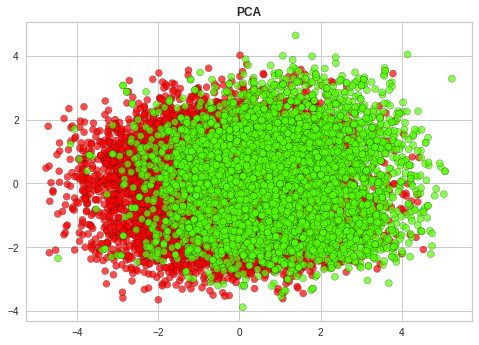

H1N1 vaccine DataFrame after Over/Under sampling
Shape :
(15701, 2)


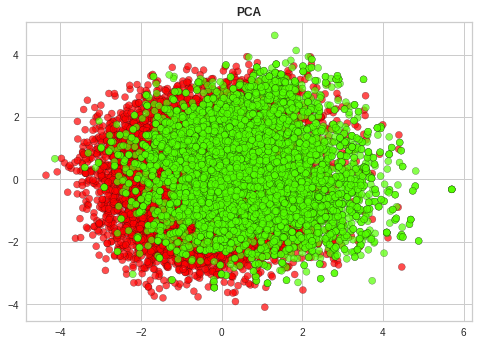

In [55]:
print('\033[1m' +'Full vaccine DataFrame after Over/Under sampling'+'\033[0m')
Utils.show_PCA(over_under_full[0],over_under_full[1])
print('\033[1m' +'H1N1 vaccine DataFrame after Over/Under sampling'+'\033[0m')
Utils.show_PCA(over_under_red[0],over_under_red[1])

In [56]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame after Over/Under sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(over_under_full[0],over_under_full[1],SL_over_under_full[3],SL_over_under_full[5], 200, 50)
clf_h1n1_over_under_full =tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier on H1N1 DataFrame after Over/Under sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(over_under_red[0],over_under_red[1],SL_over_under_red[3],SL_over_under_red[5], 450, 50)
clf_h1n1_over_under_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier on the vaccine full DataFrame after Over/Under sampling
Training set
Accuracy 0.7780230978260869
F1-score [0.82901622 0.68368829]
              precision    recall  f1-score   support

           0       0.80      0.86      0.83      7360
           1       0.73      0.64      0.68      4416

    accuracy                           0.78     11776
   macro avg       0.77      0.75      0.76     11776
weighted avg       0.77      0.78      0.77     11776

Test set
Accuracy 0.805815549731686
F1-score [0.8740285 0.5764834]
              precision    recall  f1-score   support

           0       0.89      0.86      0.87      6311
           1       0.54      0.62      0.58      1702

    accuracy                           0.81      8013
   macro avg       0.72      0.74      0.73      8013
weighted avg       0.82      0.81      0.81      8013

Decision Tree classifier on H1N1 DataFrame after Over/Under sampling
Training set
Accuracy 0.7754920068785428
F1-score [0.82

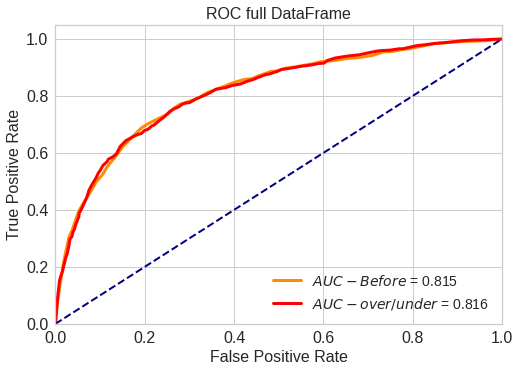

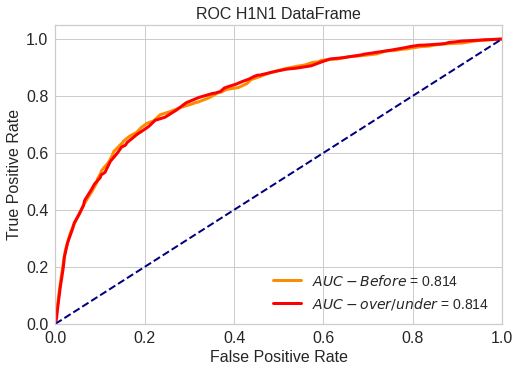

In [57]:
clf_g = [clf_h1n1_full, clf_h1n1_over_under_full]
split_list_g = [SL_h1n1_full, SL_over_under_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-over/under$ = %.3f']
color_list = ['darkorange', 'red']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_over_under_red]
split_list_g = [SL_h1n1_red, SL_over_under_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-over/under$ = %.3f']
color_list = ['darkorange', 'red']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='usm'></a>
### 2H. Under/SMOTE ([to top](#top))

We use the Random Under-sampling balancing method and  then we use the Smote sampling on the same already balanced dataset<br>
We have devised a function called "best_under_smote". <br>
The function samples the dataset in input (training set and test set) with all the possible sampling percentages before balancing the dataset with Random Under method, and After with Smote sampling.<br> For each sampling it applies the same Decision Tree Model with the best selected hyperparameters in input and gives out the performance values and the summary figures of them.<br> The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables). <br>In output to the function, the performance of the model for each percentage of sampling.<br> A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.<br>
We compare the dataset before and after balancing, showing the scatter plot of the PCA of the training sets.

In [58]:
#Temporary sampling 
under_smote_full=Utils.under_smote_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, 0.5, 0.6)
under_smote_red=Utils.under_smote_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, 0.5, 0.6)
SL_under_smote_full=list(SL_h1n1_full)
SL_under_smote_full[2]=under_smote_full[0]
SL_under_smote_full[4]=under_smote_full[1]
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after under_smotesampling'+'\033[0m')
Utils.DT_grid_sh(SL_under_smote_full, param_list)
SL_under_smote_red=list(SL_h1n1_red)
SL_under_smote_red[2]=under_smote_red[0]
SL_under_smote_red[4]=under_smote_red[1]
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after under_smotesampling'+'\033[0m')
Utils.DT_grid_sh(SL_under_smote_red, param_list)

Resampled dataset shape Counter({0: 7944, 1: 4766})
Resampled dataset shape Counter({0: 7944, 1: 4766})
Grid search on the vaccine full DataFrame after under_smotesampling
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame after under_smotesampling
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 


Resampled dataset shape Counter({0: 13240, 1: 5296})
perc_1 :  0.3
perc_2 :  0.4

Accuracy 0.820167228254087
F1-score [0.88706011 0.55892256]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      6311
           1       0.58      0.54      0.56      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.72      0.72      8013
weighted avg       0.82      0.82      0.82      8013


Resampled dataset shape Counter({0: 13240, 1: 6620})
perc_1 :  0.3
perc_2 :  0.5

Accuracy 0.8065643329589417
F1-score [0.87574154 0.56362613]
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      6311
           1       0.54      0.59      0.56      1702

    accuracy                           0.81      8013
   macro avg       0.71      0.73      0.72      8013
weighted avg       0.81      0.81      0.81      8013


Resampled dataset shape Counter({0: 13240, 1: 7944})
perc_

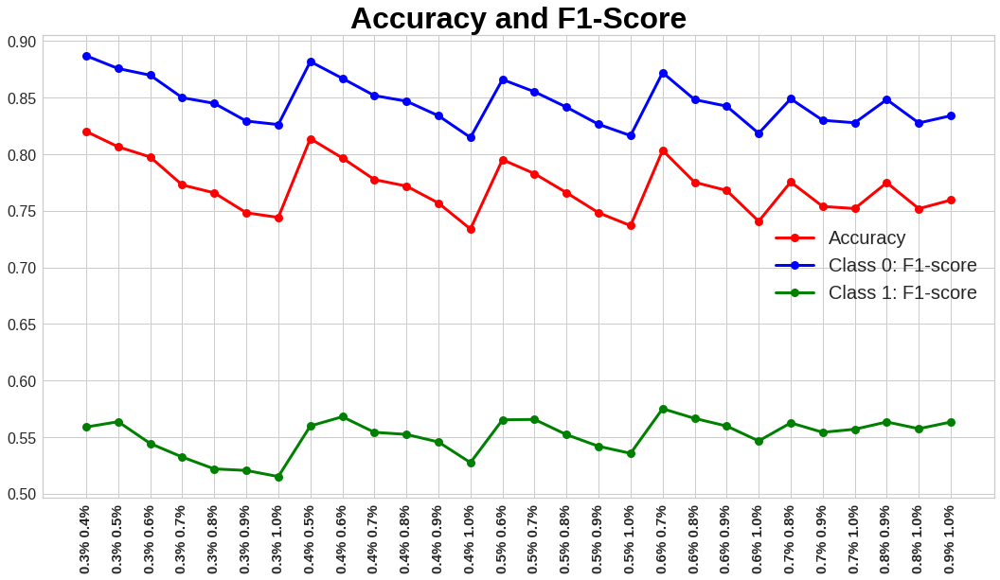

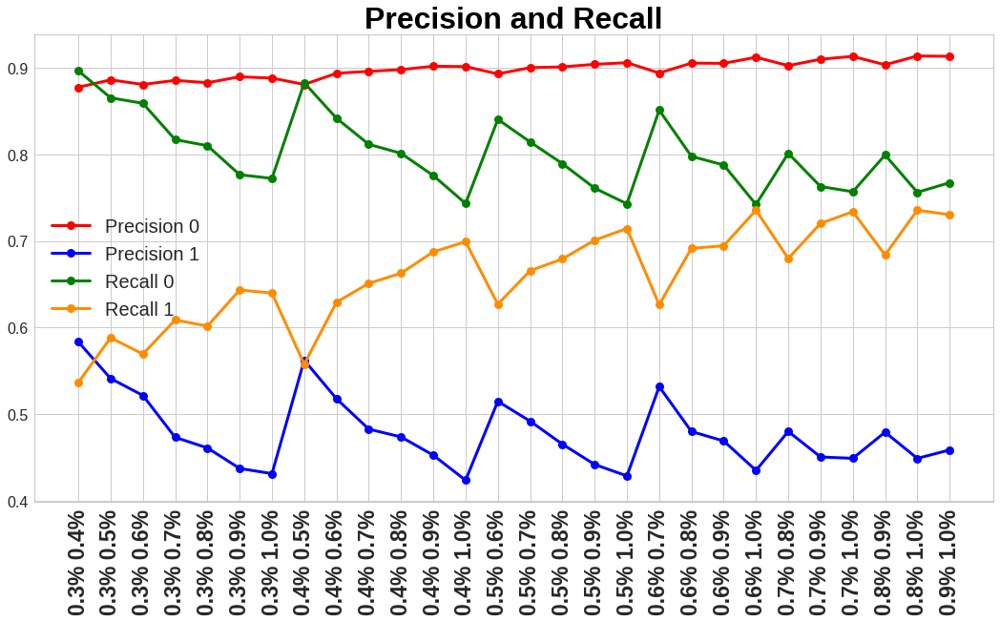

In [59]:
#Best Under/SMOTE for full DS
Utils.best_under_smote(SL_h1n1_full, min_split= 200, min_leaf = 50, seed = 42)


Resampled dataset shape Counter({0: 13240, 1: 5296})
perc_1 :  0.3
perc_2 :  0.4

Accuracy 0.8187944590041183
F1-score [0.88618906 0.55569155]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      6311
           1       0.58      0.53      0.56      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.71      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 13240, 1: 6620})
perc_1 :  0.3
perc_2 :  0.5

Accuracy 0.8146761512542119
F1-score [0.88317206 0.5520362 ]
              precision    recall  f1-score   support

           0       0.88      0.89      0.88      6311
           1       0.57      0.54      0.55      1702

    accuracy                           0.81      8013
   macro avg       0.72      0.71      0.72      8013
weighted avg       0.81      0.81      0.81      8013


Resampled dataset shape Counter({0: 13240, 1: 7944})
perc

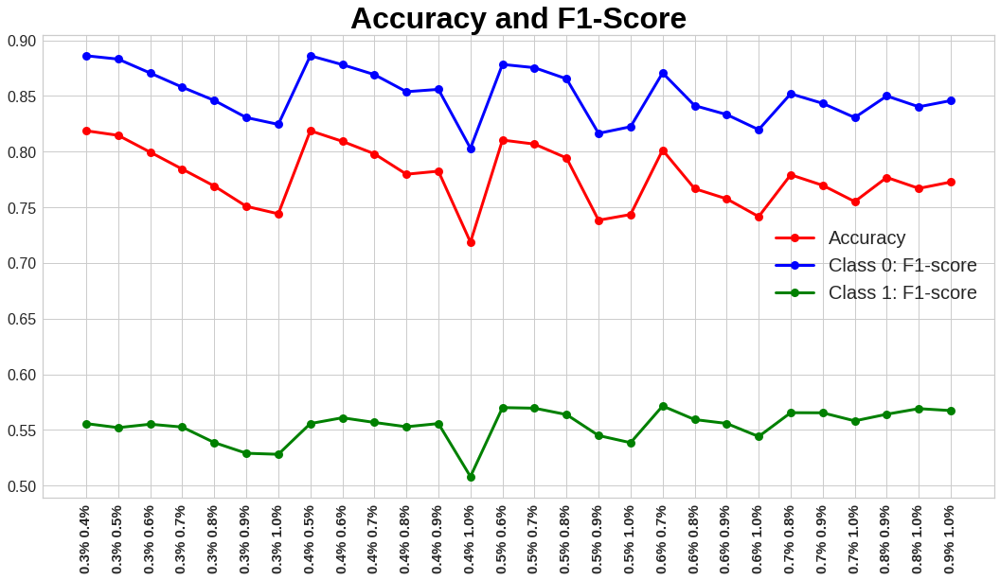

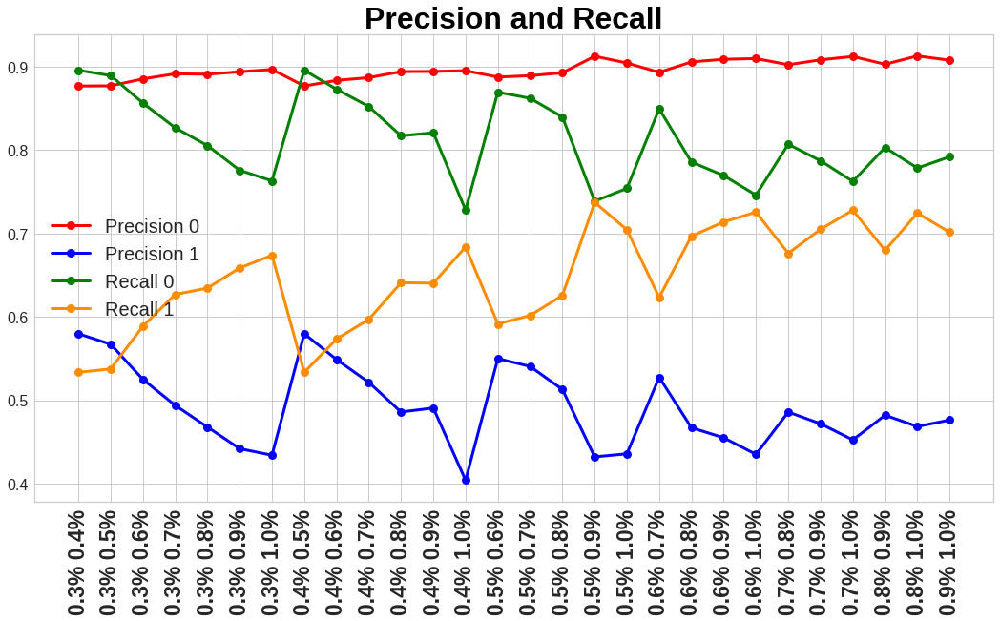

In [60]:
#Best Under/SMOTE for H1N1 DS
Utils.best_under_smote(SL_h1n1_red, min_split= 450, min_leaf = 50, seed = 42)

In [61]:
under_smote_full=Utils.under_smote_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42,0.6,0.7)
under_smote_red=Utils.under_smote_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42,0.5,0.6)

Resampled dataset shape Counter({0: 6620, 1: 4634})
Resampled dataset shape Counter({0: 7944, 1: 4766})


Full vaccine DataFrame after Under/SMOTE sampling
Shape :
(11254, 2)


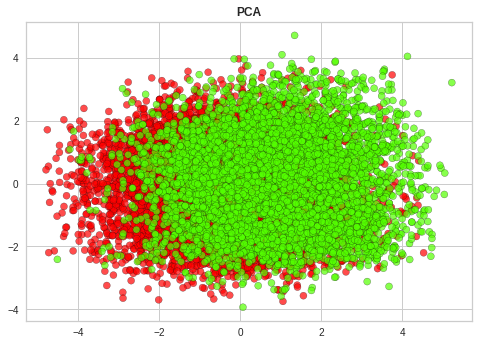

H1N1 vaccine DataFrame after Under/SMOTE sampling
Shape :
(12710, 2)


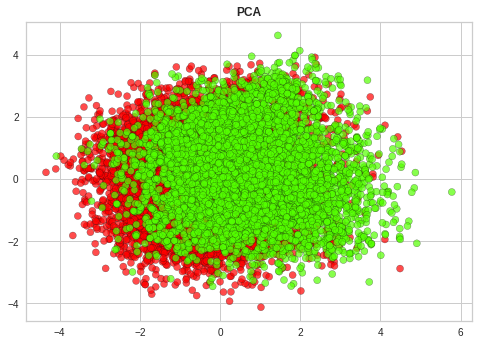

In [62]:
print('\033[1m' +'Full vaccine DataFrame after Under/SMOTE sampling'+'\033[0m')
Utils.show_PCA(under_smote_full[0],under_smote_full[1])
print('\033[1m' +'H1N1 vaccine DataFrame after Under/SMOTE sampling'+'\033[0m')
Utils.show_PCA(under_smote_red[0],under_smote_red[1])

In [63]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame after Under/SMOTE sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(under_smote_full[0],under_smote_full[1],SL_under_smote_full[3],SL_under_smote_full[5], 200, 50)
clf_h1n1_under_smote_full =tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier on H1N1 DataFrame after Under/SMOTE sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(under_smote_red[0],under_smote_red[1],SL_under_smote_red[3],SL_under_smote_red[5], 450, 50)
clf_h1n1_under_smote_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier on the vaccine full DataFrame after Under/SMOTE sampling
Training set
Accuracy 0.7624844499733429
F1-score [0.80916685 0.6855664 ]
              precision    recall  f1-score   support

           0       0.77      0.86      0.81      6620
           1       0.75      0.63      0.69      4634

    accuracy                           0.76     11254
   macro avg       0.76      0.74      0.75     11254
weighted avg       0.76      0.76      0.76     11254

Test set
Accuracy 0.8034444028453762
F1-score [0.87214871 0.57512814]
              precision    recall  f1-score   support

           0       0.89      0.85      0.87      6311
           1       0.53      0.63      0.58      1702

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.80      0.81      8013

Decision Tree classifier on H1N1 DataFrame after Under/SMOTE sampling
Training set
Accuracy 0.7655389457120377
F1-score 

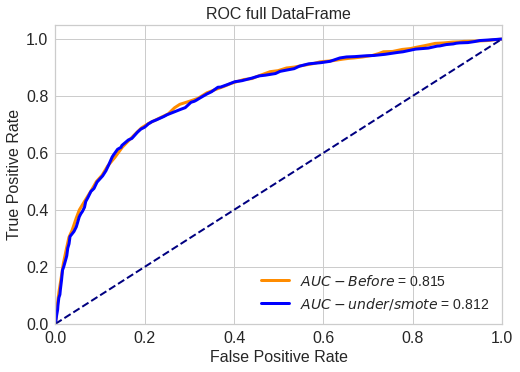

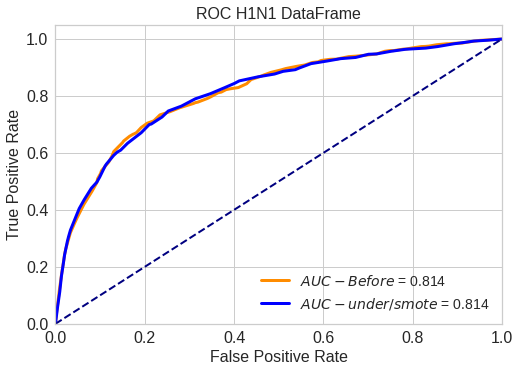

In [64]:
clf_g = [clf_h1n1_full, clf_h1n1_under_smote_full]
split_list_g = [SL_h1n1_full, SL_under_smote_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-under/smote$ = %.3f']
color_list = ['darkorange', 'blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_under_smote_red]
split_list_g = [SL_h1n1_red, SL_under_smote_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-under/smote$ = %.3f']
color_list = ['darkorange', 'blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='osm'></a>
### 2I. Over/SMOTE ([to top](#top))

We use the Random Over-Sampling balancing method and then we use the Smote sampling on the same already balanced dataset<br>
We have devised a function called "best_over_smote". <br>
The function samples the dataset in input (training set and test set) with all the possible sampling percentages before balancing the dataset with Random Over method, and after with Smote sampling.<br> For each sampling it applies the same Decision Tree Model with the best selected hyperparameters in input and gives out the performance values and the summary figures of them.<br> The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables). <br>In output to the function, the performance of the model for each percentage of sampling.<br> A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.<br>
We compare the dataset before and after balancing, showing the scatter plot of the PCA of the training sets.

In [65]:
#Temporary sampling 
over_smote_full=Utils.over_smote_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, 0.5, 0.6)
over_smote_red=Utils.over_smote_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, 0.5, 0.6)
SL_over_smote_full=list(SL_h1n1_full)
SL_over_smote_full[2]=over_smote_full[0]
SL_over_smote_full[4]=over_smote_full[1]
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after over_smotesampling'+'\033[0m')
Utils.DT_grid_sh(SL_over_smote_full, param_list)
SL_over_smote_red=list(SL_h1n1_red)
SL_over_smote_red[2]=over_smote_red[0]
SL_over_smote_red[4]=over_smote_red[1]
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after over_smotesampling'+'\033[0m')
Utils.DT_grid_sh(SL_over_smote_red, param_list)

Resampled dataset shape Counter({0: 14722, 1: 8833})
Resampled dataset shape Counter({0: 14722, 1: 8833})
Grid search on the vaccine full DataFrame after over_smotesampling
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame after over_smotesampling
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 


Resampled dataset shape Counter({0: 14722, 1: 5888})
perc_1 :  0.3
perc_2 :  0.4

Accuracy 0.8234119555721952
F1-score [0.89052224 0.54369558]
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      6311
           1       0.60      0.50      0.54      1702

    accuracy                           0.82      8013
   macro avg       0.74      0.70      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 14722, 1: 7361})
perc_1 :  0.3
perc_2 :  0.5

Accuracy 0.8056907525271434
F1-score [0.8761829  0.54882643]
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      6311
           1       0.54      0.56      0.55      1702

    accuracy                           0.81      8013
   macro avg       0.71      0.71      0.71      8013
weighted avg       0.81      0.81      0.81      8013


Resampled dataset shape Counter({0: 14722, 1: 8833})
perc

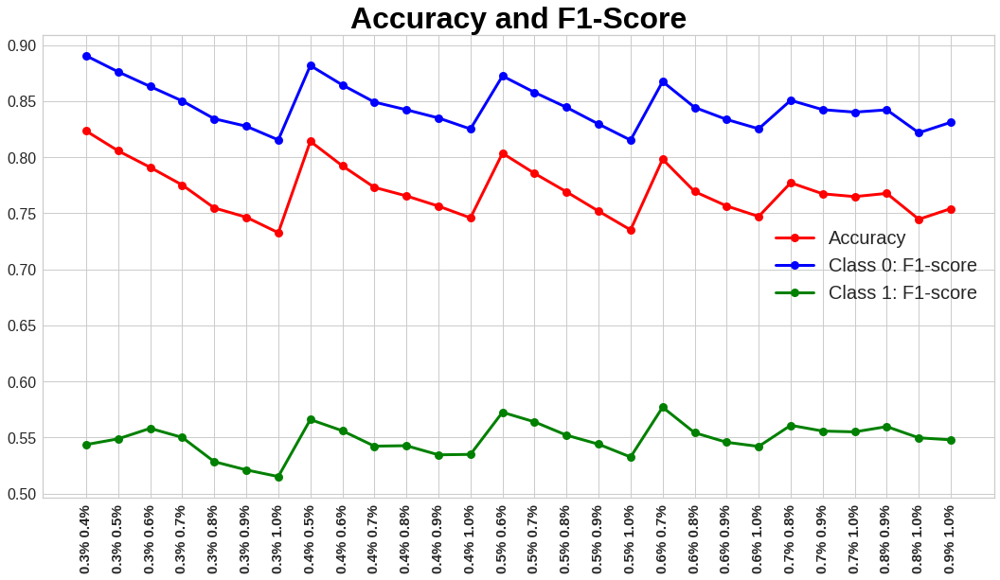

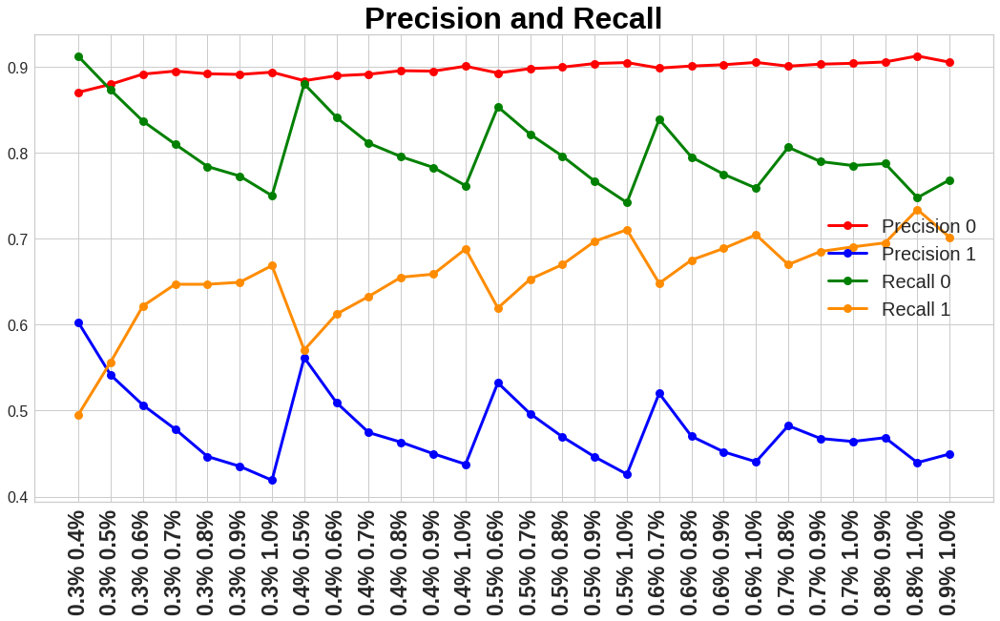

In [66]:
#Best Over/SMOTE for full DS
Utils.best_over_smote(SL_h1n1_full, min_split= 200, min_leaf = 50, seed = 42)


Resampled dataset shape Counter({0: 14722, 1: 5888})
perc_1 :  0.3
perc_2 :  0.4

Accuracy 0.820541619867715
F1-score [0.888302   0.54378173]
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      6311
           1       0.59      0.50      0.54      1702

    accuracy                           0.82      8013
   macro avg       0.73      0.70      0.72      8013
weighted avg       0.81      0.82      0.82      8013


Resampled dataset shape Counter({0: 14722, 1: 7361})
perc_1 :  0.3
perc_2 :  0.5

Accuracy 0.8098090602770498
F1-score [0.87939221 0.55044248]
              precision    recall  f1-score   support

           0       0.88      0.88      0.88      6311
           1       0.55      0.55      0.55      1702

    accuracy                           0.81      8013
   macro avg       0.72      0.71      0.71      8013
weighted avg       0.81      0.81      0.81      8013


Resampled dataset shape Counter({0: 14722, 1: 8833})
perc_

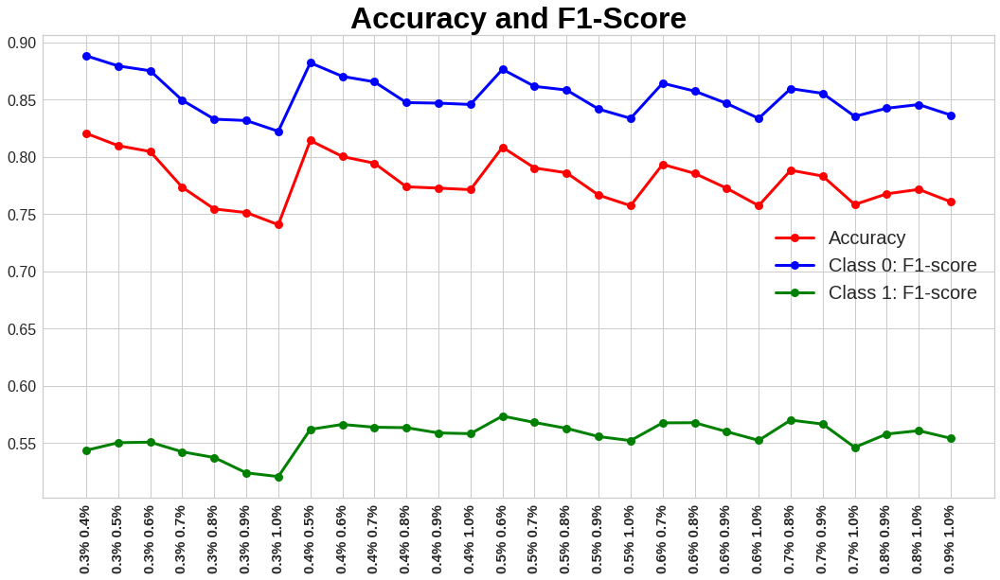

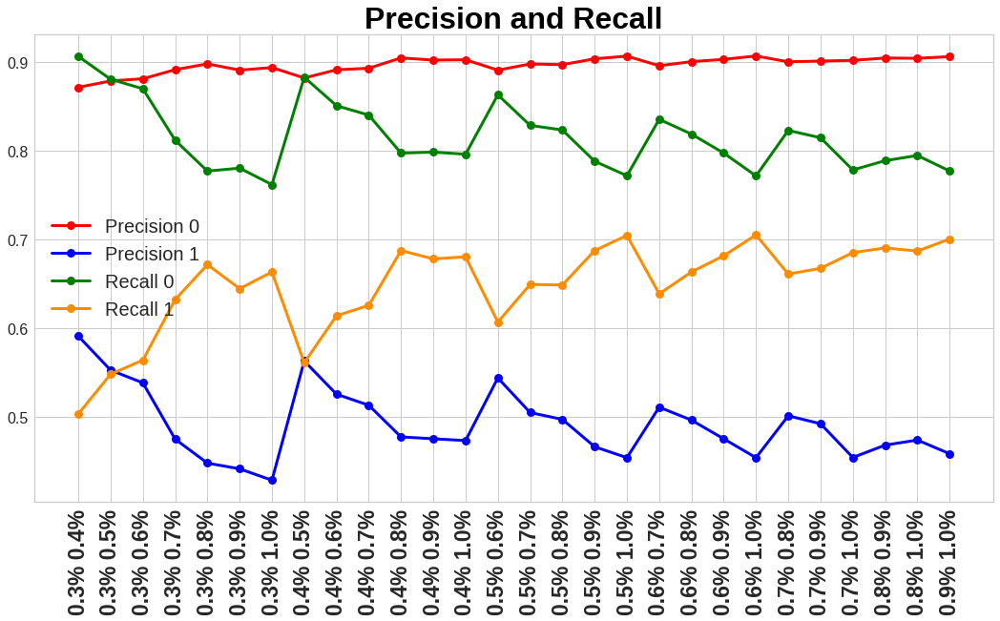

In [67]:
#Best Over/SMOTE for H1N1 DS
Utils.best_over_smote(SL_h1n1_red, min_split= 450, min_leaf = 50, seed = 42)

In [68]:
over_smote_full=Utils.over_smote_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42,0.6,0.7)
over_smote_red=Utils.over_smote_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42,0.5,0.6)

Resampled dataset shape Counter({0: 14722, 1: 10305})
Resampled dataset shape Counter({0: 14722, 1: 8833})


Full vaccine DataFrame after Over/SMOTE sampling
Shape :
(25027, 2)


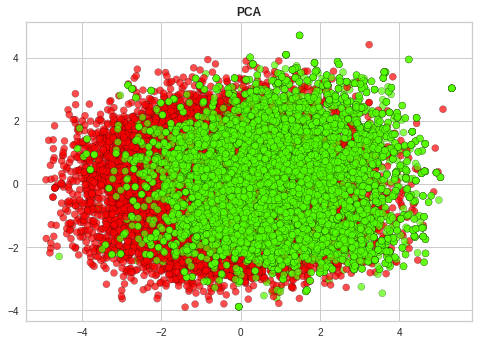

H1N1 vaccine DataFrame after Over/SMOTE sampling
Shape :
(23555, 2)


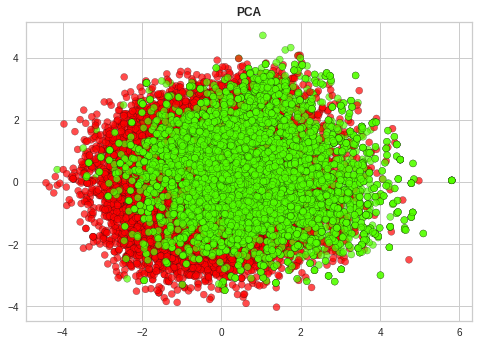

In [69]:
print('\033[1m' +'Full vaccine DataFrame after Over/SMOTE sampling'+'\033[0m')
Utils.show_PCA(over_smote_full[0],over_smote_full[1])
print('\033[1m' +'H1N1 vaccine DataFrame after Over/SMOTE sampling'+'\033[0m')
Utils.show_PCA(over_smote_red[0],over_smote_red[1])

In [70]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame after Over/SMOTE sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(over_smote_full[0],over_smote_full[1],SL_over_smote_full[3],SL_over_smote_full[5], 200, 50)
clf_h1n1_over_smote_full =tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier on H1N1 DataFrame after Over/SMOTE sampling'+'\033[0m')
tmp=Utils.Model_Eval_DT(over_smote_red[0],over_smote_red[1],SL_over_smote_red[3],SL_over_smote_red[5], 450, 50)
clf_h1n1_over_smote_red = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier on the vaccine full DataFrame after Over/SMOTE sampling
Training set
Accuracy 0.7732448955128461
F1-score [0.81459701 0.7081512 ]
              precision    recall  f1-score   support

           0       0.78      0.85      0.81     14722
           1       0.75      0.67      0.71     10305

    accuracy                           0.77     25027
   macro avg       0.77      0.76      0.76     25027
weighted avg       0.77      0.77      0.77     25027

Test set
Accuracy 0.7982029202545863
F1-score [0.8674916  0.57703374]
              precision    recall  f1-score   support

           0       0.90      0.84      0.87      6311
           1       0.52      0.65      0.58      1702

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.80      0.81      8013

Decision Tree classifier on H1N1 DataFrame after Over/SMOTE sampling
Training set
Accuracy 0.7743578857991934
F1-score [0

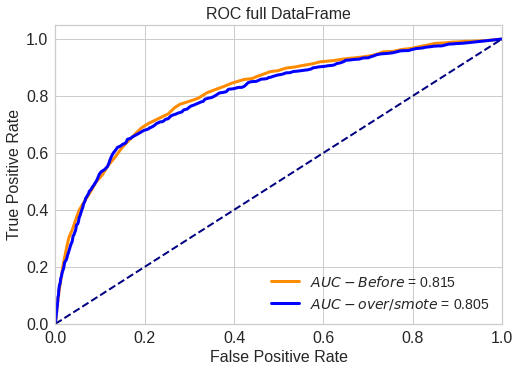

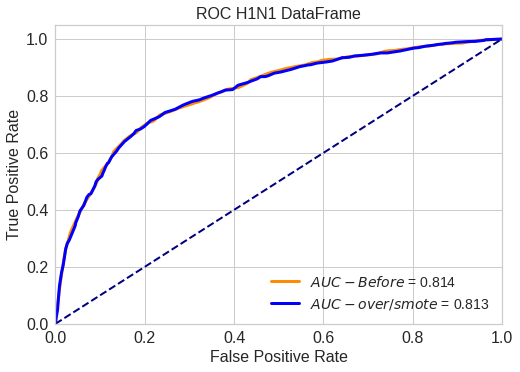

In [71]:
clf_g = [clf_h1n1_full, clf_h1n1_over_smote_full]
split_list_g = [SL_h1n1_full, SL_over_smote_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-over/smote$ = %.3f']
color_list = ['darkorange', 'blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_over_smote_red]
split_list_g = [SL_h1n1_red, SL_over_smote_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-over/smote$ = %.3f']
color_list = ['darkorange', 'blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='cw'></a>
### 2J. Class weight ([to top](#top))

We use the Class Weight method.<br>
Giving different weights to both the majority and minority classes.<br> The difference in weights will influence the classification of the classes during the training phase.<br> The whole purpose is to penalize the misclassification made by the minority class by setting a higher class weight and at the same time reducing weight for the majority class.<br>
Before we Grid search on the vaccine full and reduced  DataFrame after class_weight.
After this, we give  different % weight to the class 0 and class 1 into the Decision Tree classifier.
For each  it applies the same Decision Tree Model with the best selected hyperparameters found at the beginning and gives out the performance values and the summary figures of them.<br>
The balancing was carried out on both the full and reduced H1n1 vaccine (datasets with new variables).
In output to the function, the performance of the model for each percentage of class weight.<br>
A summary figure of the Accuracy trend, F1-score, Precision, Recall for each percentage of sampling carried out on the dataset. It also compares the different roc curves for each.
We compare the dataset before and after balancing, showing the scatter plot of the PCA of the training sets.



In [72]:
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame after class_weight'+'\033[0m')
Utils.DT_grid_sh_weight(SL_h1n1_full, param_list,2,8)
#grid search h1n1 red
print('\033[1m' +'Grid search on the H1N1 DataFrame after class_weight'+'\033[0m')
Utils.DT_grid_sh_weight(SL_h1n1_red, param_list,2,8)

Grid search on the vaccine full DataFrame after class_weight
Mean validation score: 0.75381 (std: 0.02150)
Parameters: {'min_samples_leaf': 450, 'min_samples_split': 50}

Mean validation score: 0.75381 (std: 0.02150)
Parameters: {'min_samples_leaf': 450, 'min_samples_split': 100}

Mean validation score: 0.75381 (std: 0.02150)
Parameters: {'min_samples_leaf': 450, 'min_samples_split': 150}

Mean validation score: 0.75381 (std: 0.02150)
Parameters: {'min_samples_leaf': 450, 'min_samples_split': 200}

Mean validation score: 0.75381 (std: 0.02150)
Parameters: {'min_samples_leaf': 450, 'min_samples_split': 250}

Mean validation score: 0.75381 (std: 0.02150)
Parameters: {'min_samples_leaf': 450, 'min_samples_split': 300}

Mean validation score: 0.75381 (std: 0.02150)
Parameters: {'min_samples_leaf': 450, 'min_samples_split': 350}

Mean validation score: 0.75381 (std: 0.02150)
Parameters: {'min_samples_leaf': 450, 'min_samples_split': 400}

Mean validation score: 0.75381 (std: 0.02150)
Parame


 [class 0: 0 /class 1: 10 ]

Training set
Accuracy 0.21247459077778966
F1-score [0.        0.3504809]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     14722
           1       0.21      1.00      0.35      3972

    accuracy                           0.21     18694
   macro avg       0.11      0.50      0.18     18694
weighted avg       0.05      0.21      0.07     18694

Test set
Accuracy 0.21240484213153626
F1-score [0.       0.350386]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      6311
           1       0.21      1.00      0.35      1702

    accuracy                           0.21      8013
   macro avg       0.11      0.50      0.18      8013
weighted avg       0.05      0.21      0.07      8013


 [class 0: 1 /class 1: 9 ]

Training set
Accuracy 0.6065582539852359
F1-score [0.68012004 0.4890587 ]
              precision    recall  f1-score   support

           0      

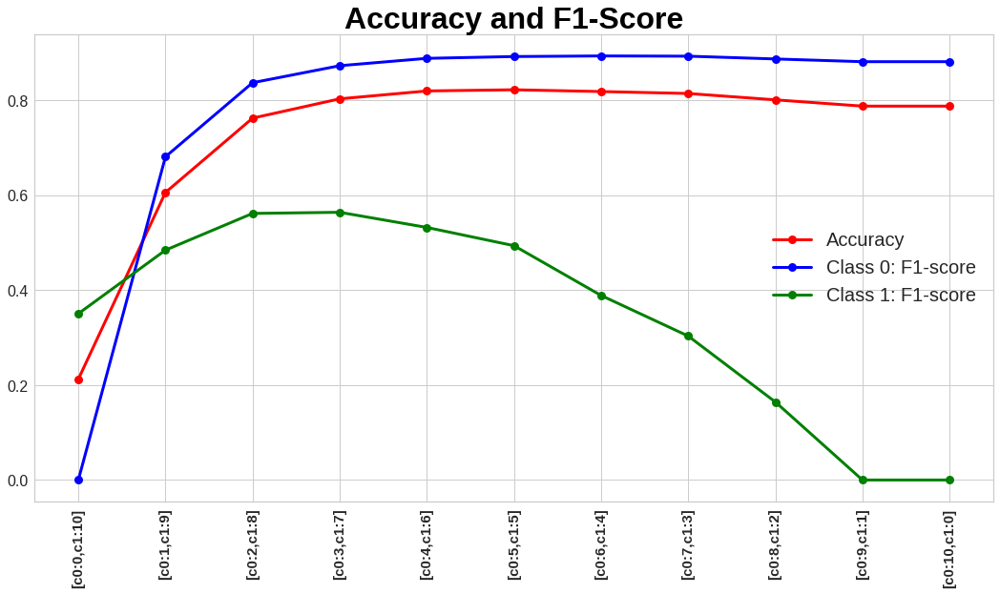

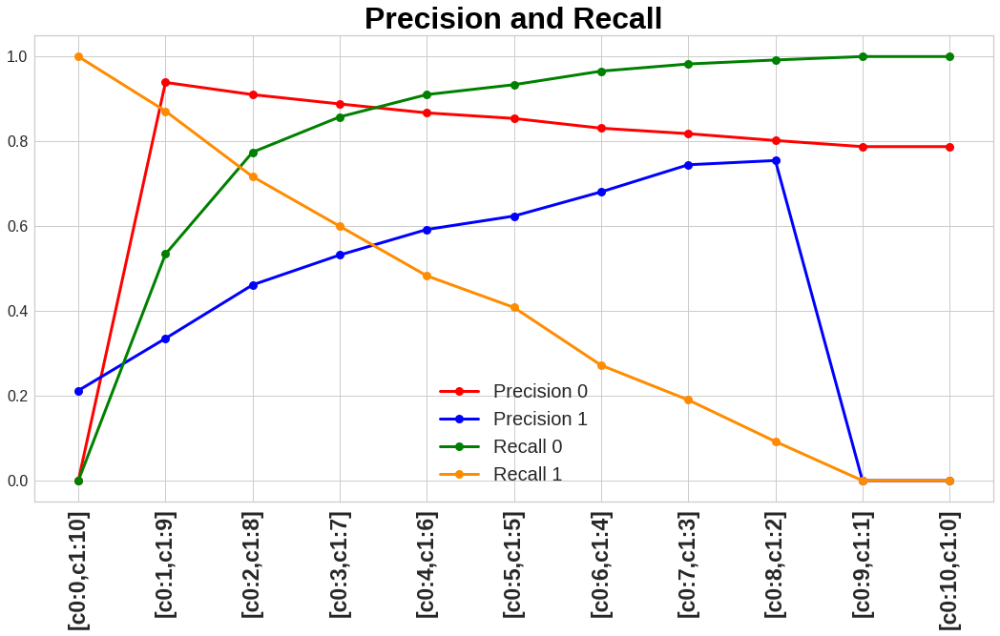

In [73]:
#Best Weight for full DS
Utils.best_weight(SL_h1n1_full, min_split= 50, min_leaf = 450, seed = 42)


 [class 0: 0 /class 1: 10 ]

Training set
Accuracy 0.21247459077778966
F1-score [0.        0.3504809]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     14722
           1       0.21      1.00      0.35      3972

    accuracy                           0.21     18694
   macro avg       0.11      0.50      0.18     18694
weighted avg       0.05      0.21      0.07     18694

Test set
Accuracy 0.21240484213153626
F1-score [0.       0.350386]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      6311
           1       0.21      1.00      0.35      1702

    accuracy                           0.21      8013
   macro avg       0.11      0.50      0.18      8013
weighted avg       0.05      0.21      0.07      8013


 [class 0: 1 /class 1: 9 ]

Training set
Accuracy 0.6019043543382904
F1-score [0.67416813 0.48845202]
              precision    recall  f1-score   support

           0      

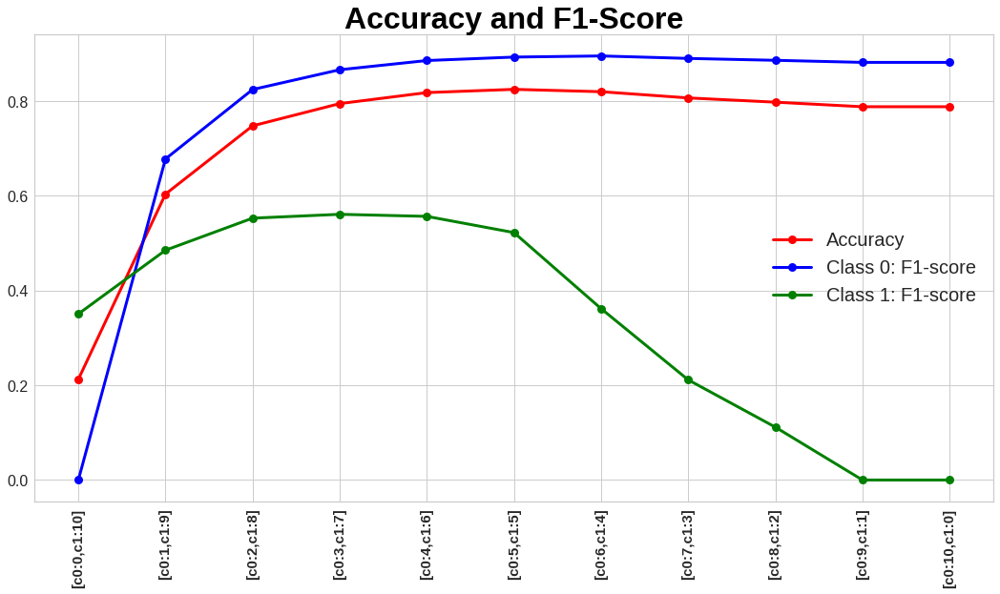

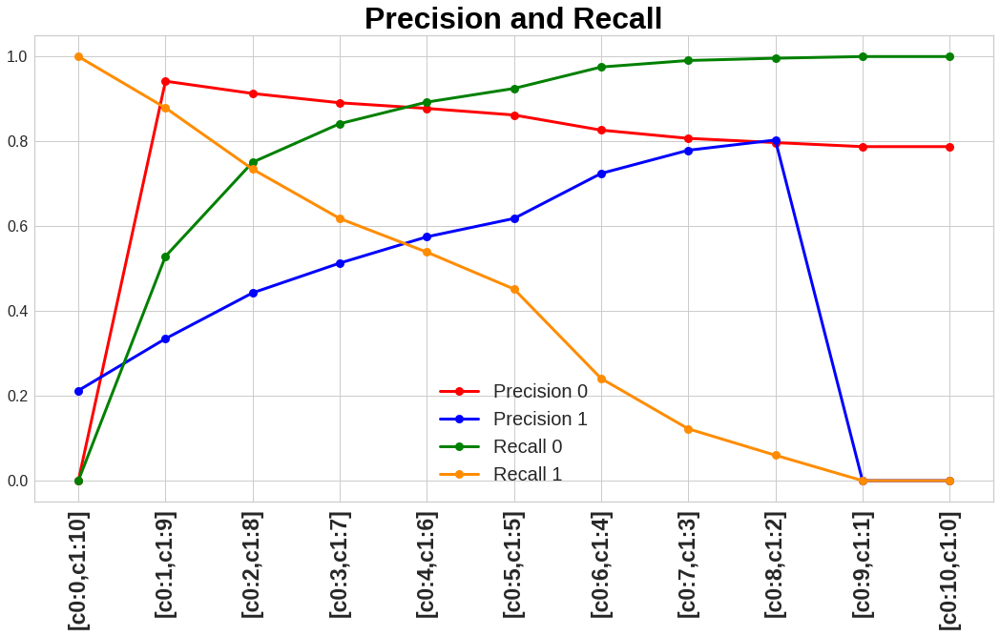

In [74]:
#Best Weight for H1N1 DS
Utils.best_weight(SL_h1n1_red, min_split= 50, min_leaf = 250, seed = 42)

In [75]:
print('\033[1m' +'Decision Tree classifier before balancing on the vaccine full DataFrame'+'\033[0m')
tmp=Utils.Model_Eval_DT_weight(SL_h1n1_full[2],SL_h1n1_full[4],SL_h1n1_full[3],SL_h1n1_full[5], 50, 200, {0:3,1:7})
clf_h1n1_full_weight = tmp[0]
acc_train_full=acc_train_full+tmp[1]
acc_test_full=acc_test_full+tmp[3]
F1_train_full=F1_train_full+tmp[2]
F1_test_full=F1_test_full+tmp[4]
precision_0_full_train = precision_0_full_train + [tmp[5]]
precision_1_full_train = precision_1_full_train + [tmp[6]]
recall_0_full_train = recall_0_full_train + [tmp[7]]
recall_1_full_train = recall_1_full_train + [tmp[8]]
precision_0_full_test = precision_0_full_test + [tmp[9]]
precision_1_full_test = precision_1_full_test + [tmp[10]]
recall_0_full_test = recall_0_full_test + [tmp[11]]
recall_1_full_test = recall_1_full_test + [tmp[12]]
print('\033[1m' +'Decision Tree classifier before balancing on the H1N1 DataFrame'+'\033[0m')
tmp= Utils.Model_Eval_DT_weight(SL_h1n1_red[2],SL_h1n1_red[4],SL_h1n1_red[3],SL_h1n1_red[5], 400, 50, {0:3,1:7})
clf_h1n1_red_weight = tmp[0]
acc_train_red=acc_train_red+tmp[1]
acc_test_red=acc_test_red+tmp[3]
F1_train_red=F1_train_red+tmp[2]
F1_test_red=F1_test_red+tmp[4]
precision_0_red_train = precision_0_red_train + [tmp[5]]
precision_1_red_train = precision_1_red_train + [tmp[6]]
recall_0_red_train = recall_0_red_train + [tmp[7]]
recall_1_red_train = recall_1_red_train + [tmp[8]]
precision_0_red_test = precision_0_red_test + [tmp[9]]
precision_1_red_test = precision_1_red_test + [tmp[10]]
recall_0_red_test = recall_0_red_test + [tmp[11]]
recall_1_red_test = recall_1_red_test + [tmp[12]]

Decision Tree classifier before balancing on the vaccine full DataFrame
Training set
Accuracy 0.8109553867551086
F1-score [0.87725757 0.58887855]
              precision    recall  f1-score   support

           0       0.90      0.86      0.88     14722
           1       0.55      0.64      0.59      3972

    accuracy                           0.81     18694
   macro avg       0.72      0.75      0.73     18694
weighted avg       0.82      0.81      0.82     18694

Test set
Accuracy 0.8011980531636091
F1-score [0.87068756 0.57027246]
              precision    recall  f1-score   support

           0       0.89      0.85      0.87      6311
           1       0.53      0.62      0.57      1702

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.80      0.81      8013

Decision Tree classifier before balancing on the H1N1 DataFrame
Training set
Accuracy 0.8091901144752327
F1-score [0.87533639 0.59

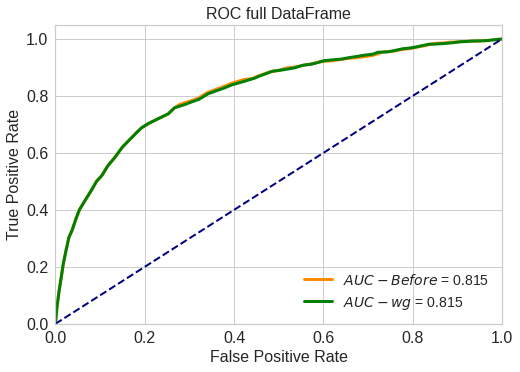

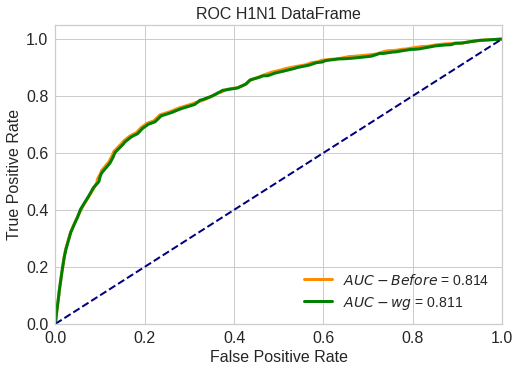

In [76]:
clf_g = [clf_h1n1_full, clf_h1n1_full_weight]
split_list_g = [SL_h1n1_full, SL_h1n1_full]
label_list = ['$AUC-Before$ = %.3f', '$AUC-wg$ = %.3f']
color_list = ['darkorange', 'green']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 2)
clf_g = [clf_h1n1_red, clf_h1n1_red_weight]
split_list_g = [SL_h1n1_red, SL_h1n1_red]
label_list = ['$AUC-Before$ = %.3f', '$AUC-wg$ = %.3f']
color_list = ['darkorange', 'green']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC H1N1 DataFrame', label_list, color_list, 2)

<a id='bt'></a>
### 2K. Best balancing technique ([to top](#top))

We compared the best percentages sampling for each method. <br>
The winner methodology was chosen, comparing the performance of the same classifier
after balancing the dataset with the best sampling percentage of each method.<br>
The Best compared method  was carried out on both the full and reduced H1n1 vaccine (datasets with new variables).<br>
The performance of the model for each method.<br>
A summary figure of the Accuracy trend, F1-score, Precision, Recall for each method carried out on the dataset. It also compares the different Roc curve and Auc for each.<br>
We compared the performance of the classifier on both training and testing data<br>

<b>Conclusion:</b>
The winner methodology was chosen,comparing the performance of the same classifier
after balancing the dataset with the best sampling percentage of each methodology.<br>
We noticed that the recall and precision values for each class are symmetrical, that is, as one value increases, the other decreases and viceversa.<br>
In the end we decided that choosing the best method is to compromise between a Best F1-score of class 1 and a good value of Accurancy and Auc.<br>
For the H1n1 vaccine (reduced with new variables),the winner is the Under Sampling with a
sampling rate of 0.6, with a Accurancy (0,81) and Auc (0,817) ,which remain similar to pre-sampling, and there is an improvement in the F1-score of class 1, which has changed from a value of 0.51 to a maximum value of 0.58. <br>In the figure below we can see the scatter plot of pca of dataset h1n1 vaccine (reduced with new variables), where we can see the distribution of label class, before and after Under sampling.<br>
Despite having explored many balancing methods, we have reached a satisfactory final result, but not as desired, as class 1 improves, but only slightly.




Full vaccine DataFrame train & test


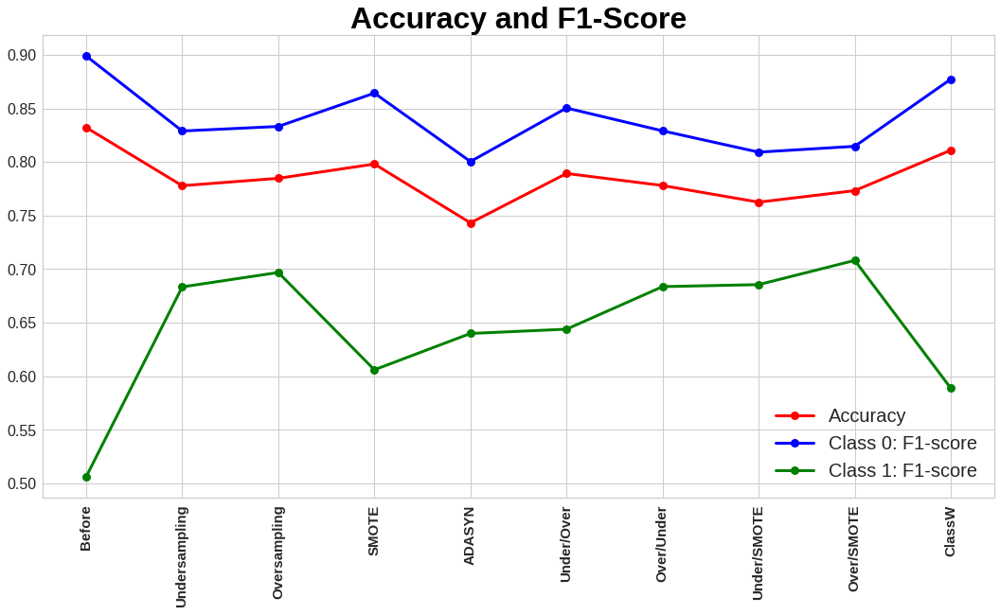

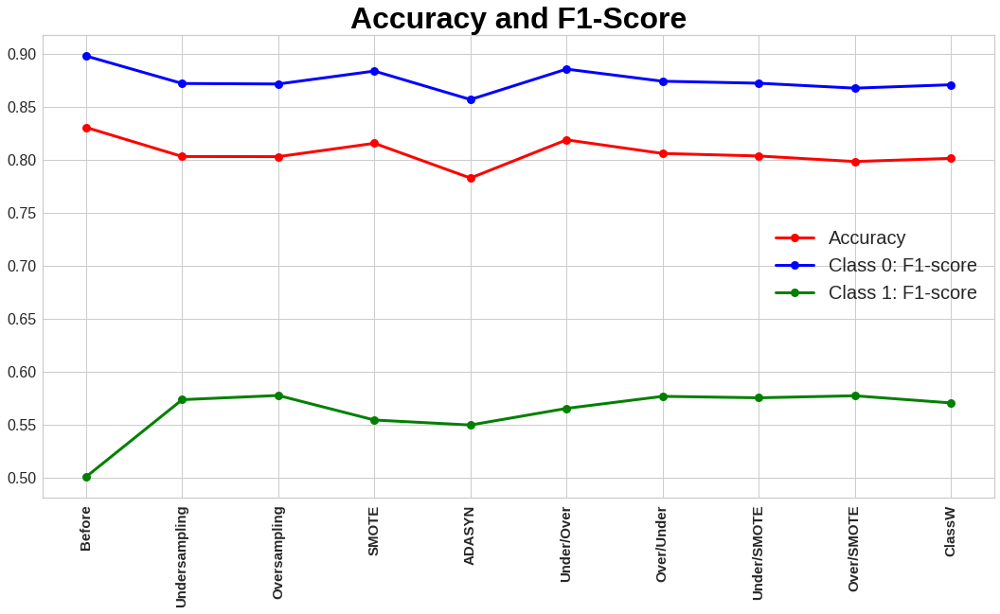

In [77]:
print('\033[1m' +'Full vaccine DataFrame train & test'+'\033[0m')
Utils.acc_F1_table(acc_train_full,F1_train_full,['red','blue','green'],['Before','Undersampling','Oversampling','SMOTE', 'ADASYN','Under/Over','Over/Under','Under/SMOTE','Over/SMOTE','ClassW'],10)
Utils.acc_F1_table(acc_test_full,F1_test_full,['red','blue','green'],['Before','Undersampling','Oversampling','SMOTE', 'ADASYN','Under/Over','Over/Under','Under/SMOTE','Over/SMOTE','ClassW'],10)

Full vaccine DataFrame train & test


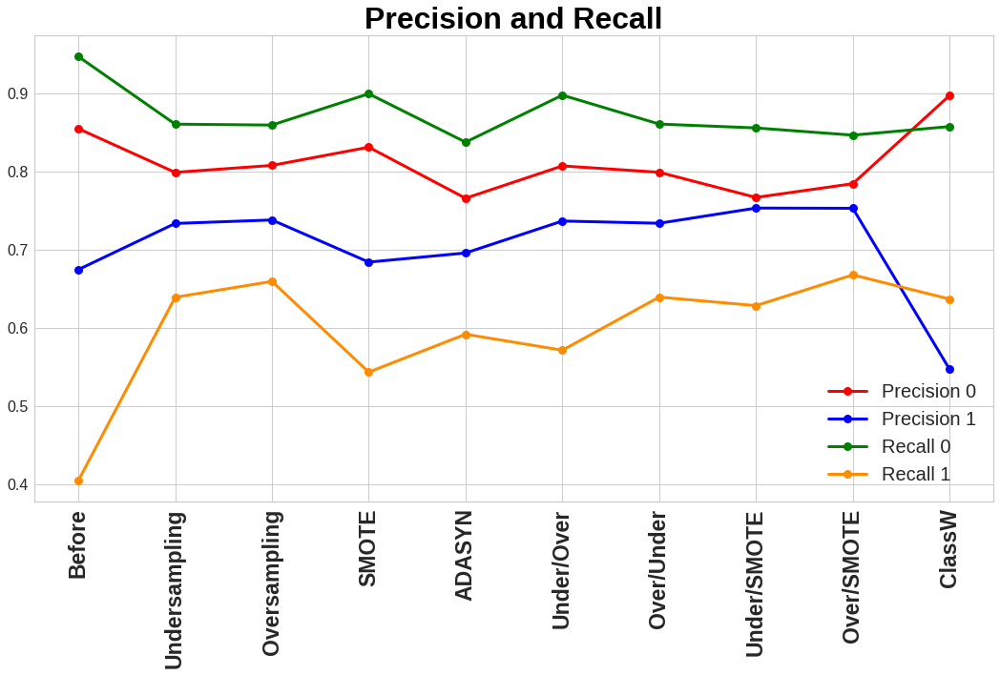

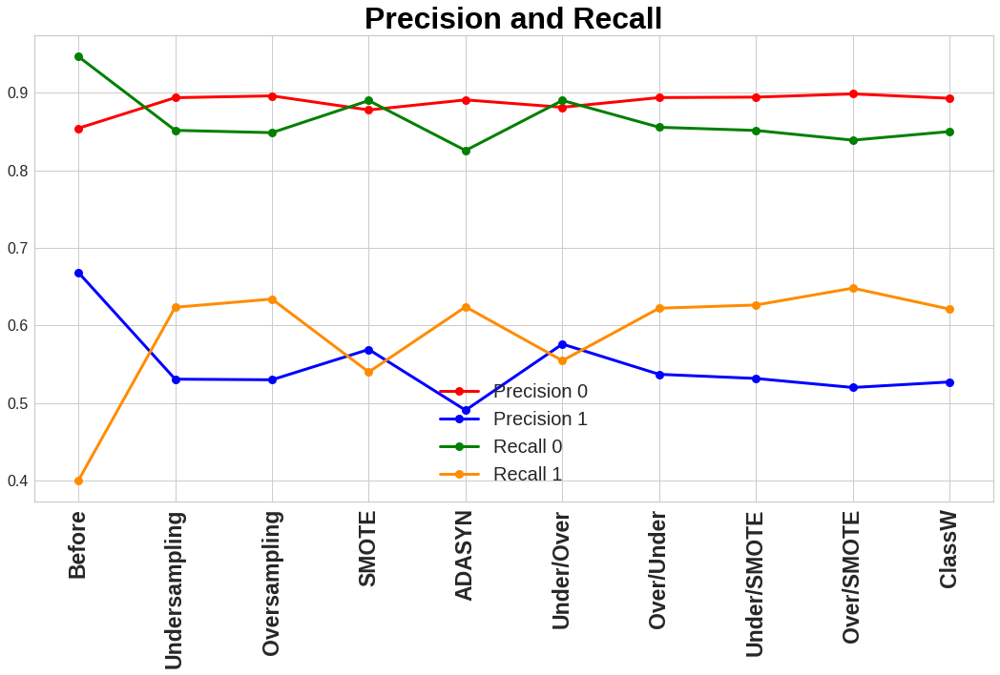

In [78]:
print('\033[1m' +'Full vaccine DataFrame train & test'+'\033[0m')
Utils.pre_rec_table(precision_0_full_train,precision_1_full_train,recall_0_full_train,recall_1_full_train,['red','blue','green','darkorange'],['Before','Undersampling','Oversampling','SMOTE', 'ADASYN','Under/Over','Over/Under','Under/SMOTE','Over/SMOTE','ClassW'],10)
Utils.pre_rec_table(precision_0_full_test,precision_1_full_test,recall_0_full_test,recall_1_full_test,['red','blue','green','darkorange'],['Before','Undersampling','Oversampling','SMOTE', 'ADASYN','Under/Over','Over/Under','Under/SMOTE','Over/SMOTE','ClassW'],10)

H1N1 vaccine DataFrame train & test


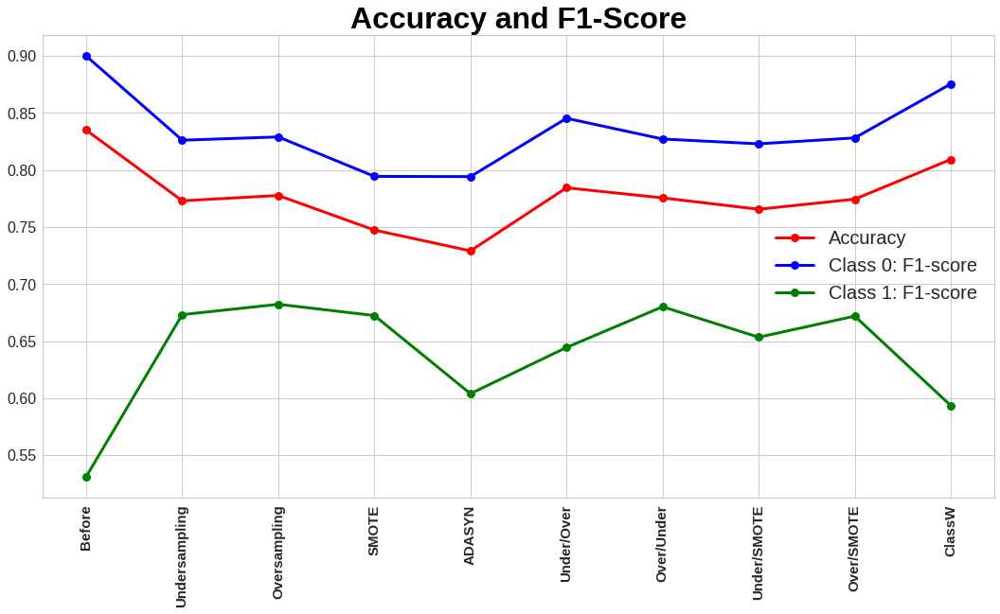

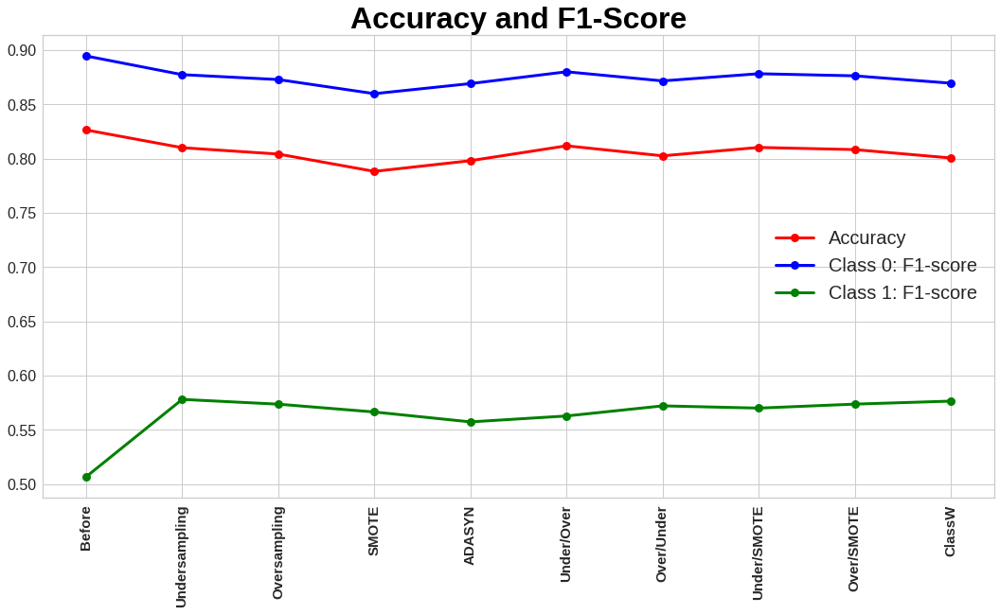

In [79]:
print('\033[1m' +'H1N1 vaccine DataFrame train & test'+'\033[0m')
Utils.acc_F1_table(acc_train_red,F1_train_red,['red','blue','green'],['Before','Undersampling','Oversampling','SMOTE', 'ADASYN','Under/Over','Over/Under','Under/SMOTE','Over/SMOTE','ClassW'],10)
Utils.acc_F1_table(acc_test_red,F1_test_red,['red','blue','green'],['Before','Undersampling','Oversampling','SMOTE', 'ADASYN','Under/Over','Over/Under','Under/SMOTE','Over/SMOTE','ClassW'],10)

H1N1 vaccine DataFrame train & test


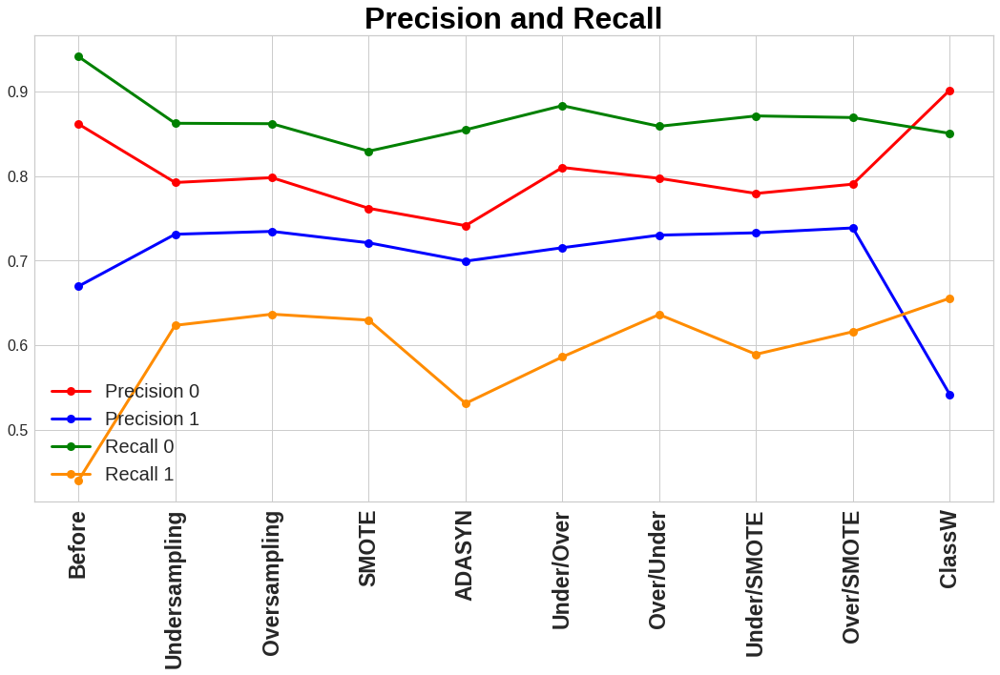

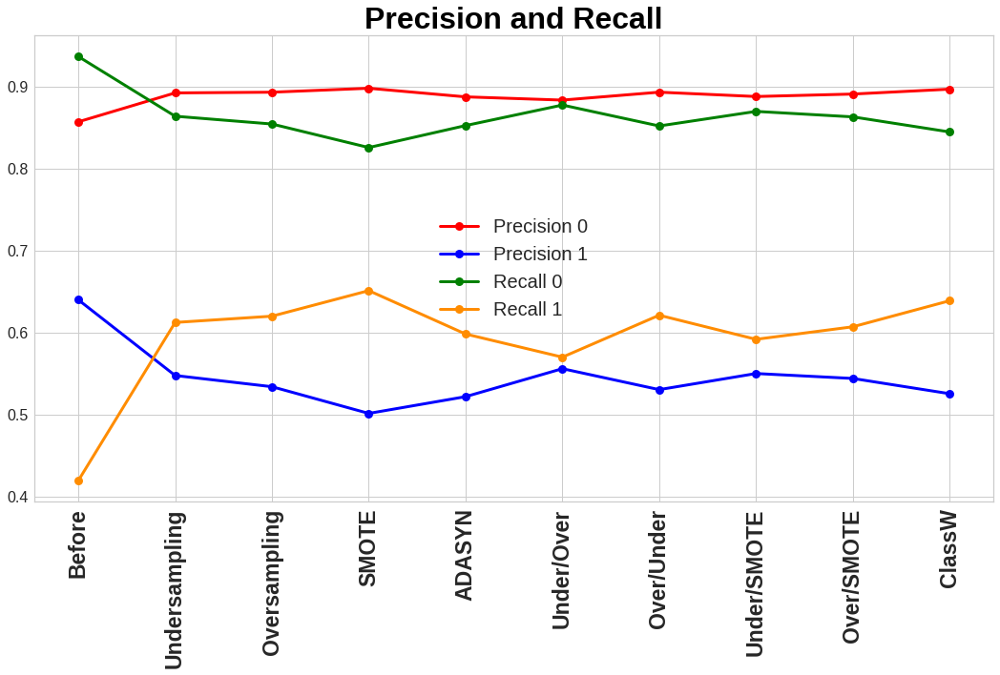

In [80]:
print('\033[1m' +'H1N1 vaccine DataFrame train & test'+'\033[0m')
Utils.pre_rec_table(precision_0_red_train,precision_1_red_train,recall_0_red_train,recall_1_red_train,['red','blue','green','darkorange'],['Before','Undersampling','Oversampling','SMOTE', 'ADASYN','Under/Over','Over/Under','Under/SMOTE','Over/SMOTE','ClassW'],10)
Utils.pre_rec_table(precision_0_red_test,precision_1_red_test,recall_0_red_test,recall_1_red_test,['red','blue','green','darkorange'],['Before','Undersampling','Oversampling','SMOTE', 'ADASYN','Under/Over','Over/Under','Under/SMOTE','Over/SMOTE','ClassW'],10)

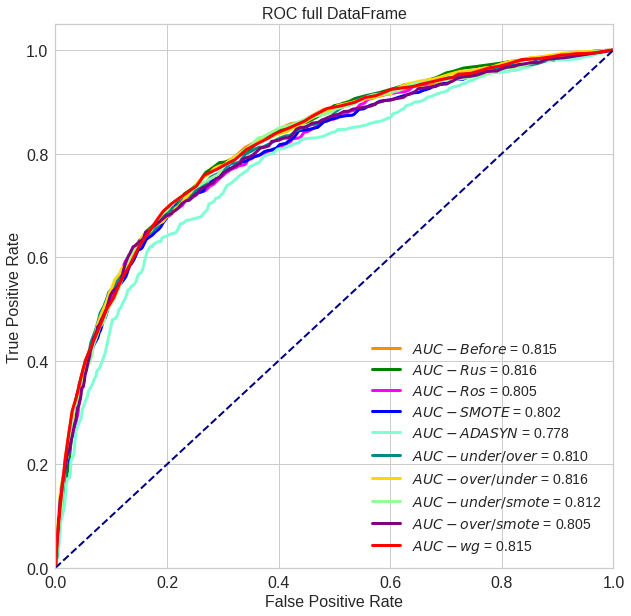

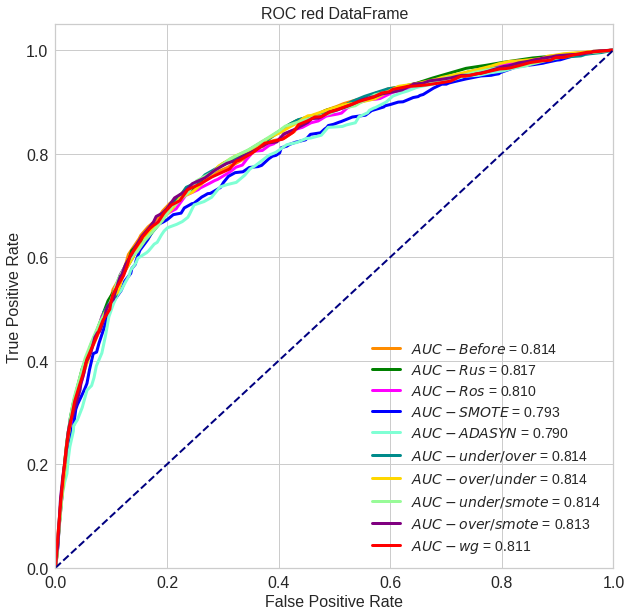

In [81]:
plt.figure (figsize = (10,10))
clf_g = [clf_h1n1_full,clf_h1n1_under_full,clf_h1n1_over_full, clf_h1n1_smote_full,clf_h1n1_adasyn_full, clf_h1n1_under_over_full,clf_h1n1_over_under_full,clf_h1n1_under_smote_full,clf_h1n1_over_smote_full,clf_h1n1_full_weight]
split_list_g = [SL_h1n1_full,SL_under_full,SL_over_full, SL_smote_full, SL_adasyn_full,SL_under_over_full,SL_over_under_full,SL_under_smote_full, SL_over_smote_full,SL_h1n1_full]
label_list = ['$AUC-Before$ = %.3f','$AUC-Rus$ = %.3f','$AUC-Ros$ = %.3f','$AUC-SMOTE$ = %.3f','$AUC-ADASYN$ = %.3f','$AUC-under/over$ = %.3f','$AUC-over/under$ = %.3f','$AUC-under/smote$ = %.3f','$AUC-over/smote$ = %.3f','$AUC-wg$ = %.3f']
color_list = ['darkorange','green','magenta', 'blue','aquamarine','darkcyan','gold','palegreen','purple','red']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC full DataFrame', label_list, color_list, 10)
plt.figure (figsize = (10,10))
clf_g = [clf_h1n1_red,clf_h1n1_under_red,clf_h1n1_over_red, clf_h1n1_smote_red,clf_h1n1_adasyn_red, clf_h1n1_under_over_red,clf_h1n1_over_under_red,clf_h1n1_under_smote_red,clf_h1n1_over_smote_red,clf_h1n1_red_weight]
split_list_g = [SL_h1n1_red,SL_under_red,SL_over_red, SL_smote_red, SL_adasyn_red,SL_under_over_red,SL_over_under_red,SL_under_smote_red, SL_over_smote_red,SL_h1n1_red]
label_list = ['$AUC-Before$ = %.3f','$AUC-Rus$ = %.3f','$AUC-Ros$ = %.3f','$AUC-SMOTE$ = %.3f','$AUC-ADASYN$ = %.3f','$AUC-under/over$ = %.3f','$AUC-over/under$ = %.3f','$AUC-under/smote$ = %.3f','$AUC-over/smote$ = %.3f','$AUC-wg$ = %.3f']
color_list = ['darkorange','green','magenta', 'blue','aquamarine','darkcyan','gold','palegreen','purple','red']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC red DataFrame', label_list, color_list, 10)


<a id='dta'></a>
## 3.Data Transformation assessment ([to top](#top))

In this part we will check the quality of the decisions we made in the Data Trnsformation phase. 

<a id='ds'></a>
### 3A. Dataset splitting ([to top](#top))

We have to assess the splitting of the main dataset into two sub-datasets one for the Seasonal flu and one for the H1N1. To do this we need to train two models for each target feature one using the full dataset and one using the reduced version of it.  

In [82]:
#H1N1 full dataset
tmp_ds= DF[1].drop('seasonal_vaccine', axis=1)
SL_h1n1_full = Utils.split_train_test(tmp_ds,'h1n1_vaccine',100)
under_full=Utils.under_sampler(SL_h1n1_full[2],SL_h1n1_full[4],42, perc = 0.6)
SL_h1n1_full_under=list(SL_h1n1_full)
SL_h1n1_full_under[2]=under_full[0]
SL_h1n1_full_under[4]=under_full[1]
#H1N1 reduced
SL_h1n1_red=Utils.split_train_test(DF[3],'h1n1_vaccine',100)
under_red=Utils.under_sampler(SL_h1n1_red[2],SL_h1n1_red[4],42, perc= 0.6)
SL_h1n1_red_under=list(SL_h1n1_red)
SL_h1n1_red_under[2]=under_red[0]
SL_h1n1_red_under[4]=under_red[1]
#seasonal full dataset
tmp_ds= DF[1].drop('h1n1_vaccine', axis=1)
SL_seas_full = Utils.split_train_test(tmp_ds,'seasonal_vaccine',100)
#seasonal reduced
SL_seas_red=Utils.split_train_test(DF[5],'seasonal_vaccine',100)

Resampled dataset shape Counter({0: 6620, 1: 3972})
Resampled dataset shape Counter({0: 6620, 1: 3972})


### H1N1

In [83]:
param_list = {'min_samples_split': list(range(50,500,50)),'min_samples_leaf': list(range(50,500,50))}
#grid search h1n1 full
print('\033[1m' +'Grid search on the vaccine full DataFrame'+'\033[0m')
Utils.DT_grid_sh(SL_h1n1_full_under, param_list)
print('\033[1m' +'Grid search on the H1N1 DataFrame'+'\033[0m')
#grid search h1n1 reduced
Utils.DT_grid_sh(SL_h1n1_red_under, param_list)

Grid search on the vaccine full DataFrame
Mean validation score: 0.83057 (std: 0.00316)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 50}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 100}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 150}

Mean validation score: 0.83031 (std: 0.00303)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 200}

Grid search on the H1N1 DataFrame
Mean validation score: 0.82986 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00240)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 300}

Mean validation score: 0.82960 (std: 0.00432)
Parameters: {'min_samples_leaf': 250, 'min_samples_split': 50}

Mean validation score: 0.82960 (std: 0.0

In [84]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame for h1n1 vaccine'+'\033[0m')
tmp = Utils.Model_Eval_DT(SL_h1n1_full_under[2],SL_h1n1_full_under[4],SL_h1n1_full_under[3],SL_h1n1_full_under[5], 200, 50)
clf_h1n1_full=tmp[0]
acc_train_full=tmp[1]
acc_test_full=tmp[3]
F1_train_full=tmp[2]
F1_test_full=tmp[4]
print('\033[1m' +'Decision Tree classifier before balancing on the h1n1 DataFrame'+'\033[0m')
tmp = Utils.Model_Eval_DT(SL_h1n1_red_under[2],SL_h1n1_red_under[4],SL_h1n1_red_under[3],SL_h1n1_red_under[5], 400, 50)
clf_h1n1_red = tmp[0]
acc_train_red=tmp[1]
acc_test_red=tmp[3]
F1_train_red=tmp[2]
F1_test_red=tmp[4]

Decision Tree classifier on the vaccine full DataFrame for h1n1 vaccine
Training set
Accuracy 0.7778512084592145
F1-score [0.82888517 0.68343872]
              precision    recall  f1-score   support

           0       0.80      0.86      0.83      6620
           1       0.73      0.64      0.68      3972

    accuracy                           0.78     10592
   macro avg       0.77      0.75      0.76     10592
weighted avg       0.77      0.78      0.77     10592

Test set
Accuracy 0.8029452140272058
F1-score [0.87188641 0.57335855]
              precision    recall  f1-score   support

           0       0.89      0.85      0.87      6311
           1       0.53      0.62      0.57      1702

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.80      0.81      8013

Decision Tree classifier before balancing on the h1n1 DataFrame
Training set
Accuracy 0.7729418429003021
F1-score [0.82603978 0.67

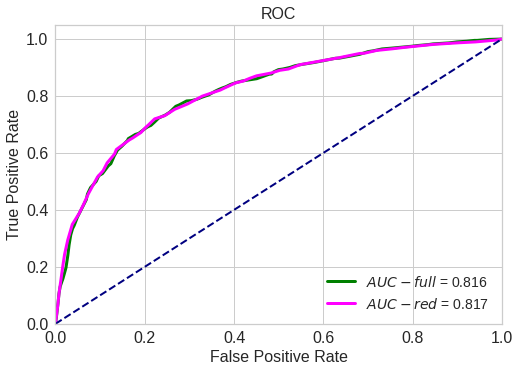

In [85]:
clf_g = [clf_h1n1_full,clf_h1n1_red]
split_list_g = [SL_h1n1_full,SL_h1n1_red]
label_list = ['$AUC-full$ = %.3f','$AUC-red$ = %.3f']
color_list = ['green','magenta']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC', label_list, color_list, 2)

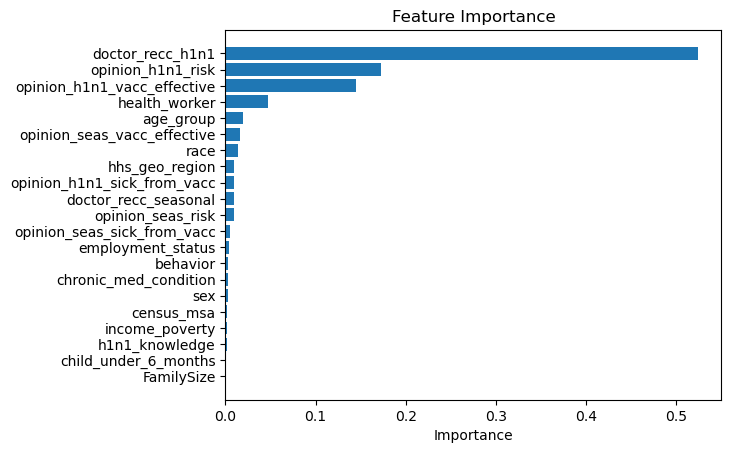

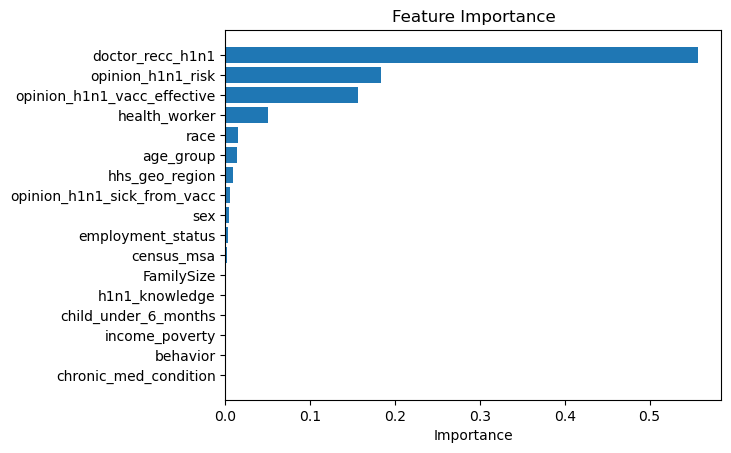

In [86]:
Utils.feature_importance_DT(clf_h1n1_full, SL_h1n1_full_under[6])
Utils.feature_importance_DT(clf_h1n1_red, SL_h1n1_red_under[6])

In [87]:
print('\033[1m' +'Training set'+'\033[0m')
Utils.val_diff(acc_train_full[0],acc_train_red[0],F1_train_full[0],F1_train_red[0])
print('\033[1m' +'Test set'+'\033[0m')
Utils.val_diff(acc_test_full[0],acc_test_red[0],F1_test_full[0],F1_test_red[0])

Training set
Accuracy difference 0.004909
F1-score difference [ 0.002845 0.010249]
Test set
Accuracy difference -0.007238
F1-score difference [ -0.005660 -0.004727]


We can see that we don't have any meaningful difference between the two models so for semplicity and explanability we will use the reduced dataset.

### Seasonal

In [88]:
param_list = {'min_samples_split': list(range(50,500,50)),'min_samples_leaf': list(range(50,500,50))}
#grid search seas full
print('\033[1m' +'Grid search on the vaccine full DataFrame'+'\033[0m')
Utils.DT_grid_sh(SL_seas_full, param_list)
print('\033[1m' +'Grid search on the Seasonal DataFrame'+'\033[0m')
#grid search seas reduced
Utils.DT_grid_sh(SL_seas_red, param_list)

Grid search on the vaccine full DataFrame
Mean validation score: 0.76763 (std: 0.00238)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 250}

Mean validation score: 0.76744 (std: 0.00226)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}

Mean validation score: 0.76654 (std: 0.00149)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 250}

Grid search on the Seasonal DataFrame
Mean validation score: 0.76987 (std: 0.00268)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 250}

Mean validation score: 0.76987 (std: 0.00190)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 400}

Mean validation score: 0.76954 (std: 0.00286)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 200}



In [89]:
print('\033[1m' +'Decision Tree classifier on the vaccine full DataFrame for Seasonal vaccine'+'\033[0m')
tmp = Utils.Model_Eval_DT(SL_seas_full[2],SL_seas_full[4],SL_seas_full[3],SL_seas_full[5], 250, 50)
clf_seas_full=tmp[0]
acc_train_full=tmp[1]
acc_test_full=tmp[3]
F1_train_full=tmp[2]
F1_test_full=tmp[4]
print('\033[1m' +'Decision Tree classifier before balancing on the Seasonal DataFrame'+'\033[0m')
tmp = Utils.Model_Eval_DT(SL_seas_red[2],SL_seas_red[4],SL_seas_red[3],SL_seas_red[5], 400, 50)
clf_seas_red = tmp[0]
acc_train_red=tmp[1]
acc_test_red=tmp[3]
F1_train_red=tmp[2]
F1_test_red=tmp[4]

Decision Tree classifier on the vaccine full DataFrame for Seasonal vaccine
Training set
Accuracy 0.7735102171819835
F1-score [0.7907896  0.75311953]
              precision    recall  f1-score   support

           0       0.78      0.80      0.79      9990
           1       0.76      0.74      0.75      8704

    accuracy                           0.77     18694
   macro avg       0.77      0.77      0.77     18694
weighted avg       0.77      0.77      0.77     18694

Test set
Accuracy 0.766254835891676
F1-score [0.78518179 0.74367045]
              precision    recall  f1-score   support

           0       0.77      0.80      0.79      4282
           1       0.76      0.73      0.74      3731

    accuracy                           0.77      8013
   macro avg       0.77      0.76      0.76      8013
weighted avg       0.77      0.77      0.77      8013

Decision Tree classifier before balancing on the Seasonal DataFrame
Training set
Accuracy 0.770033165721622
F1-score [0.7854469

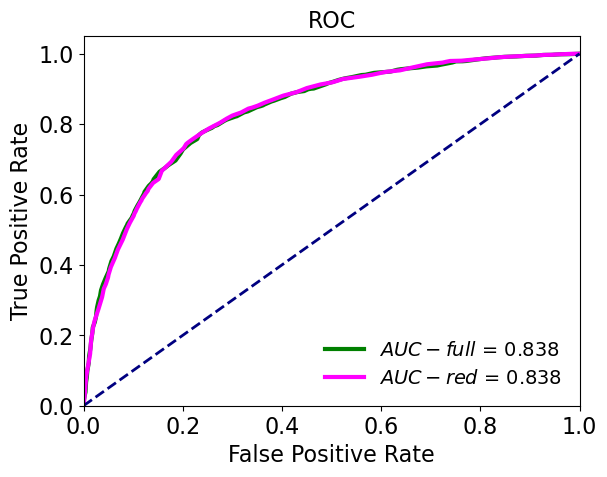

In [90]:
clf_g = [clf_seas_full,clf_seas_red]
split_list_g = [SL_seas_full,SL_seas_red]
label_list = ['$AUC-full$ = %.3f','$AUC-red$ = %.3f']
color_list = ['green','magenta']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC', label_list, color_list, 2)

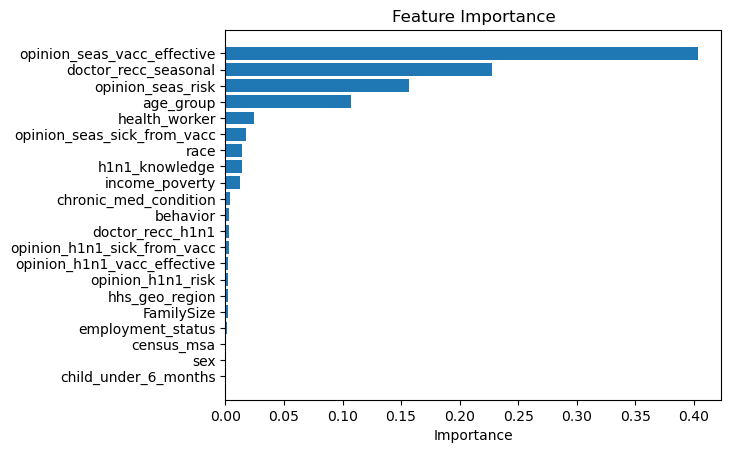

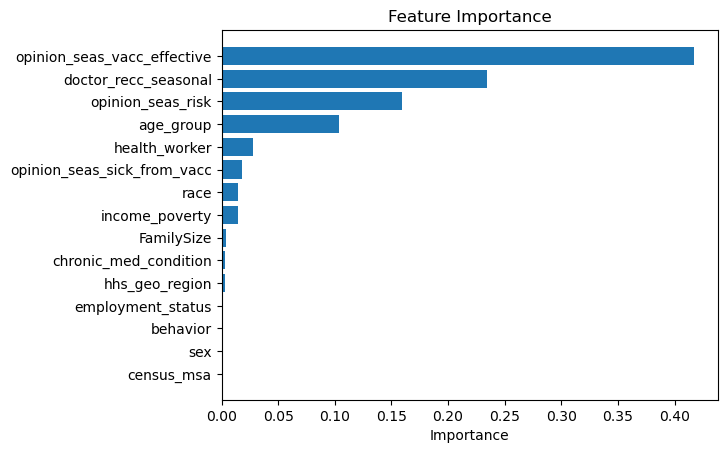

In [91]:
Utils.feature_importance_DT(clf_seas_full, SL_seas_full[6])
Utils.feature_importance_DT(clf_seas_red, SL_seas_red[6])

Quality difference

In [92]:
print('\033[1m' +'Training set'+'\033[0m')
Utils.val_diff(acc_train_full[0],acc_train_red[0],F1_train_full[0],F1_train_red[0])
print('\033[1m' +'Test set'+'\033[0m')
Utils.val_diff(acc_test_full[0],acc_test_red[0],F1_test_full[0],F1_test_red[0])

Training set
Accuracy difference 0.003477
F1-score difference [ 0.005343 0.000886]
Test set
Accuracy difference -0.003619
F1-score difference [ -0.001293 -0.006803]


We can see that we don't have any meaningful difference between the two models so for semplicity and explanability we will use the reduced dataset.

<a id='nf'></a>
### 3B. New features([to top](#top))

Established that we will use the reduced dataset we have to test the introduction of the two new variables "behavior" and "FamilySize".
To to this we trained for both the target variables two models one with the new features and one with the old ones.  

In [93]:
#H1N1 no new features
SL_h1n1_NoNewV=Utils.split_train_test(DF[2],'h1n1_vaccine',100)
under_NoNewV=Utils.under_sampler(SL_h1n1_NoNewV[2],SL_h1n1_NoNewV[4],42, perc= 0.6)
SL_h1n1_NoNewV_under=list(SL_h1n1_NoNewV)
SL_h1n1_NoNewV_under[2]=under_NoNewV[0]
SL_h1n1_NoNewV_under[4]=under_NoNewV[1]
#H1N1 new features
SL_h1n1_NewV=Utils.split_train_test(DF[3],'h1n1_vaccine',100)
under_NewV=Utils.under_sampler(SL_h1n1_NewV[2],SL_h1n1_NewV[4],42, perc= 0.6)
SL_h1n1_NewV_under=list(SL_h1n1_NewV)
SL_h1n1_NewV_under[2]=under_NewV[0]
SL_h1n1_NewV_under[4]=under_NewV[1]
#seas no new features
SL_seas_NoNewV=Utils.split_train_test(DF[4],'seasonal_vaccine',100)
#seas no new features
SL_seas_NewV=SL_seas_red

Resampled dataset shape Counter({0: 6620, 1: 3972})
Resampled dataset shape Counter({0: 6620, 1: 3972})


### H1N1

In [94]:
#grid search H1N1 no New variables
print('\033[1m' +'Grid search on the Seasonal DataFrame with no New variables'+'\033[0m')
Utils.DT_grid_sh(SL_h1n1_NoNewV_under, param_list)

Grid search on the Seasonal DataFrame with no New variables
Mean validation score: 0.83012 (std: 0.00232)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 300}

Mean validation score: 0.82975 (std: 0.00292)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 450}

Mean validation score: 0.82963 (std: 0.00233)
Parameters: {'min_samples_leaf': 100, 'min_samples_split': 250}



In [95]:
print('\033[1m' +'Decision Tree classifier on the Seasonal DataFrame with no New variables'+'\033[0m')
tmp = Utils.Model_Eval_DT(SL_h1n1_NoNewV_under[2],SL_h1n1_NoNewV_under[4],SL_h1n1_NoNewV_under[3],SL_h1n1_NoNewV_under[5], 300, 100)
clf_h1n1_NoNewV=tmp[0]
acc_train_NoNewV=tmp[1]
acc_test_NoNewV=tmp[3]
F1_train_NoNewV=tmp[2]
F1_test_NoNewV=tmp[4]
print('\033[1m' +'Decision Tree classifier on the Seasonal DataFrame with New variables'+'\033[0m')
tmp = Utils.Model_Eval_DT(SL_h1n1_NewV_under[2],SL_h1n1_NewV_under[4],SL_h1n1_NewV_under[3],SL_h1n1_NewV_under[5], 400, 50)
clf_h1n1_NewV = tmp[0]
acc_train_NewV=tmp[1]
acc_test_NewV=tmp[3]
F1_train_NewV=tmp[2]
F1_test_NewV=tmp[4]

Decision Tree classifier on the Seasonal DataFrame with no New variables
Training set
Accuracy 0.771714501510574
F1-score [0.82740899 0.66294954]
              precision    recall  f1-score   support

           0       0.78      0.88      0.83      6620
           1       0.74      0.60      0.66      3972

    accuracy                           0.77     10592
   macro avg       0.76      0.74      0.75     10592
weighted avg       0.77      0.77      0.77     10592

Test set
Accuracy 0.811057032322476
F1-score [0.87922782 0.56618911]
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      6311
           1       0.55      0.58      0.57      1702

    accuracy                           0.81      8013
   macro avg       0.72      0.73      0.72      8013
weighted avg       0.81      0.81      0.81      8013

Decision Tree classifier on the Seasonal DataFrame with New variables
Training set
Accuracy 0.7729418429003021
F1-score [0.82603978

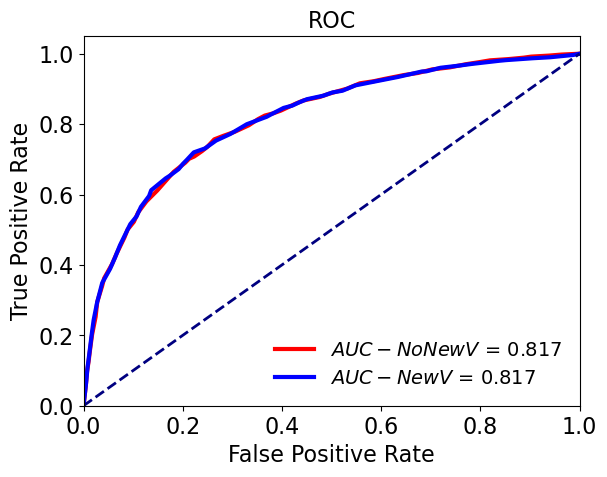

In [96]:
clf_g = [clf_h1n1_NoNewV,clf_h1n1_NewV]
split_list_g = [SL_h1n1_NoNewV_under,SL_h1n1_NewV_under]
label_list = ['$AUC-NoNewV$ = %.3f','$AUC-NewV$ = %.3f']
color_list = ['red','blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC', label_list, color_list, 2)

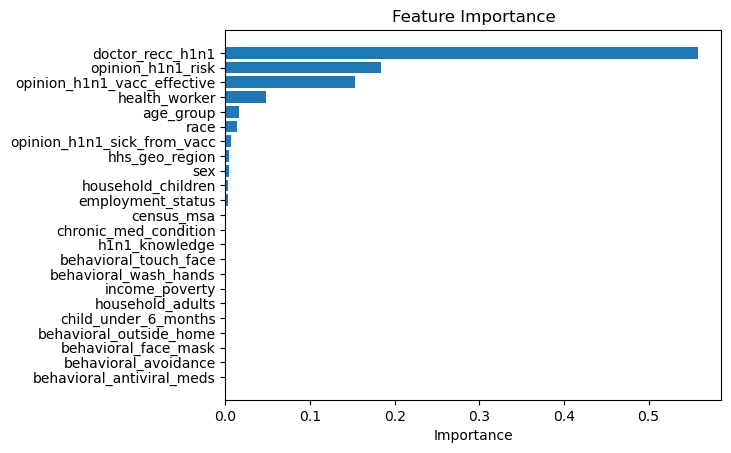

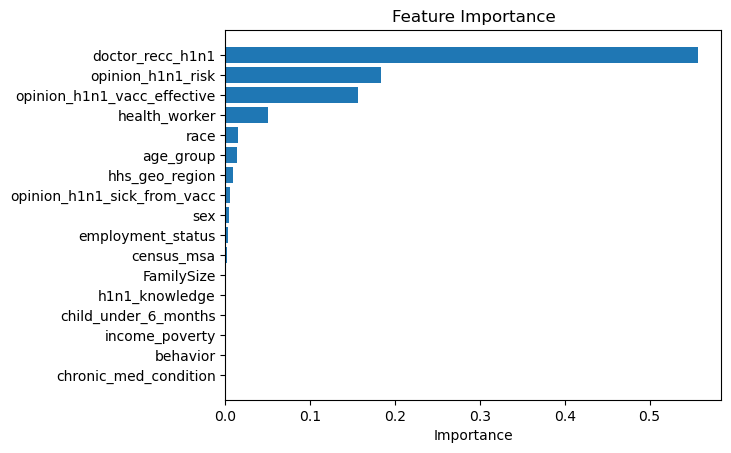

In [97]:
Utils.feature_importance_DT(clf_h1n1_NoNewV, SL_h1n1_NoNewV_under[6])
Utils.feature_importance_DT(clf_h1n1_NewV, SL_h1n1_NewV_under[6])

In [98]:
print('\033[1m' +'Training set'+'\033[0m')
Utils.val_diff(acc_train_NoNewV[0],acc_train_NewV[0],F1_train_NoNewV[0],F1_train_NewV[0])
print('\033[1m' +'Test set'+'\033[0m')
Utils.val_diff(acc_test_NoNewV[0],acc_test_NewV[0],F1_test_NoNewV[0],F1_test_NewV[0])

Training set
Accuracy difference -0.001227
F1-score difference [ 0.001369 -0.010240]
Test set
Accuracy difference 0.000874
F1-score difference [ 0.001682 -0.011897]


We can see that we don't have any meaningful difference between the two models so for semplicity and explanability we will keep the new features.

### Seasonal

In [99]:
#grid search seas no New variables
print('\033[1m' +'Grid search on the Seasonal DataFrame with no New variables'+'\033[0m')
Utils.DT_grid_sh(SL_seas_NoNewV, param_list)

Grid search on the Seasonal DataFrame with no New variables
Mean validation score: 0.77085 (std: 0.00137)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 400}

Mean validation score: 0.77047 (std: 0.00274)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 250}

Mean validation score: 0.77032 (std: 0.00182)
Parameters: {'min_samples_leaf': 50, 'min_samples_split': 350}



In [100]:
print('\033[1m' +'Decision Tree classifier on the Seasonal DataFrame with no New variables'+'\033[0m')
tmp = Utils.Model_Eval_DT(SL_seas_NoNewV[2],SL_seas_NoNewV[4],SL_seas_NoNewV[3],SL_seas_NoNewV[5], 400, 50)
clf_seas_NoNewV=tmp[0]
acc_train_NoNewV=tmp[1]
acc_test_NoNewV=tmp[3]
F1_train_NoNewV=tmp[2]
F1_test_NoNewV=tmp[4]
print('\033[1m' +'Decision Tree classifier on the Seasonal DataFrame with New variables'+'\033[0m')
tmp = Utils.Model_Eval_DT(SL_seas_NewV[2],SL_seas_NewV[4],SL_seas_NewV[3],SL_seas_NewV[5], 250, 50)
clf_seas_NewV = tmp[0]
acc_train_NewV=tmp[1]
acc_test_NewV=tmp[3]
F1_train_NewV=tmp[2]
F1_test_NewV=tmp[4]

Decision Tree classifier on the Seasonal DataFrame with no New variables
Training set
Accuracy 0.7700866588210121
F1-score [0.78512149 0.7527896 ]
              precision    recall  f1-score   support

           0       0.78      0.79      0.79      9990
           1       0.75      0.75      0.75      8704

    accuracy                           0.77     18694
   macro avg       0.77      0.77      0.77     18694
weighted avg       0.77      0.77      0.77     18694

Test set
Accuracy 0.770497940846125
F1-score [0.78683204 0.7514529 ]
              precision    recall  f1-score   support

           0       0.78      0.79      0.79      4282
           1       0.76      0.75      0.75      3731

    accuracy                           0.77      8013
   macro avg       0.77      0.77      0.77      8013
weighted avg       0.77      0.77      0.77      8013

Decision Tree classifier on the Seasonal DataFrame with New variables
Training set
Accuracy 0.7729752861880818
F1-score [0.7907297

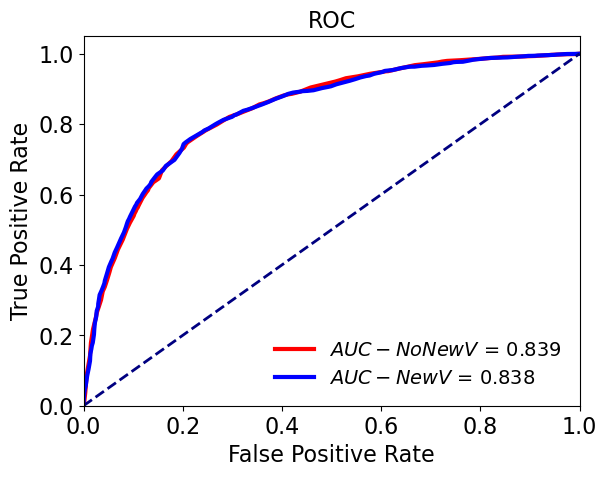

In [101]:
clf_g = [clf_seas_NoNewV,clf_seas_NewV]
split_list_g = [SL_seas_NoNewV,SL_seas_NewV]
label_list = ['$AUC-NoNewV$ = %.3f','$AUC-NewV$ = %.3f']
color_list = ['red','blue']
Utils.print_multy_ROC_curve(clf_g, split_list_g, 'ROC', label_list, color_list, 2)

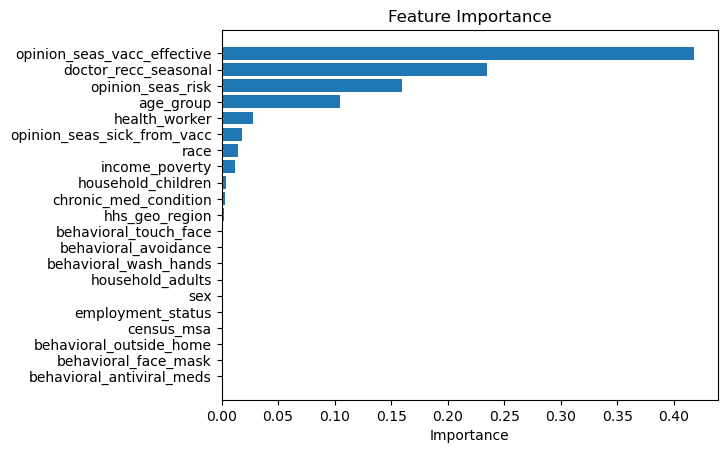

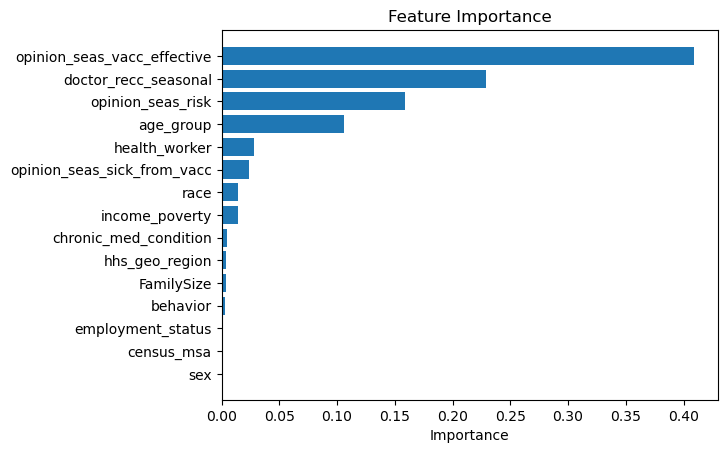

In [102]:
Utils.feature_importance_DT(clf_seas_NoNewV, SL_seas_NoNewV[6])
Utils.feature_importance_DT(clf_seas_NewV, SL_seas_NewV[6])

In [103]:
print('\033[1m' +'Training set'+'\033[0m')
Utils.val_diff(acc_train_NoNewV[0],acc_train_NewV[0],F1_train_NoNewV[0],F1_train_NewV[0])
print('\033[1m' +'Test set'+'\033[0m')
Utils.val_diff(acc_test_NoNewV[0],acc_test_NewV[0],F1_test_NoNewV[0],F1_test_NewV[0])

Training set
Accuracy difference -0.002889
F1-score difference [ -0.005608 0.000861]
Test set
Accuracy difference 0.002246
F1-score difference [ -0.000234 0.005662]


We can see that we don't have any meaningful difference between the two models so for semplicity and explanability we will keep the new features.

<a id='mod'></a>
## 4.Modeling([to top](#top))

## What metric we used to choose the best model?

During this milestone we trained a lot of different models.
For each of them we tried several sets of hyperparameter.
At the end we had to choose for each model the best one and also the best model overall.

To do this we had to reason about the metric we had to use to measure the performances of the models.

We considered three performance metrics based on values extracted from the confusion matrix:

<img src="img/pic1.jpg">

- Accuracy: it is defined as $$\frac{TP + TN}{TP + TN + FP + FN}$$
- Recall: it is the proportion of actual positives that was identified correctly. It is defined as: $$\frac{TP}{TP + FN}$$

- Precision: it is the fraction of predictions reported by the model that were correct. Example: if we have to detect if a message is spam or not, the precision tells us how mnany time the predictions are correct. It is defined as: $$\frac{TP}{TP + FP}$$

To better understand how recall works we can consider a dataset with 99.9% of data classified as "No spam" and 0.1% classified as "Spam". 
If we classify all the dataset as No spam we will have a high precision because most of the data point will be correctly classified but we will also have a bas recall because  

- F1 Score: $$2 * \frac{precision * recall}{precision + recall}$$

To define Precision and Recall we can consider the following picture:

<img src="img/pic2.jpg">

In the end we decided to follow the following approach:
- We considered the accuracy as our metric during Grid Search for the seasonal target and we did the same thing to choose the best classifier
- Instead we considered the F1 Score for the H1N1 target because the target dataset it unbalanced.

<a id='seasmod'></a>
### 4A. Predict the Seasonal Vaccine ([to top](#top))

We started the classification phase with the seasonal target. 
The dataset we have for this target variable is almost balanced and so we did not changed it.

As we already said the metric we considered for this dataset is the accuracy.

In this section we will try the following models:

- Decision Tree: they are easy to explain because they can be expressed in a sort of rule language with conditions.
- Random Forest: it is an ensemble classifier, we decided to use it to improve the performances of the decision tree.
- XGBoost: it is an ensemble classifier, we decided to use it to improve the performances of the decision tree.
- SVM
- Logistic Regression: it models the probabilities for classification problems with two possible outcomes. We decided to use it because is interpretable.
- Neural Network: these model are the most complex, we decided to use them because we had a lot of data in our dataset. Unlike decision trees are difficult to interpret.

For each of them we will have the following approach:

- We will do a grid search to find the best hyperparameters (using a training and a validation set)
- We will train the model using the best hyperparameters using the training dataset and the validation set
- We will test the model using the test set

In [104]:
scoring = {'Accuracy': make_scorer(accuracy_score)}

In [105]:
# Load the training set
df_train = pd.read_csv("./Data/seasonal.csv")

In [106]:
target_seasonal = df_train.pop('seasonal_vaccine')

In [107]:
df_train.head()

,doctor_recc_seasonal,chronic_med_condition,health_worker,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,FamilySize,behavior
0,0,0,0,2,1,2,3,3,0,0,1,8,2,1,2
1,0,0,0,4,2,4,1,3,1,0,0,1,0,1,4
2,0,1,0,4,1,2,0,3,1,1,0,9,0,3,1
3,1,1,0,5,4,1,4,3,0,0,1,5,1,1,2
4,0,0,0,3,1,4,2,3,0,1,0,9,0,2,3


In [108]:
X_train, X_test, y_train, y_test = train_test_split(df_train, target_seasonal, test_size=0.3, random_state=42)

In [109]:
df_test = pd.read_csv("./Data/test_set.csv")

In [110]:
df_test.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,...,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,26707,2.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,"> $75,000",Not Married,Rent,Employed,mlyzmhmf,"MSA, Not Principle City",1.0,0.0,atmlpfrs,hfxkjkmi
1,26708,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Below Poverty,Not Married,Rent,Employed,bhuqouqj,Non-MSA,3.0,0.0,atmlpfrs,xqwwgdyp
2,26709,2.0,2.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,"> $75,000",Married,Own,Employed,lrircsnp,Non-MSA,1.0,0.0,nduyfdeo,pvmttkik
3,26710,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,lrircsnp,"MSA, Not Principle City",1.0,0.0,NaN,NaN
4,26711,3.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,...,"<= $75,000, Above Poverty",Not Married,Own,Employed,lzgpxyit,Non-MSA,0.0,1.0,fcxhlnwr,mxkfnird


#### Define the Pipeline for the pre processing

We scaled our data before using them during the classification.

For each model we will store:
- The accuracy of the model
- All the informations to plot the roc curve

In [111]:
numeric_cols = df_train.columns[df_train.dtypes != "object"].values

In [112]:
numeric_preprocessing_steps = Pipeline([
    ('standard_scaler', StandardScaler()),
    ('simple_imputer', SimpleImputer(strategy='median'))
])

preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", numeric_preprocessing_steps, numeric_cols)
    ],
    remainder = "drop"
)

In [113]:
X_train_classification = preprocessor.fit_transform(X_train)
X_test_classification = preprocessor.fit_transform(X_test)
X_train_refit = preprocessor.fit_transform(df_train)

In [114]:
results = {}
rocList = {}
accuracy = {}

## Dummy Classifier

First of all we developed a dummy classifier so that we could have a baseline classifier to make some comparisons.

In [115]:
dummy = DummyClassifier(strategy="stratified")

In [116]:
scores_dummy = cross_val_score(dummy, X_train_classification, y_train, cv=8)
results['Dummy'] = scores_dummy

In [117]:
dummy.fit(X_train_classification, y_train)

DummyClassifier(strategy='stratified')

In [118]:
y_pred_dummy = dummy.predict(X_test_classification)
rocList['Dummy'] = y_pred_dummy
accuracy['Dummy'] = accuracy_score(y_test, y_pred_dummy)

In [119]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_dummy))
print('F1-score %s' % f1_score(y_test, y_pred_dummy, average=None))
Utils.printReport(y_test, y_pred_dummy)

Accuracy 0.5004367902158992
F1-score [0.53415571 0.46145567]
              precision    recall  f1-score   support

           0       0.54      0.53      0.53      4342
           1       0.46      0.47      0.46      3671

    accuracy                           0.50      8013
   macro avg       0.50      0.50      0.50      8013
weighted avg       0.50      0.50      0.50      8013



<AxesSubplot:>

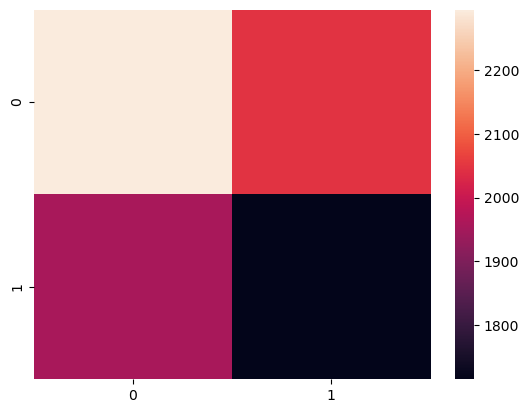

In [120]:
conf_matrix = confusion_matrix(y_test, y_pred_dummy)
sns.heatmap(conf_matrix)

## Decision Tree

The first classifier we tried was the Decision Tree.
We decided to use this classifier because of several reason:
- It is a simple classifier that we can use as a baseline for the more advanced models
- It is interpretable
- Can be visualized

#### Baseline Model

In [121]:
dt = tree.DecisionTreeClassifier(criterion="entropy", max_depth=4)

In [122]:
dt = dt.fit(X_train_classification, y_train)

In [123]:
y_pred_baseline = dt.predict(X_test_classification) 

In [124]:
Utils.printReport(y_test, y_pred_baseline)

              precision    recall  f1-score   support

           0       0.76      0.76      0.76      4342
           1       0.71      0.72      0.72      3671

    accuracy                           0.74      8013
   macro avg       0.74      0.74      0.74      8013
weighted avg       0.74      0.74      0.74      8013



In [125]:
dot_data = tree.export_graphviz(dt, out_file=None) 
graph = graphviz.Source(dot_data) 

In [487]:
dot_data = tree.export_graphviz(dt, out_file=None, feature_names=X_test.columns.tolist(),
                                 class_names='Seasonal Vaccine',
                                 filled=True, rounded=True,
                                 special_characters=True)

#### Finding the best hyperparameters

To find the best hyperparameters for the Decision Tree we did a Grid Search with cross validation considering several parameters.

In [127]:
param_grid = {'criterion':['gini','entropy'],
              'max_depth': np.arange(3,20),
              'min_samples_split': np.arange(5,200,5),
              }

In [128]:
grid_search_cv = GridSearchCV(tree.DecisionTreeClassifier(),
                              param_grid,
                              verbose=2,
                              cv=10, 
                              n_jobs=-1, 
                              scoring=scoring,
                              refit='Accuracy',
                              return_train_score=True)

In [129]:
grid_search_cv.fit(X_train_classification, y_train)

Fitting 10 folds for each of 1326 candidates, totalling 13260 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 956 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 2580 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done 4844 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 7764 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 11324 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 13260 out of 13260 | elapsed:  3.0min finished


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]),
                         'min_samples_split': array([  5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,  65,
        70,  75,  80,  85,  90,  95, 100, 105, 110, 115, 120, 125, 130,
       135, 140, 145, 150, 155, 160, 165, 170, 175, 180, 185, 190, 195])},
             refit='Accuracy', return_train_score=True,
             scoring={'Accuracy': make_scorer(accuracy_score)}, verbose=2)

In [130]:
grid_search_cv.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=12, min_samples_split=195)

#### Evaluation of the best model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

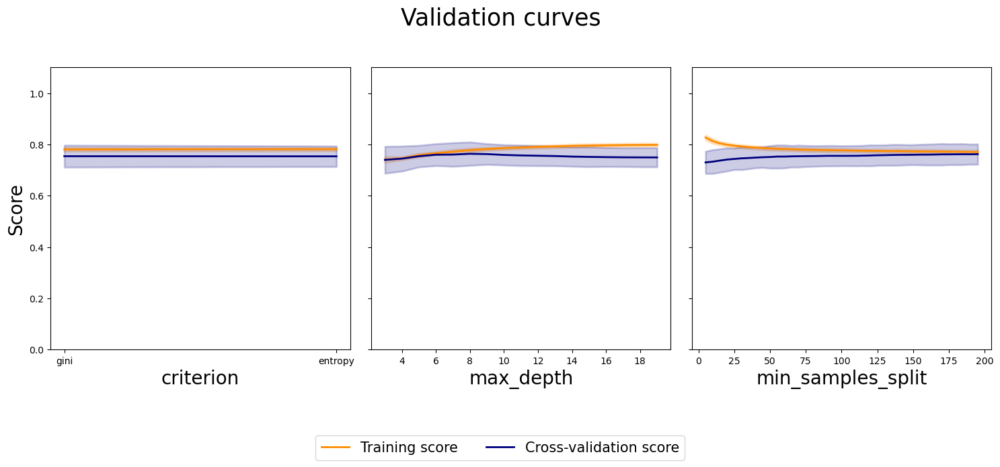

In [131]:
Utils.plotValidationCurve(grid_search_cv, param_grid)

#### Fitting the decision Tree with the best parameters

In [132]:
decision_tree = tree.DecisionTreeClassifier(criterion="entropy", 
                                 max_depth=12,
                                 min_samples_split=195)

In [133]:
scores_dt = cross_val_score(decision_tree, X_train_classification, y_train, cv=8)
results['decision_tree'] = scores_dt

In [134]:
decision_tree.fit(X_train_classification, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=12, min_samples_split=195)

In [135]:
y_pred_decision_tree = decision_tree.predict(X_test_classification) 
rocList['Decision Tree'] = y_pred_decision_tree

In [136]:
accuracy['Decision Tree'] = accuracy_score(y_test, y_pred_decision_tree)

In [137]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_decision_tree))
print('F1-score %s' % f1_score(y_test, y_pred_decision_tree, average=None))
Utils.printReport(y_test, y_pred_decision_tree)

Accuracy 0.7680019967552727
F1-score [0.78853373 0.7430546 ]
              precision    recall  f1-score   support

           0       0.78      0.80      0.79      4342
           1       0.75      0.73      0.74      3671

    accuracy                           0.77      8013
   macro avg       0.77      0.77      0.77      8013
weighted avg       0.77      0.77      0.77      8013



In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred_decision_tree)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

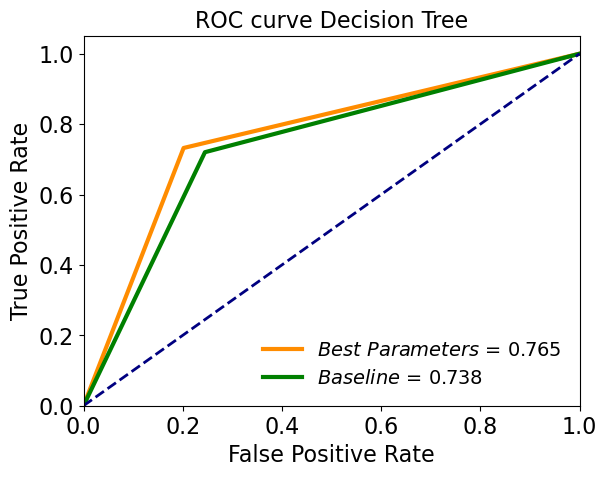

In [139]:
Utils.plotRoc(y_pred_decision_tree, y_test, y_pred_baseline, "Decision Tree")

# Ensemble Learning

## Random Forest

Random Forest is an ensemble learning classifier that fits a number of decision tree classifiers on some sub-samples of the dataset and uses the average to improve the predictive performances.

We used the Random Forest to improve the performances of the Decision Tree.

#### Baseline

In [140]:
rf = RandomForestClassifier(n_estimators = 100, random_state = 42)

In [141]:
rf.fit(X_train_classification, y_train)

RandomForestClassifier(random_state=42)

In [142]:
y_pred_baseline = rf.predict(X_test_classification)

In [143]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_baseline))

Accuracy: 0.7676276051416449


#### Finding the best hyperparameters

In [144]:
max_depth = [5, 10, 30, 40, 60, 80, 90, 110]
n_estimators = [100, 200, 300, 400]

param_grid = {'criterion':['gini','entropy'],
              'max_features': ['auto', 'sqrt'],
              'max_depth': max_depth,
              'min_samples_split': [2, 5, 10],
              'bootstrap': [True, False],
              'n_estimators': n_estimators
              }

In [145]:
rf = RandomForestClassifier(random_state = 42)

In [146]:
rf_random = RandomizedSearchCV(estimator = rf, 
                               param_distributions = param_grid, 
                               n_iter = 100, 
                               cv = 3, 
                               verbose=2, 
                               random_state=42,
                               n_jobs = -1, 
                               scoring=scoring,
                               refit='Accuracy',
                               return_train_score=True)

In [147]:
rf_random.fit(X_train_classification, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.0min finished


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 10, 30, 40, 60, 80, 90,
                                                      110],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400]},
                   random_state=42, refit='Accuracy', return_train_score=True,
                   scoring={'Accuracy': make_scorer(accuracy_score)},
                   verbose=2)

In [148]:
rf_random.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=10, max_features='sqrt',
                       min_samples_split=5, n_estimators=300, random_state=42)

#### Evaluation of the best Model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

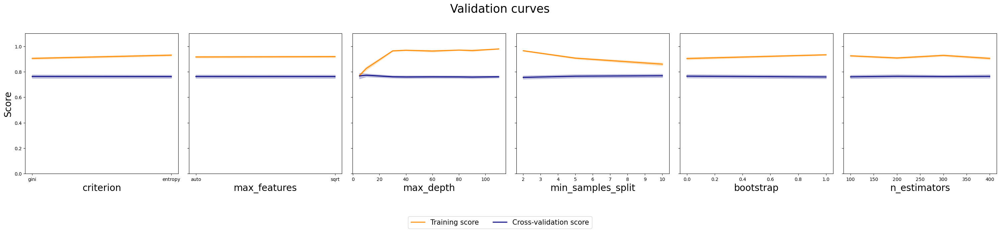

In [149]:
Utils.plotValidationCurve(rf_random, param_grid)

#### Fitting the Random Forest with the best parameters

In [150]:
random_forest = RandomForestClassifier(criterion='entropy',
                            max_depth=10,
                            max_features='sqrt',
                            min_samples_split=5,
                            n_estimators=300, 
                            random_state=42)

In [151]:
scores_rf = cross_val_score(random_forest, X_train_classification, y_train, cv=8)
results['random_forest'] = scores_rf

In [152]:
random_forest.fit(X_train_classification, y_train)

RandomForestClassifier(criterion='entropy', max_depth=10, max_features='sqrt',
                       min_samples_split=5, n_estimators=300, random_state=42)

In [153]:
y_pred_random_forest = random_forest.predict(X_test_classification)
rocList['Random Forest'] = y_pred_random_forest
accuracy['Random Forest'] = accuracy_score(y_test, y_pred_random_forest)

In [154]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_random_forest))
print('F1-score %s' % f1_score(y_test, y_pred_random_forest, average=None))
Utils.printReport(y_test, y_pred_random_forest)

Accuracy 0.7801073255959067
F1-score [0.80148716 0.75356643]
              precision    recall  f1-score   support

           0       0.78      0.82      0.80      4342
           1       0.77      0.73      0.75      3671

    accuracy                           0.78      8013
   macro avg       0.78      0.78      0.78      8013
weighted avg       0.78      0.78      0.78      8013



<AxesSubplot:>

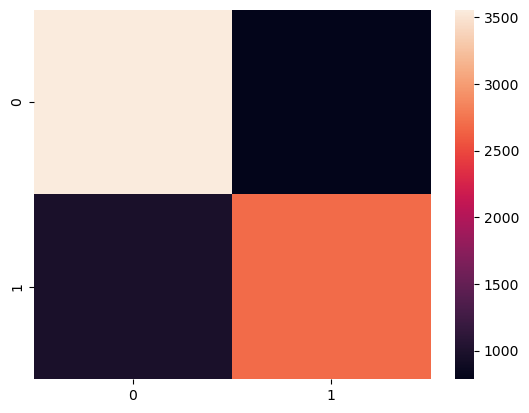

In [155]:
conf_matrix = confusion_matrix(y_test, y_pred_random_forest)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

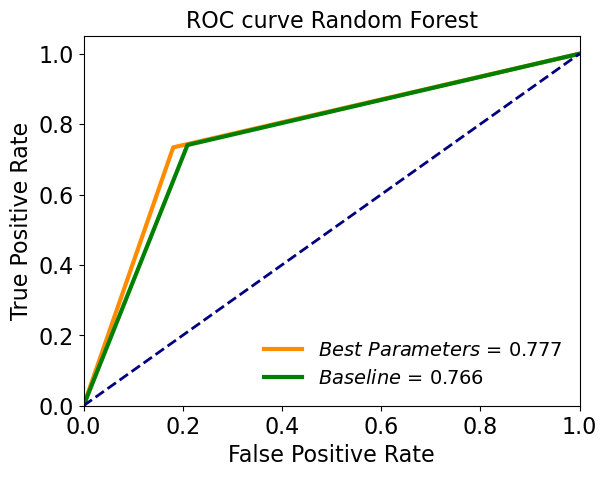

In [156]:
Utils.plotRoc(y_pred_random_forest, y_test, y_pred_baseline,  "Random Forest")

## XGBoost

XGBoost (eXtreme Gradient Boosting) is a library of gradient boosting algorithms optimized for modern data science problems and tools.

It is an ensemble classifier so we decided to use it to make a comparison with Random Forest and also to improve the performances of the Decision Tree.

#### Baseline

In [157]:
XGB = XGBClassifier()

In [158]:
XGB.fit(X_train_classification, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [159]:
y_pred_baseline = XGB.predict(X_test_classification)
y_pred_baseline = [round(value) for value in y_pred_baseline]

In [160]:
Utils.printReport(y_test, y_pred_baseline)

              precision    recall  f1-score   support

           0       0.78      0.79      0.79      4342
           1       0.75      0.74      0.75      3671

    accuracy                           0.77      8013
   macro avg       0.77      0.77      0.77      8013
weighted avg       0.77      0.77      0.77      8013



#### Finding the best hyperparameters

In [161]:
param_grid = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5],
        'learning_rate': [0.1, 0.01, 0.05],
        'n_estimators': range(60, 220, 40),
        }

In [162]:
folds = 5
param_comb = 5
skf = StratifiedKFold(n_splits=folds, 
                      shuffle = True, 
                      random_state = 42)

In [163]:
xgb = XGBClassifier()

In [164]:
random_search = RandomizedSearchCV(xgb, 
                                   param_distributions=param_grid, 
                                   n_iter=50, 
                                   n_jobs=4, 
                                   cv=skf.split(X_train,y_train), 
                                   verbose=3, 
                                   random_state=42,
                                   scoring=scoring,
                                   refit='Accuracy',
                                   return_train_score=True)

random_search.fit(X_train_classification, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   42.3s
[Parallel(n_jobs=4)]: Done 250 out of 250 | elapsed:  1.4min finished


RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x7f020a773d60>,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing...
                   n_iter=50, n_jobs=4,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2, 5],
                                        'learning_rate': [0.1, 0.01, 0.05],
  

In [165]:
random_search.best_params_

{'subsample': 0.8,
 'n_estimators': 100,
 'min_child_weight': 5,
 'max_depth': 4,
 'learning_rate': 0.1,
 'gamma': 2,
 'colsample_bytree': 0.6}

#### Evaluation of the best Model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

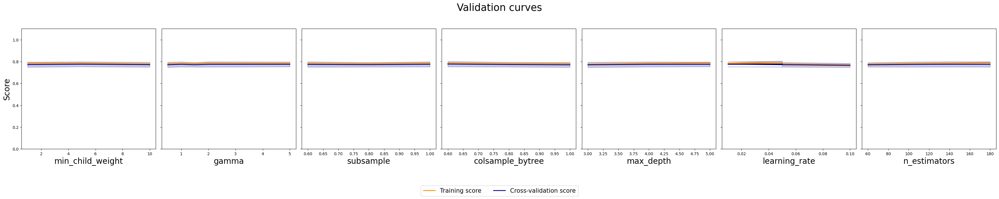

In [166]:
Utils.plotValidationCurve(random_search, param_grid)

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.#### Fitting the XGBoost with the best parameters

In [167]:
xgboost = XGBClassifier(subsample = 0.6,
                    n_estimators = 100,
                    min_child_weight = 10,
                    max_depth = 3,
                    learning_rate = 0.1,
                    gamma = 1,
                    colsample_bytree = 1.0)

In [168]:
scores_xgboost = cross_val_score(xgboost, X_train_classification, y_train, cv=8)
results['xgboost'] = scores_xgboost

In [169]:
xgboost.fit(X_train_classification, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0, gamma=1, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=10, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.6,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [170]:
y_pred_xgboost = xgboost.predict(X_test_classification)
rocList['XGBoost'] = y_pred_xgboost
accuracy['XGBoost Forest'] = accuracy_score(y_test, y_pred_xgboost)

In [171]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_xgboost))
print('F1-score %s' % f1_score(y_test, y_pred_xgboost, average=None))
Utils.printReport(y_test, y_pred_xgboost)

Accuracy 0.7817296892549607
F1-score [0.80113701 0.75812474]
              precision    recall  f1-score   support

           0       0.79      0.81      0.80      4342
           1       0.77      0.75      0.76      3671

    accuracy                           0.78      8013
   macro avg       0.78      0.78      0.78      8013
weighted avg       0.78      0.78      0.78      8013



<AxesSubplot:>

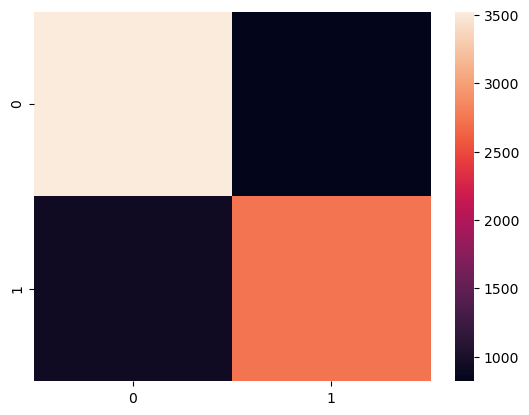

In [172]:
conf_matrix = confusion_matrix(y_test, y_pred_xgboost)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

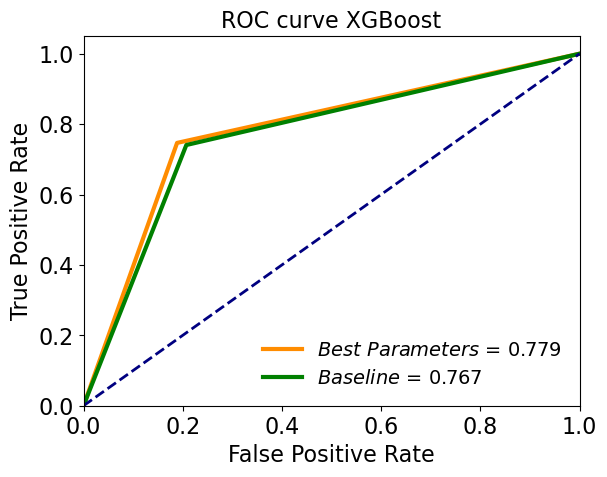

In [173]:
Utils.plotRoc(y_pred_xgboost, y_test, y_pred_baseline, "XGBoost")

## SVM

SVM is a supervised machine learning algorithm, it uses a technique called the kernel trick to transform data and then based on these transformations it finds an optimal boundary between the possible outputs.

#### Baseline Model

In [174]:
svm_classifier = svm.SVC()

In [175]:
svm_classifier.fit(X_train_classification, y_train)

SVC()

In [176]:
y_pred_baseline = svm_classifier.predict(X_test_classification)

In [177]:
Utils.printReport(y_test, y_pred_baseline)

              precision    recall  f1-score   support

           0       0.79      0.80      0.80      4342
           1       0.76      0.75      0.75      3671

    accuracy                           0.78      8013
   macro avg       0.78      0.77      0.77      8013
weighted avg       0.78      0.78      0.78      8013



#### Finding the best hyperparameters

In [178]:
param_grid = {'C': [0.1, 1, 10], 
              'gamma': [0.1, 0.01, 0.001],
              'kernel': ['rbf', 'poly', 'sigmoid']}

In [179]:
grid = RandomizedSearchCV(svm.SVC(), 
                          param_distributions=param_grid, 
                          n_iter=7,  
                          n_jobs=-1, 
                          cv = 3, 
                          verbose=3, 
                          scoring=scoring,
                          refit='Accuracy',
                          return_train_score=True)
grid.fit(X_train_classification,y_train)

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:  1.3min finished


RandomizedSearchCV(cv=3, estimator=SVC(), n_iter=7, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10],
                                        'gamma': [0.1, 0.01, 0.001],
                                        'kernel': ['rbf', 'poly', 'sigmoid']},
                   refit='Accuracy', return_train_score=True,
                   scoring={'Accuracy': make_scorer(accuracy_score)},
                   verbose=3)

In [180]:
print(grid.best_params_)

{'kernel': 'rbf', 'gamma': 0.01, 'C': 1}


#### Evaluation of the best Model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

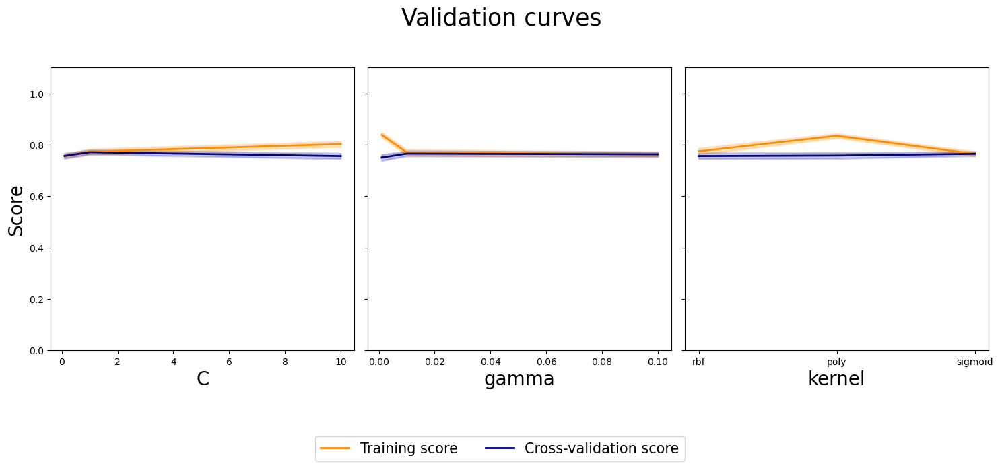

In [181]:
Utils.plotValidationCurve(grid, param_grid)

#### Fitting the SVM with the best parameters

In [182]:
svm_classifier = svm.SVC(kernel = 'rbf', 
                         gamma = 0.001, 
                         C = 100)

In [183]:
scores_svm_classifier = cross_val_score(svm_classifier, X_train_classification, y_train, cv=8)
results['svm_classifier'] = scores_svm_classifier

In [184]:
svm_classifier.fit(X_train_classification, y_train)

SVC(C=100, gamma=0.001)

In [185]:
y_pred_SVM = svm_classifier.predict(X_test_classification)
rocList['SVM'] = y_pred_SVM
accuracy['SVM'] = accuracy_score(y_test, y_pred_SVM)

In [186]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_SVM))
print('F1-score %s' % f1_score(y_test, y_pred_SVM, average=None))
Utils.printReport(y_test, y_pred_SVM)

Accuracy 0.7791089479595658
F1-score [0.79986431 0.75355054]
              precision    recall  f1-score   support

           0       0.79      0.81      0.80      4342
           1       0.77      0.74      0.75      3671

    accuracy                           0.78      8013
   macro avg       0.78      0.78      0.78      8013
weighted avg       0.78      0.78      0.78      8013



<AxesSubplot:>

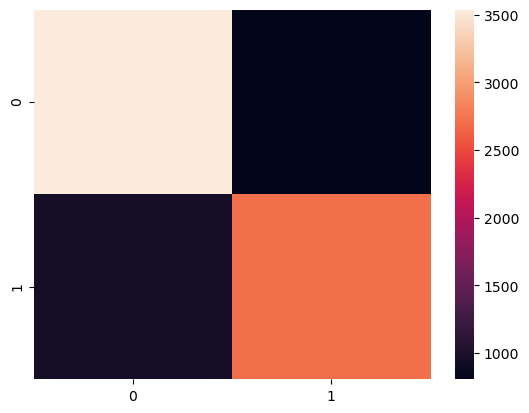

In [187]:
conf_matrix = confusion_matrix(y_test, y_pred_SVM)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

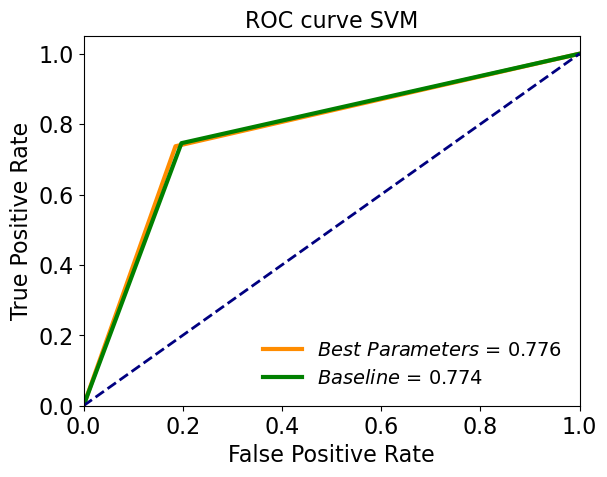

In [188]:
Utils.plotRoc(y_pred_SVM, y_test, y_pred_baseline, "SVM")

## Logistic regression

Logistic Regression models the probabilities for classification problems with two possible outcomes. 

We decided to use it because is interpretable.

#### Baseline model

In [189]:
lr = LogisticRegression(random_state=42)

In [190]:
lr.fit(X_train_classification, y_train)

LogisticRegression(random_state=42)

In [191]:
y_pred = lr.predict(X_test_classification)

In [192]:
Utils.printReport(y_test, y_pred)

              precision    recall  f1-score   support

           0       0.79      0.81      0.80      4342
           1       0.77      0.74      0.75      3671

    accuracy                           0.78      8013
   macro avg       0.78      0.78      0.78      8013
weighted avg       0.78      0.78      0.78      8013



#### Finding the best hyper parameters

In [193]:
grid = {"C" : np.logspace(-3,3,7),
        "penalty" : ["l2"]} 

In [194]:
logreg=LogisticRegression(random_state=42)
logreg_cv=GridSearchCV(logreg,
                       grid,
                       cv=5,
                       scoring=scoring,
                       refit='Accuracy',
                       return_train_score=True)
logreg_cv.fit(X_train_classification,y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=42),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             refit='Accuracy', return_train_score=True,
             scoring={'Accuracy': make_scorer(accuracy_score)})

In [195]:
print(logreg_cv.best_params_)

{'C': 10.0, 'penalty': 'l2'}


#### Evaluation of the best Model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

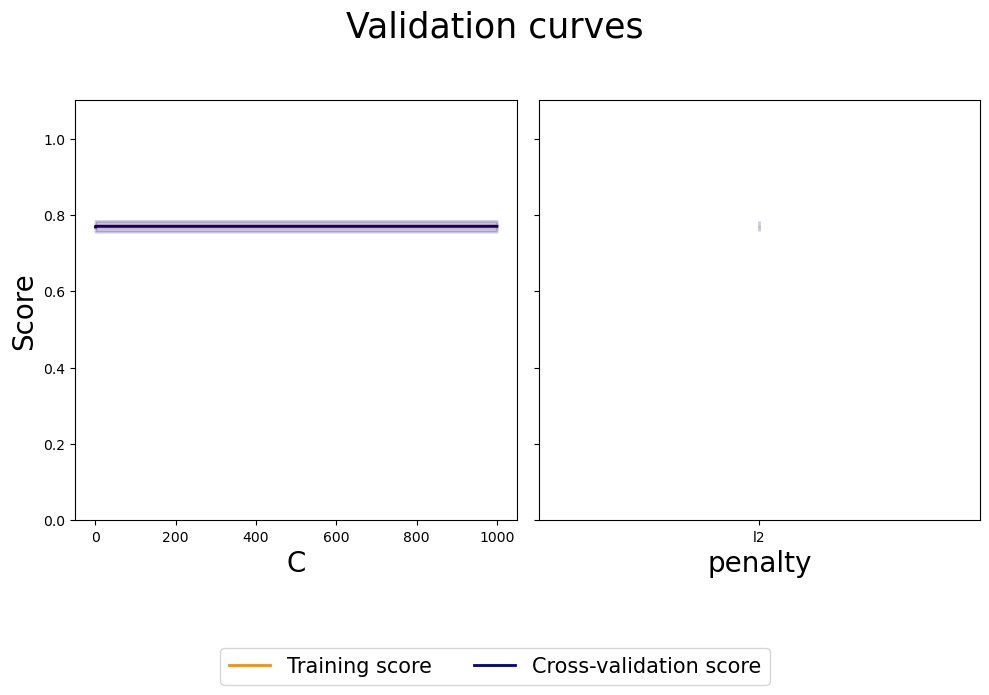

In [196]:
Utils.plotValidationCurve(logreg_cv, grid)

#### Fitting the Logistic Regression with the best parameters

In [197]:
logistic_regression = LogisticRegression(random_state=42, 
                                         C = 10.0, 
                                         penalty = 'l2')

In [198]:
scores_logistic_regression = cross_val_score(logistic_regression, X_train_classification, y_train, cv=8)
results['logistic_regression'] = scores_logistic_regression

In [199]:
logistic_regression.fit(X_train_classification, y_train)

LogisticRegression(C=10.0, random_state=42)

In [200]:
y_pred_logistic_regression = logistic_regression.predict(X_test_classification)
rocList['Logistic Regression'] = y_pred_logistic_regression
accuracy['Logistic Regression'] = accuracy_score(y_test, y_pred_logistic_regression)

In [201]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_logistic_regression))
print('F1-score %s' % f1_score(y_test, y_pred_logistic_regression, average=None))
Utils.printReport(y_test, y_pred_logistic_regression)

Accuracy 0.77836016473231
F1-score [0.79831933 0.75401662]
              precision    recall  f1-score   support

           0       0.79      0.81      0.80      4342
           1       0.77      0.74      0.75      3671

    accuracy                           0.78      8013
   macro avg       0.78      0.78      0.78      8013
weighted avg       0.78      0.78      0.78      8013



<AxesSubplot:>

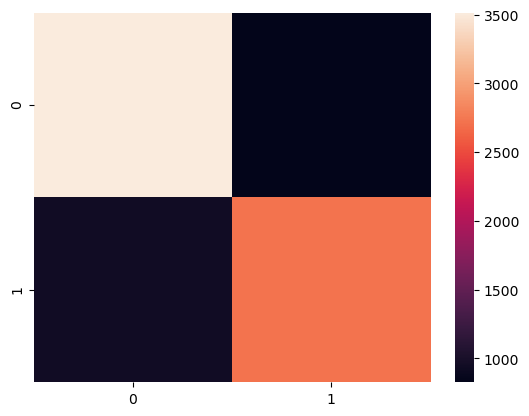

In [202]:
conf_matrix = confusion_matrix(y_test, y_pred_logistic_regression)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

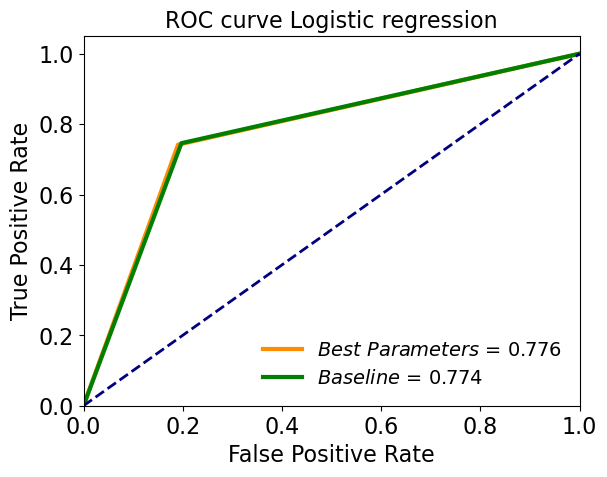

In [203]:
Utils.plotRoc(y_pred_logistic_regression, y_test, y_pred_baseline, "Logistic regression")

## Deep Learning Classifier using Keras

Neural Network are the most complex models we tried.

We decided to use them because we had a lot of data in our dataset. 

Unlike decision trees are difficult to interpret.

#### Baseline Neural Network

In [204]:
df_train = pd.read_csv("./Data/seasonal.csv")
target_seasonal = df_train.pop('seasonal_vaccine')
X_train, X_test, y_train, y_test = train_test_split(df_train, target_seasonal, test_size=0.3, random_state=42)

In [205]:
model = Sequential()
model.add(Dense(1, input_dim=15, activation='relu'))
model.add(Dense(1, input_dim=32, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [206]:
history = model.fit(X_train_classification,
                    y_train, 
                    epochs=30, 
                    validation_split = 0.2,
                    batch_size = 16)

Epoch 1/30
935/935 [==============================] - 1s 1ms/step - loss: 0.6684 - accuracy: 0.6455 - val_loss: 0.5722 - val_accuracy: 0.7478
Epoch 2/30
935/935 [==============================] - 1s 1ms/step - loss: 0.5481 - accuracy: 0.7580 - val_loss: 0.5176 - val_accuracy: 0.7743
Epoch 3/30
935/935 [==============================] - 1s 1ms/step - loss: 0.5206 - accuracy: 0.7676 - val_loss: 0.4994 - val_accuracy: 0.7769
Epoch 4/30
935/935 [==============================] - 1s 1ms/step - loss: 0.5121 - accuracy: 0.7691 - val_loss: 0.4907 - val_accuracy: 0.7780
Epoch 5/30
935/935 [==============================] - 1s 1ms/step - loss: 0.5073 - accuracy: 0.7696 - val_loss: 0.4866 - val_accuracy: 0.7783
Epoch 6/30
935/935 [==============================] - 1s 1ms/step - loss: 0.5040 - accuracy: 0.7712 - val_loss: 0.4830 - val_accuracy: 0.7783
Epoch 7/30
935/935 [==============================] - 1s 936us/step - loss: 0.5016 - accuracy: 0.7698 - val_loss: 0.4816 - val_accuracy: 0.7804
Epoc

In [207]:
model.summary()
# Il numero di parametri, ad esempio nel primo Dense Layer è 512 perchè abbiamo
# 32*15 + 32. 
# 32*15 perchè abbiamo 32*15 pesi nel senso che ognuno dei 15 input è collegato con i 32 neuroni
# poi però sommiamo 32 perchè dobbiamo anche considerare il bias

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1)                 16        
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 2         
Total params: 18
Trainable params: 18
Non-trainable params: 0
_________________________________________________________________


In [208]:
plot_model(model, show_shapes=True, show_layer_names=True)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


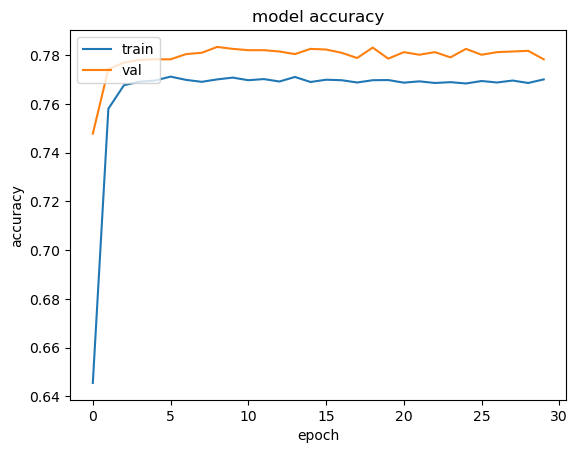

In [209]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

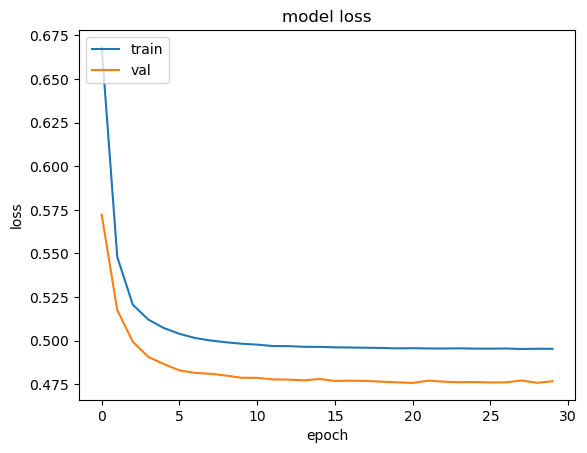

In [210]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


In [211]:
y_pred_baseline = model.predict_classes(X_test)

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).


In [212]:
Utils.printReport(y_test, y_pred_baseline)

              precision    recall  f1-score   support

           0       1.00      0.00      0.00      4342
           1       0.46      1.00      0.63      3671

    accuracy                           0.46      8013
   macro avg       0.73      0.50      0.31      8013
weighted avg       0.75      0.46      0.29      8013



#### Finding the best parameters - Batch Size and Number of Epochs

In [213]:
def create_model():
	model = Sequential()
	model.add(Dense(30, input_dim=15, activation='relu', input_shape=(15,)))
	model.add(Dense(1, activation='sigmoid'))
	model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model

In [214]:
seed = 42
np.random.seed(seed)

In [215]:
model = KerasClassifier(build_fn=create_model, verbose=0)

In [216]:
batch_size = [10, 20, 40, 60, 80, 100]
epochs = [10, 50, 100]
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = RandomizedSearchCV(estimator=model, 
                    param_distributions=param_grid, 
                    n_jobs=-1, 
                    cv=3,
                    verbose=2,
                    n_iter=7,  
                    scoring=scoring,
                    refit='Accuracy',
                    return_train_score=True)

In [217]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:  3.1min finished


In [218]:
print(grid.best_params_)

{'epochs': 10, 'batch_size': 20}


#### Finding the best parameters - Optimizer

In [219]:
def create_model(optimizer):
	model = Sequential()
	model.add(Dense(30, input_dim=15, activation='relu', input_shape=(15,)))
	model.add(Dense(1, activation='sigmoid'))
	model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])
	return model

In [220]:
model = KerasClassifier(build_fn=create_model, 
                         epochs=50, 
                         batch_size=10, 
                         verbose=0)

In [221]:
optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']

param_grid = dict(optimizer=optimizer)

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    n_jobs=-1, 
                    cv=3,
                    verbose=2,  
                    scoring=scoring,
                    refit='Accuracy',
                    return_train_score=True)

In [222]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:  5.9min finished


In [223]:
print(grid.best_params_)

{'optimizer': 'Adamax'}


#### Finding the best parameters - Learning Rate

In [224]:
def create_model(learn_rate=0.01):
    model = Sequential()
    model.add(Dense(30, input_dim=15, activation='relu', input_shape=(15,)))
    model.add(Dense(1, activation='sigmoid'))
    optimizer = Adamax(lr=learn_rate)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])
    return model

In [225]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=100, 
                        batch_size=10,
                        verbose=0)

In [226]:
learn_rate = [0.001, 0.01, 0.1, 0.2, 0.3, 0.5]
param_grid = dict(learn_rate=learn_rate)

In [227]:
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    n_jobs=-1, 
                    cv=3, 
                    verbose = 2)

In [228]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:  9.4min finished


In [229]:
print(grid.best_params_)

{'learn_rate': 0.001}


#### Finding the best parameters - Weight Initialization

In [230]:
def create_model(init_mode='uniform'):
    model = Sequential()
    model.add(Dense(30, input_dim=15, kernel_initializer=init_mode, activation='relu', input_shape=(15,)))
    model.add(Dense(1, kernel_initializer=init_mode, activation='sigmoid'))
    optimizer = Adamax(lr=0.001)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])
    return model

In [231]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=50, 
                        batch_size=10,
                        verbose=0)

In [232]:
init_mode = ['uniform', 'lecun_uniform', 'normal', 'zero', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform']
param_grid = dict(init_mode=init_mode)

In [233]:
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    n_jobs=-1, 
                    cv=3, 
                    verbose = 2)

In [234]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:  6.0min finished


In [235]:
print(grid.best_params_)

{'init_mode': 'he_normal'}


#### Finding the best parameters - Neuron Activation Function

In [236]:
def create_model(activation):
    model = Sequential()
    model.add(Dense(30, input_dim=15, 
                    kernel_initializer='glorot_uniform', 
                    activation= activation, 
                    input_shape=(15,)))
    model.add(Dense(1, 
                    kernel_initializer='glorot_uniform', 
                    activation='sigmoid'))
    optimizer = Adamax(lr=0.001)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])
    return model

In [237]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=50, 
                        batch_size=10,
                        verbose=0)

In [238]:
activation = [activations.softmax, activations.softplus, activations.softsign, activations.relu, activations.tanh, activations.sigmoid, activations.hard_sigmoid, activations.linear]
param_grid = dict(activation=activation)

In [239]:
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    n_jobs=-1, 
                    cv=3, 
                    verbose = 2)

In [240]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:  6.0min finished


In [241]:
print(grid.best_params_)

{'activation': <function softplus at 0x7f021be324c0>}


#### Finding the best parameters - Number of Neurons in the Hidden Layer

In [242]:
def create_model(neurons):
    model = Sequential()
    model.add(Dense(10, 
                    input_dim=15, 
                    kernel_initializer='glorot_uniform',
                    activation='softplus',
                    input_shape=(15,)))
    model.add(Dense(1, kernel_initializer='glorot_uniform', activation='sigmoid'))
    optimizer = Adamax(lr=0.001)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])
    return model

In [243]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=50, 
                        batch_size=10,
                        verbose=0)

In [244]:
neurons = [10, 20, 30, 50, 100, 200]
param_grid = dict(neurons=neurons)

In [245]:
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    n_jobs=-1, 
                    cv=3, 
                    verbose = 2)

In [246]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:  5.0min finished


In [247]:
print(grid.best_params_)

{'neurons': 10}


Considering the Grid Search, the best model has the following hyperparameters:
- Batch Size and Number of Epochs: 10, 50
- Optimizer : Adamax
- Learning Rate: 0.001
- Network Weight Initialization: glorot_uniform
- Neuron Activation Function: softplus
- Number of Neurons in the Hidden Layern: 30

### Fitting the Neural Network with the bast hyperparameters

In [248]:
import tensorflow as tf
from tensorflow import keras

In [249]:
def create_model():
    model = Sequential()
    model.add(Dense(30, input_dim=15, 
                        kernel_initializer='glorot_uniform', 
                        activation= 'softplus', 
                        input_shape=(15,)))
    model.add(Dense(1, 
                    kernel_initializer='glorot_uniform', 
                    activation='sigmoid'))
    optimizer = Adamax(lr=0.001)
    model.compile(loss='binary_crossentropy',
                      optimizer= optimizer,
                      metrics=['accuracy'])
    return model

In [250]:
es = EarlyStopping(monitor='val_accuracy', 
                   mode='max', 
                   verbose=1, 
                   patience=20)

In [251]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=200, 
                        batch_size=10,
                        verbose=0)

In [252]:
history = model.fit(X_train_classification, 
                    y_train, 
                    validation_split = 0.2, 
                    callbacks=[es])

Epoch 00120: early stopping


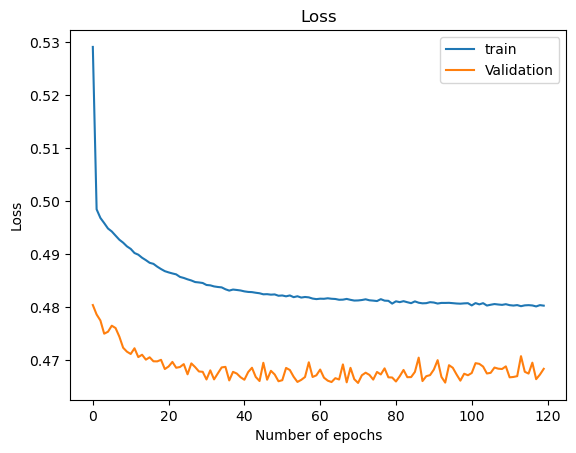

In [253]:
#_, train_acc = model.evaluate(X_train_classification, y_train, verbose=0)
#_, test_acc = model.evaluate(X_test, testy, verbose=0)
#print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))
# plot training history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='Validation')
plt.legend()
plt.xlabel('Number of epochs')
plt.ylabel('Loss')
plt.title('Loss')
plt.show()

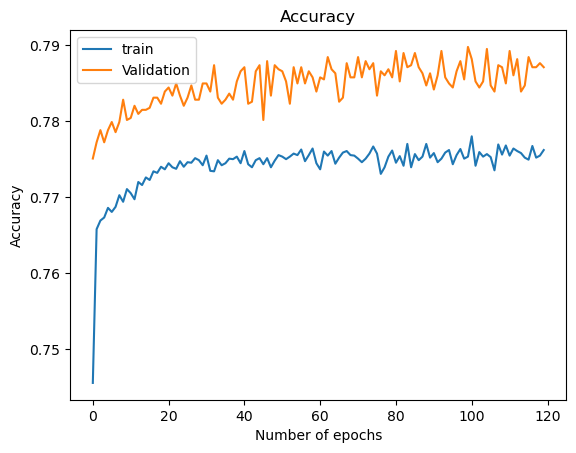

In [254]:
#_, train_acc = model.evaluate(X_train_classification, y_train, verbose=0)
#_, test_acc = model.evaluate(X_test, testy, verbose=0)
#print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))
# plot training history
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.legend()
plt.title('Accuracy')
plt.xlabel('Number of epochs')
plt.ylabel('Accuracy')
plt.show()

In [255]:
y_pred_neural = model.predict(X_test_classification).reshape(1,-1)[0]
rocList['Neural Network'] = y_pred_neural
accuracy['Neural Network'] = accuracy_score(y_test, y_pred_neural)

In [256]:
scores_rf = cross_val_score(model, X_train_classification, y_train, cv=8)
results['neural_network'] = scores_rf

In [257]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_neural))
print('F1-score %s' % f1_score(y_test, y_pred_neural, average=None))
Utils.printReport(y_test, y_pred_neural)

Accuracy 0.7797329339822788
F1-score [0.79493436 0.76209732]
              precision    recall  f1-score   support

           0       0.80      0.79      0.79      4342
           1       0.75      0.77      0.76      3671

    accuracy                           0.78      8013
   macro avg       0.78      0.78      0.78      8013
weighted avg       0.78      0.78      0.78      8013



<AxesSubplot:>

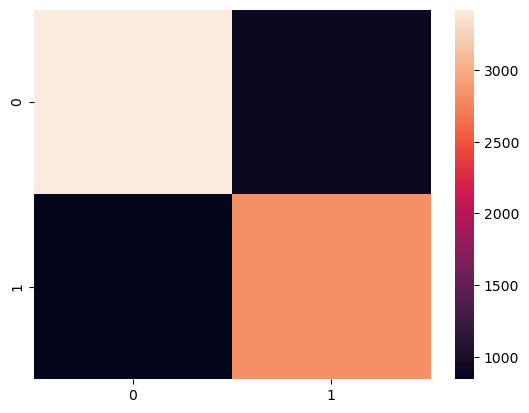

In [258]:
conf_matrix = confusion_matrix(y_test, y_pred_neural)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

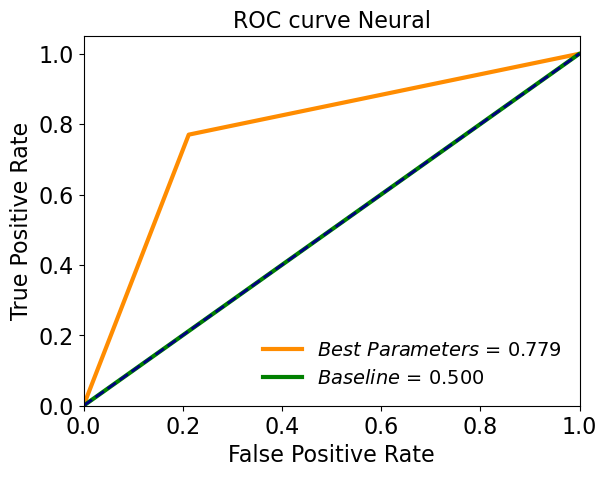

In [259]:
Utils.plotRoc(y_pred_neural, y_test, y_pred_baseline, "Neural")

## Model comparison and Evaluation

Once we finished the training of all the models for the seasonal target we made a plot to compare all the results.

In particulare we made a box plot to show the spread of the accuracy scores across each cross validation fold for each algorithm.

We valuated each model using the same random seed to ensure that the same splits to the training data were performed.

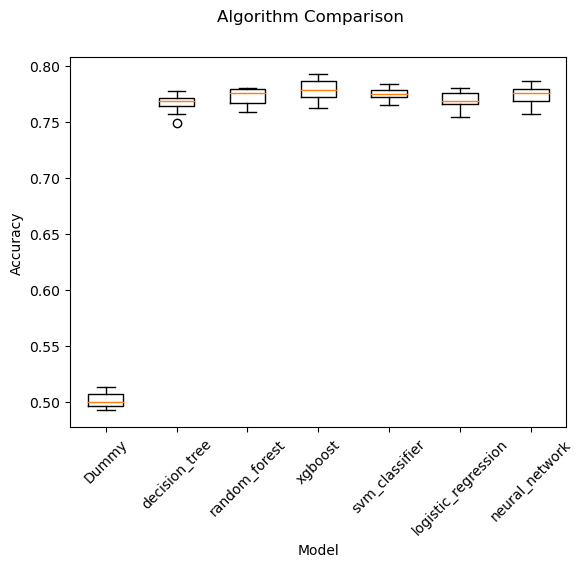

In [260]:
Utils.plotComparison(results)

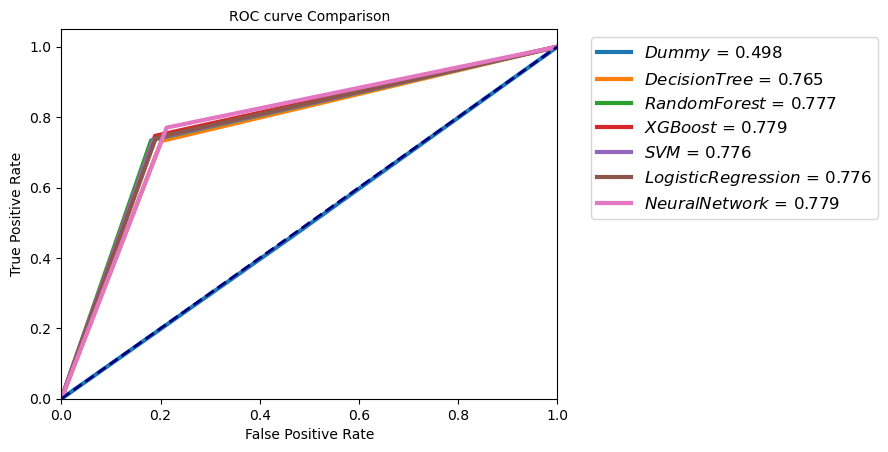

In [261]:
Utils.computeFullRoc(y_test, rocList)

<a id='fsseas'></a>
## 4AA. Feature selection Seasonal Vaccine ([to top](#top))

In this section we apply the RFECV on XGBoost and Decision Tree for the Seasonal flu dataset. 
We use https://www.scikit-yb.org/en/latest/api/model_selection/rfecv.html.

### XGBoost

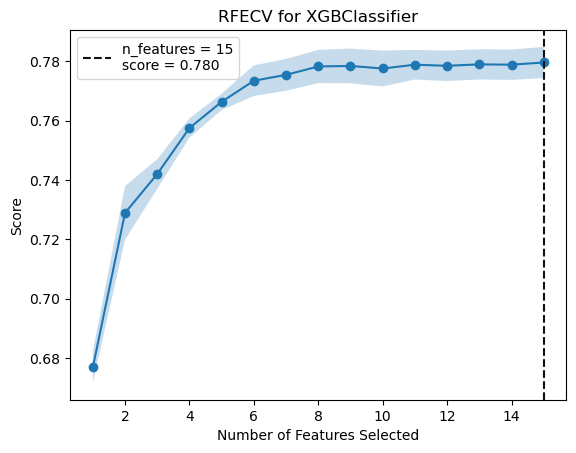

In [262]:
xgboost = XGBClassifier(subsample = 0.6,
                    n_estimators = 100,
                    min_child_weight = 10,
                    max_depth = 3,
                    learning_rate = 0.1,
                    gamma = 1,
                    colsample_bytree = 1.0)
seas_RFECV=Utils.visual_RFECV(xgboost,X_train_classification, y_train)

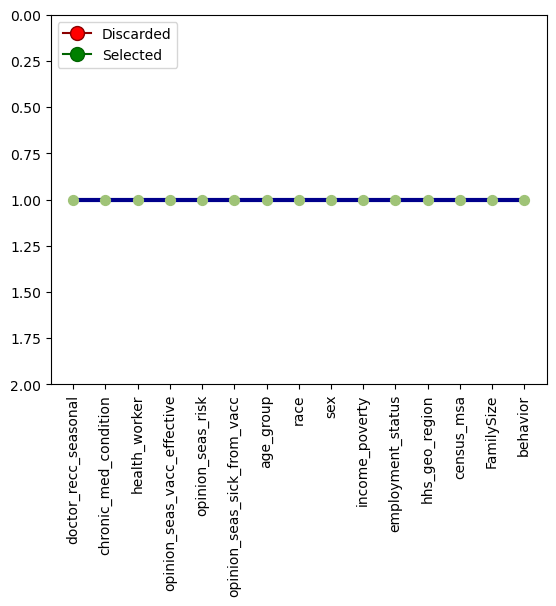

In [263]:
rank_df = Utils.print_features_rank(seas_RFECV, df_train,"seasonal_vaccine")

In [264]:
seas_RFECV.fit(X_train_classification, y_train)

RFECV(ax=<AxesSubplot:title={'center':'RFECV for XGBClassifier'}, xlabel='Number of Features Selected', ylabel='Score'>,
      model=None)

In [265]:
y_pred_xgboost = seas_RFECV.predict(X_test_classification)

In [266]:
xgboost.fit(X_train_classification, y_train)
y_pred_baseline = xgboost.predict(X_test_classification)

In [267]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_xgboost))
print('F1-score %s' % f1_score(y_test, y_pred_xgboost, average=None))
Utils.printReport(y_test, y_pred_xgboost)

Accuracy 0.7817296892549607
F1-score [0.80113701 0.75812474]
              precision    recall  f1-score   support

           0       0.79      0.81      0.80      4342
           1       0.77      0.75      0.76      3671

    accuracy                           0.78      8013
   macro avg       0.78      0.78      0.78      8013
weighted avg       0.78      0.78      0.78      8013



<AxesSubplot:>

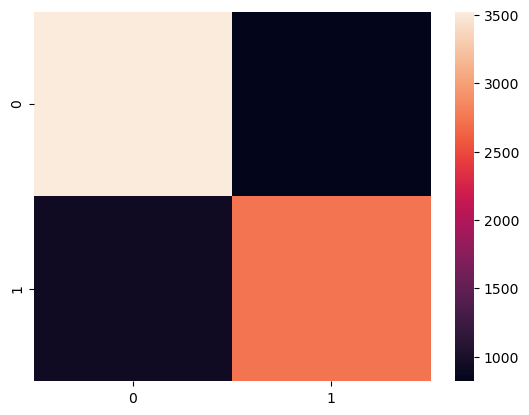

In [268]:
conf_matrix = confusion_matrix(y_test, y_pred_xgboost)
sns.heatmap(conf_matrix)

### Decision Tree

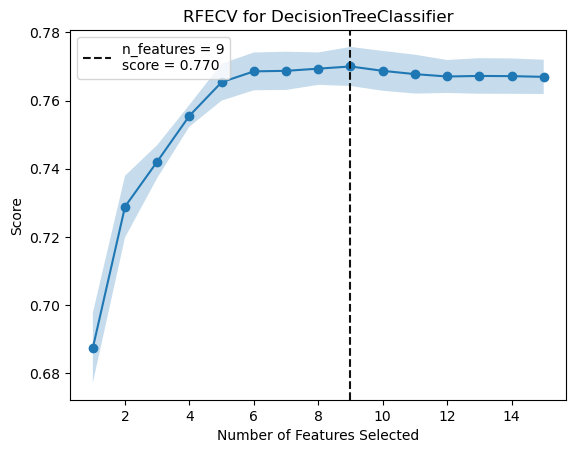

In [269]:
decision_tree = tree.DecisionTreeClassifier(criterion="entropy", 
                                 max_depth=12,
                                 min_samples_split=195)
seas_RFECV=Utils.visual_RFECV(decision_tree,X_train_classification, y_train)

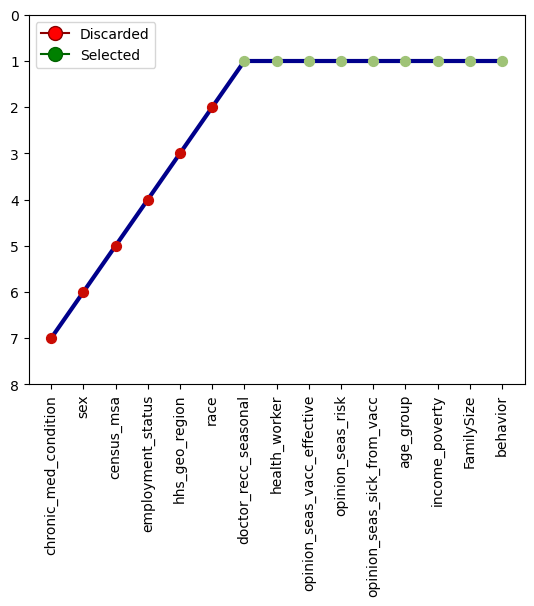

In [270]:
rank_df = Utils.print_features_rank(seas_RFECV, df_train,"seasonal_vaccine")

In [271]:
seas_RFECV.fit(X_train_classification, y_train)

RFECV(ax=<AxesSubplot:title={'center':'RFECV for DecisionTreeClassifier'}, xlabel='Number of Features Selected', ylabel='Score'>,
      model=None)

In [272]:
y_pred_decision_tree = seas_RFECV.predict(X_test_classification)

In [273]:
decision_tree.fit(X_train_classification, y_train)
y_pred_baseline = decision_tree.predict(X_test_classification)

In [274]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_decision_tree))
print('F1-score %s' % f1_score(y_test, y_pred_decision_tree, average=None))
Utils.printReport(y_test, y_pred_decision_tree)

Accuracy 0.7667540247098465
F1-score [0.78470222 0.74554118]
              precision    recall  f1-score   support

           0       0.78      0.78      0.78      4342
           1       0.75      0.75      0.75      3671

    accuracy                           0.77      8013
   macro avg       0.77      0.77      0.77      8013
weighted avg       0.77      0.77      0.77      8013



<AxesSubplot:>

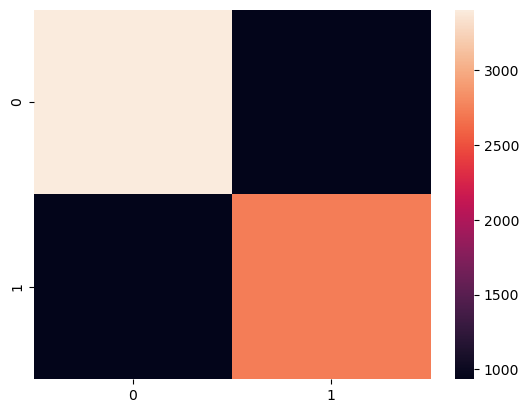

In [275]:
conf_matrix = confusion_matrix(y_test, y_pred_decision_tree)
sns.heatmap(conf_matrix)

<a id='h1n1mod'></a>
## 4B. Predict the H1N1 Vaccine ([to top](#top))


Once we finished the seasonal classifier we started the classification phase on the h1n1 target. 
The dataset we have for this target variable is unbalanced and so we tried several techniques to balance it and in the end we choose the one that provide us the best accuracy.

In this case the metric we used is the F1-Score.

In this section we will try the following models:

- Decision Tree: they are easy to explain because they can be expressed in a sort of rule language with conditions.
- Random Forest: it is an ensemble classifier, we decided to use it to improve the performances of the decision tree.
- XGBoost: it is an ensemble classifier, we decided to use it to improve the performances of the decision tree.
- SVM
- Logistic Regression: it models the probabilities for classification problems with two possible outcomes. We decided to use it because is interpretable.
- Neural Network: these model are the most complex, we decided to use them because we had a lot of data in our dataset. Unlike decision trees are difficult to interpret.

For each of them we will have the following approach:

- We will do a grid search to find the best hyperparameters (using a training and a validation set)
- We will train the model using the best hyperparameters using the training dataset and the validation set
- We will test the model using the test set

In [276]:
scoring = {'f1': make_scorer(f1_score)}

In [277]:
# Load the training set
df_train = pd.read_csv("./Data/h1n1.csv")

In [278]:
target_h1n1 = df_train.pop('h1n1_vaccine')

In [279]:
df_train.head()

,h1n1_knowledge,doctor_recc_h1n1,chronic_med_condition,child_under_6_months,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,age_group,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,FamilySize,behavior
0,0,0,0,0,0,3,1,2,3,3,0,0,1,8,2,1,2
1,2,0,0,0,0,5,4,4,1,3,1,0,0,1,0,1,4
2,1,0,1,0,0,3,1,1,0,3,1,1,0,9,0,3,1
3,1,0,1,0,0,3,3,5,4,3,0,0,1,5,1,1,2
4,1,0,0,0,0,3,3,2,2,3,0,1,0,9,0,2,3


In [280]:
X_train, X_test, y_train, y_test = train_test_split(df_train, target_h1n1, test_size=0.3, random_state=42)
X_train, y_train = Utils.under_sampler(X_train, y_train,42,0.6)

Resampled dataset shape Counter({0: 6633, 1: 3980})


In [281]:
X_train.shape

(10613, 17)

In [282]:
y_train.shape

(10613,)

In [283]:
y_train.value_counts()

0    6633
1    3980
Name: h1n1_vaccine, dtype: int64

In [284]:
df_test = pd.read_csv("./Data/test_set.csv")

In [285]:
df_test.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,...,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,26707,2.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,"> $75,000",Not Married,Rent,Employed,mlyzmhmf,"MSA, Not Principle City",1.0,0.0,atmlpfrs,hfxkjkmi
1,26708,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Below Poverty,Not Married,Rent,Employed,bhuqouqj,Non-MSA,3.0,0.0,atmlpfrs,xqwwgdyp
2,26709,2.0,2.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,"> $75,000",Married,Own,Employed,lrircsnp,Non-MSA,1.0,0.0,nduyfdeo,pvmttkik
3,26710,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,lrircsnp,"MSA, Not Principle City",1.0,0.0,NaN,NaN
4,26711,3.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,...,"<= $75,000, Above Poverty",Not Married,Own,Employed,lzgpxyit,Non-MSA,0.0,1.0,fcxhlnwr,mxkfnird


#### Define the Pipeline for the pre processing

In [286]:
numeric_cols = df_train.columns[df_train.dtypes != "object"].values

In [287]:
numeric_preprocessing_steps = Pipeline([
    ('standard_scaler', StandardScaler()),
    ('simple_imputer', SimpleImputer(strategy='median'))
])

preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", numeric_preprocessing_steps, numeric_cols)
    ],
    remainder = "drop"
)

In [288]:
X_train_classification = preprocessor.fit_transform(X_train)
X_test_classification = preprocessor.fit_transform(X_test)
X_train_refit = preprocessor.fit_transform(df_train)

In [289]:
results = {}
rocList = {}
accuracy = {}

## Dummy Classifier

First of all we developed a dummy classifier so that we could have a baseline classifier to make some comparisons.

In [290]:
dummy = DummyClassifier(strategy="stratified")

In [291]:
scores_dummy = cross_val_score(dummy, X_train_classification, y_train, cv=8)
results['Dummy'] = scores_dummy

In [292]:
dummy.fit(X_train_classification, y_train)

DummyClassifier(strategy='stratified')

In [293]:
y_pred_dummy = dummy.predict(X_test_classification)
rocList['Dummy'] = y_pred_dummy
accuracy['Dummy'] = accuracy_score(y_test, y_pred_dummy)

In [294]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_dummy))
print('F1-score %s' % f1_score(y_test, y_pred_dummy, average=None))
Utils.printReport(y_test, y_pred_dummy)

Accuracy 0.5828029452140272
F1-score [0.70408073 0.29308522]
              precision    recall  f1-score   support

           0       0.80      0.63      0.70      6319
           1       0.23      0.41      0.29      1694

    accuracy                           0.58      8013
   macro avg       0.51      0.52      0.50      8013
weighted avg       0.68      0.58      0.62      8013



<AxesSubplot:>

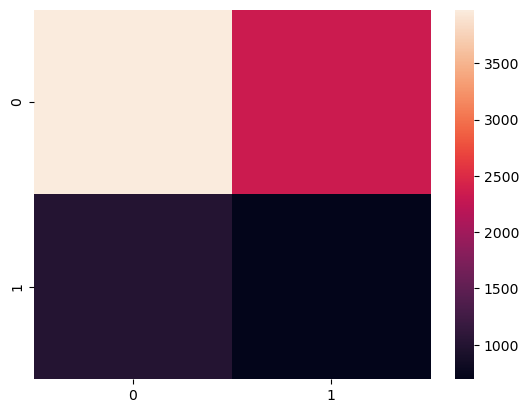

In [295]:
conf_matrix = confusion_matrix(y_test, y_pred_dummy)
sns.heatmap(conf_matrix)

## Decision Tree

The first classifier we tried was the Decision Tree.
We decided to use this classifier because of several reason:
- It is a simple classifier that we can use as a baseline for the more advanced models
- It is interpretable
- Can be visualized

#### Baseline Model

In [296]:
dt = tree.DecisionTreeClassifier(criterion="entropy", max_depth=4)

In [297]:
dt = dt.fit(X_train_classification, y_train)

In [298]:
y_pred_baseline = dt.predict(X_test_classification) 

In [299]:
Utils.printReport(y_test, y_pred_baseline)

              precision    recall  f1-score   support

           0       0.90      0.84      0.87      6319
           1       0.52      0.64      0.58      1694

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.80      0.81      8013



In [300]:
dot_data = tree.export_graphviz(dt, out_file=None) 
graph = graphviz.Source(dot_data) 

In [301]:
dot_data = tree.export_graphviz(dt, out_file=None, feature_names=X_test.columns.tolist(),
                                 class_names='Seasonal Vaccine',
                                 filled=True, rounded=True,
                                 special_characters=True)  
#graph = graphviz.Source(dot_data)
#graph

#### Finding the best hyperparameters

To find the best hyperparameters for the Decision Tree we did a Grid Search with cross validation considering several parameters.

In [302]:
param_grid = {'criterion':['gini','entropy'],
              'max_depth': np.arange(3, 20),
              'min_samples_split': np.arange(5,200,5),
              }

In [303]:
grid_search_cv = GridSearchCV(tree.DecisionTreeClassifier(),
                              param_grid,
                              verbose=2,
                              cv=10, 
                              n_jobs=-1, 
                              scoring=scoring,
                              refit='f1',
                              return_train_score=True)

In [304]:
grid_search_cv.fit(X_train_classification, y_train)

Fitting 10 folds for each of 1326 candidates, totalling 13260 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 956 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 2580 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 4844 tasks      | elapsed:   42.8s
[Parallel(n_jobs=-1)]: Done 7764 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 11324 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 13260 out of 13260 | elapsed:  2.0min finished


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]),
                         'min_samples_split': array([  5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,  65,
        70,  75,  80,  85,  90,  95, 100, 105, 110, 115, 120, 125, 130,
       135, 140, 145, 150, 155, 160, 165, 170, 175, 180, 185, 190, 195])},
             refit='f1', return_train_score=True,
             scoring={'f1': make_scorer(f1_score)}, verbose=2)

In [305]:
grid_search_cv.best_estimator_

DecisionTreeClassifier(max_depth=5, min_samples_split=170)

#### Evaluation of the best model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

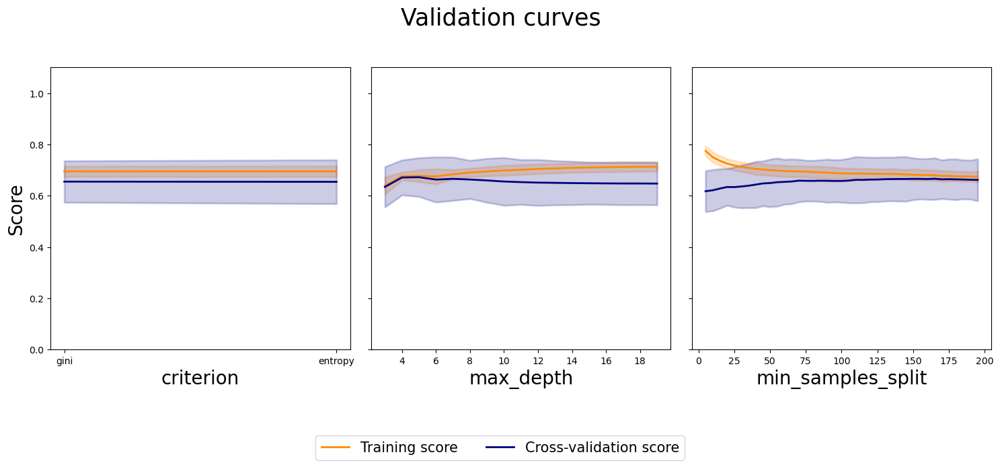

In [306]:
Utils.plotValidationCurve_F1(grid_search_cv, param_grid)

#### Fitting the decision Tree with the best parameters

In [307]:
decision_tree = tree.DecisionTreeClassifier(criterion="entropy", 
                                 max_depth=5,
                                 min_samples_split=170)

In [308]:
scores_dt = cross_val_score(decision_tree, X_train_classification, y_train, cv=8)
results['decision_tree'] = scores_dt

In [309]:
decision_tree.fit(X_train_classification, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_split=170)

In [310]:
y_pred_decision_tree = decision_tree.predict(X_test_classification) 
rocList['Decision Tree'] = y_pred_decision_tree

In [311]:
accuracy['Decision Tree'] = accuracy_score(y_test, y_pred_decision_tree)

In [312]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_decision_tree))
print('F1-score %s' % f1_score(y_test, y_pred_decision_tree, average=None))
Utils.printReport(y_test, y_pred_decision_tree)

Accuracy 0.8035692000499188
F1-score [0.87178234 0.58026667]
              precision    recall  f1-score   support

           0       0.90      0.85      0.87      6319
           1       0.53      0.64      0.58      1694

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.73      8013
weighted avg       0.82      0.80      0.81      8013



<AxesSubplot:>

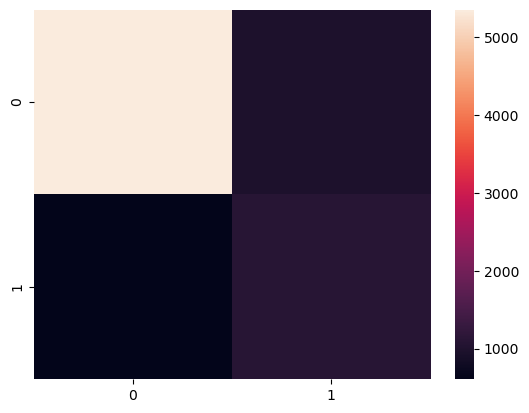

In [313]:
conf_matrix = confusion_matrix(y_test, y_pred_decision_tree)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

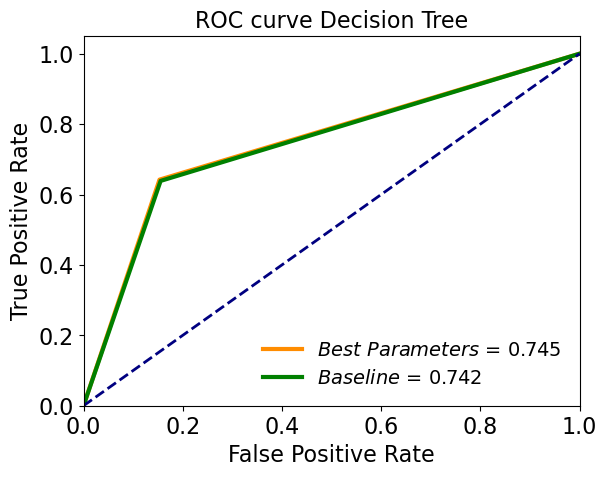

In [314]:
Utils.plotRoc(y_pred_decision_tree, y_test, y_pred_baseline, "Decision Tree")

# Ensemble Learning

## Random Forest

Random Forest is an ensemble learning classifier that fits a number of decision tree classifiers on some sub-samples of the dataset and uses the average to improve the predictive performances.


We used the Random Forest to improve the performances of the Decision Tree.

#### Baseline

In [315]:
rf = RandomForestClassifier(n_estimators = 100, random_state = 42)

In [316]:
rf.fit(X_train_classification, y_train)

RandomForestClassifier(random_state=42)

In [317]:
y_pred_baseline = rf.predict(X_test_classification)

In [318]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_baseline))

Accuracy: 0.8043179832771746


#### Finding the best hyperparameters

In [319]:
max_depth = [5, 10, 30, 40, 60, 80, 90, 110]
n_estimators = [100, 200, 300, 400]

param_grid = {'criterion':['gini','entropy'],
              'max_features': ['auto', 'sqrt'],
              'max_depth': max_depth,
              'min_samples_split': [2, 5, 10],
              'bootstrap': [True, False],
              'n_estimators': n_estimators
              }

In [320]:
rf = RandomForestClassifier(random_state = 42)

In [321]:
rf_random = RandomizedSearchCV(estimator = rf, 
                               param_distributions = param_grid, 
                               n_iter = 100, 
                               cv = 3, 
                               verbose=2, 
                               random_state=42,
                               n_jobs = -1, 
                               scoring=scoring,
                               refit='f1',
                               return_train_score=True)

In [322]:
rf_random.fit(X_train_classification, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.2min finished


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 10, 30, 40, 60, 80, 90,
                                                      110],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400]},
                   random_state=42, refit='f1', return_train_score=True,
                   scoring={'f1': make_scorer(f1_score)}, verbose=2)

In [323]:
rf_random.best_estimator_

RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=200,
                       random_state=42)

#### Evaluation of the best Model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

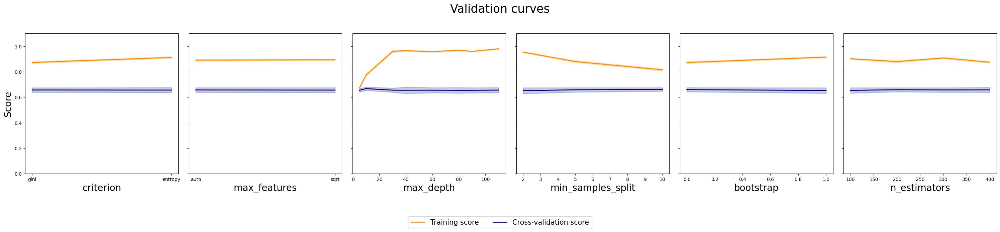

In [324]:
Utils.plotValidationCurve_F1(rf_random, param_grid)

#### Fitting the Random Forest with the best parameters

In [325]:
random_forest = RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=200, 
                            random_state=42)

In [326]:
scores_rf = cross_val_score(random_forest, X_train_classification, y_train, cv=8)
results['random_forest'] = scores_rf

In [327]:
random_forest.fit(X_train_classification, y_train)

RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=200,
                       random_state=42)

In [328]:
y_pred_random_forest = random_forest.predict(X_test_classification)
rocList['Random Forest'] = y_pred_random_forest
accuracy['Random Forest'] = accuracy_score(y_test, y_pred_random_forest)

In [329]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_random_forest))
print('F1-score %s' % f1_score(y_test, y_pred_random_forest, average=None))
Utils.printReport(y_test, y_pred_random_forest)

Accuracy 0.8155497316860102
F1-score [0.88153254 0.58366197]
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      6319
           1       0.56      0.61      0.58      1694

    accuracy                           0.82      8013
   macro avg       0.73      0.74      0.73      8013
weighted avg       0.82      0.82      0.82      8013



<AxesSubplot:>

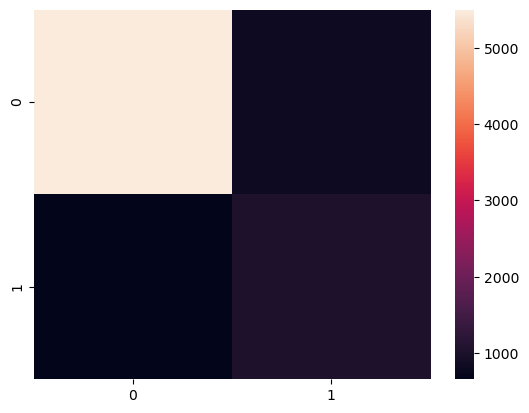

In [330]:
conf_matrix = confusion_matrix(y_test, y_pred_random_forest)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

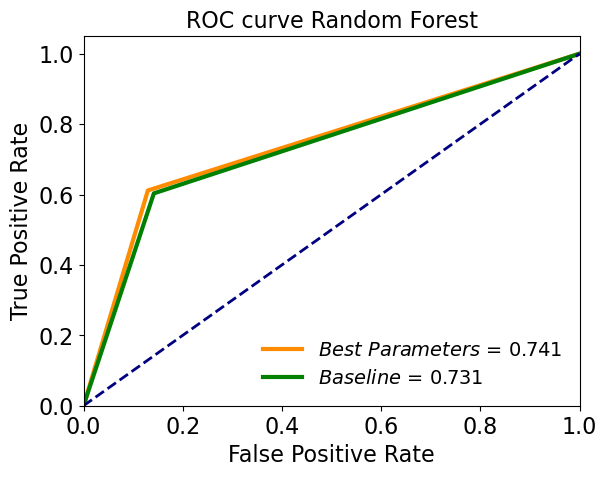

In [331]:
Utils.plotRoc(y_pred_random_forest, y_test, y_pred_baseline,  "Random Forest")

## XGBoost

XGBoost (eXtreme Gradient Boosting) is a library of gradient boosting algorithms optimized for modern data science problems and tools.

It is an ensemble classifier so we decided to use it to make a comparison with Random Forest and also to improve the performances of the Decision Tree.

#### Baseline

In [332]:
XGB = XGBClassifier()

In [333]:
XGB.fit(X_train_classification, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [334]:
y_pred_baseline = XGB.predict(X_test_classification)
y_pred_baseline = [round(value) for value in y_pred_baseline]

In [335]:
Utils.printReport(y_test, y_pred_baseline)

              precision    recall  f1-score   support

           0       0.89      0.85      0.87      6319
           1       0.51      0.59      0.55      1694

    accuracy                           0.79      8013
   macro avg       0.70      0.72      0.71      8013
weighted avg       0.81      0.79      0.80      8013



#### Finding the best hyperparameters

In [336]:
param_grid = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5],
        'learning_rate': [0.1, 0.01, 0.05],
        'n_estimators': range(60, 220, 40),
        }

In [337]:
folds = 5
param_comb = 5
skf = StratifiedKFold(n_splits=folds, 
                      shuffle = True, 
                      random_state = 42)

In [338]:
xgb = XGBClassifier()

In [339]:
random_search = RandomizedSearchCV(xgb, 
                                   param_distributions=param_grid, 
                                   n_iter=50, 
                                   n_jobs=4, 
                                   cv=skf.split(X_train,y_train), 
                                   verbose=3, 
                                   random_state=42,
                                   scoring=scoring,
                                   refit='f1',
                                   return_train_score=True)

random_search.fit(X_train_classification, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 250 out of 250 | elapsed:   51.8s finished


RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x7f0279c9feb0>,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing...
                                           verbosity=None),
                   n_iter=50, n_jobs=4,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2, 5],
                  

In [340]:
random_search.best_params_

{'subsample': 0.8,
 'n_estimators': 60,
 'min_child_weight': 5,
 'max_depth': 5,
 'learning_rate': 0.01,
 'gamma': 1.5,
 'colsample_bytree': 1.0}

#### Evaluation of the best Model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

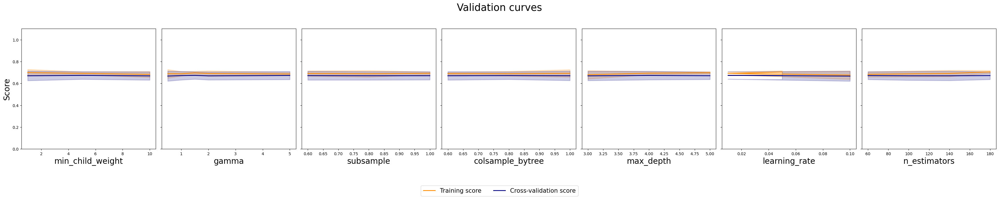

In [341]:
Utils.plotValidationCurve_F1(random_search, param_grid)

#### Fitting the XGBoost with the best parameters

In [342]:
xgboost = XGBClassifier(subsample = 0.8,
                    n_estimators = 60,
                    min_child_weight = 5,
                    max_depth = 5,
                    learning_rate = 0.01,
                    gamma = 1.5,
                    colsample_bytree = 1.0)

In [343]:
scores_xgboost = cross_val_score(xgboost, X_train_classification, y_train, cv=8)
results['xgboost'] = scores_xgboost

In [344]:
xgboost.fit(X_train_classification, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0, gamma=1.5, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=5,
              min_child_weight=5, missing=nan, monotone_constraints='()',
              n_estimators=60, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [345]:
y_pred_xgboost = xgboost.predict(X_test_classification)
rocList['XGBoost'] = y_pred_xgboost
accuracy['XGBoost Forest'] = accuracy_score(y_test, y_pred_xgboost)

In [346]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_xgboost))
print('F1-score %s' % f1_score(y_test, y_pred_xgboost, average=None))
Utils.printReport(y_test, y_pred_xgboost)

Accuracy 0.8111818295270186
F1-score [0.87795434 0.58308074]
              precision    recall  f1-score   support

           0       0.90      0.86      0.88      6319
           1       0.55      0.62      0.58      1694

    accuracy                           0.81      8013
   macro avg       0.72      0.74      0.73      8013
weighted avg       0.82      0.81      0.82      8013



<AxesSubplot:>

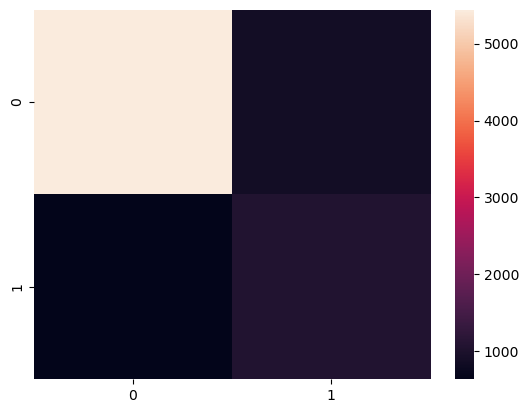

In [347]:
conf_matrix = confusion_matrix(y_test, y_pred_xgboost)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

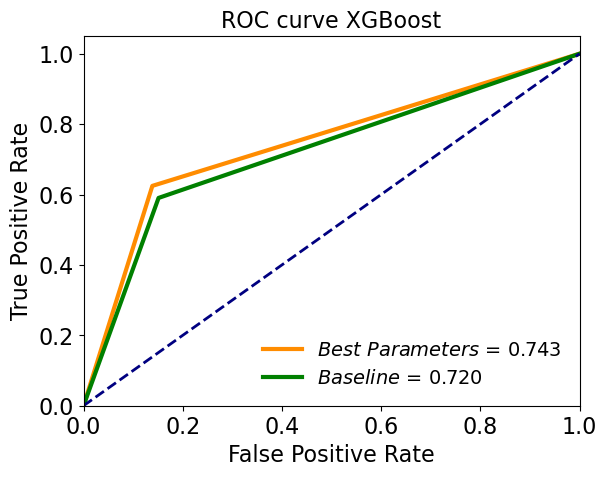

In [348]:
Utils.plotRoc(y_pred_xgboost, y_test, y_pred_baseline, "XGBoost")

## SVM

#### Baseline Model

In [349]:
svm_classifier = svm.SVC()

In [350]:
svm_classifier.fit(X_train_classification, y_train)

SVC()

In [351]:
y_pred_baseline = svm_classifier.predict(X_test_classification)

In [352]:
Utils.printReport(y_test, y_pred_baseline)

              precision    recall  f1-score   support

           0       0.89      0.86      0.88      6319
           1       0.54      0.62      0.58      1694

    accuracy                           0.81      8013
   macro avg       0.72      0.74      0.73      8013
weighted avg       0.82      0.81      0.81      8013



#### Finding the best hyperparameters

In [378]:
param_grid = {'C': [0.1, 1, 10, 100], 
              'gamma': [0.1, 0.01, 0.001],
              'kernel': ['rbf', 'poly', 'sigmoid']}

In [379]:
grid = RandomizedSearchCV(svm.SVC(), 
                          param_distributions=param_grid, 
                          n_iter=7,  
                          n_jobs=-1, 
                          cv = 3, 
                          verbose=3, 
                          scoring=scoring,
                          refit='f1',
                          return_train_score=True)
grid.fit(X_train_classification,y_train)

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:   16.4s finished


RandomizedSearchCV(cv=3, estimator=SVC(), n_iter=7, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100],
                                        'gamma': [0.1, 0.01, 0.001],
                                        'kernel': ['rbf', 'poly', 'sigmoid']},
                   refit='f1', return_train_score=True,
                   scoring={'f1': make_scorer(f1_score)}, verbose=3)

In [380]:
print(grid.best_params_)

{'kernel': 'rbf', 'gamma': 0.01, 'C': 10}


#### Evaluation of the best Model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

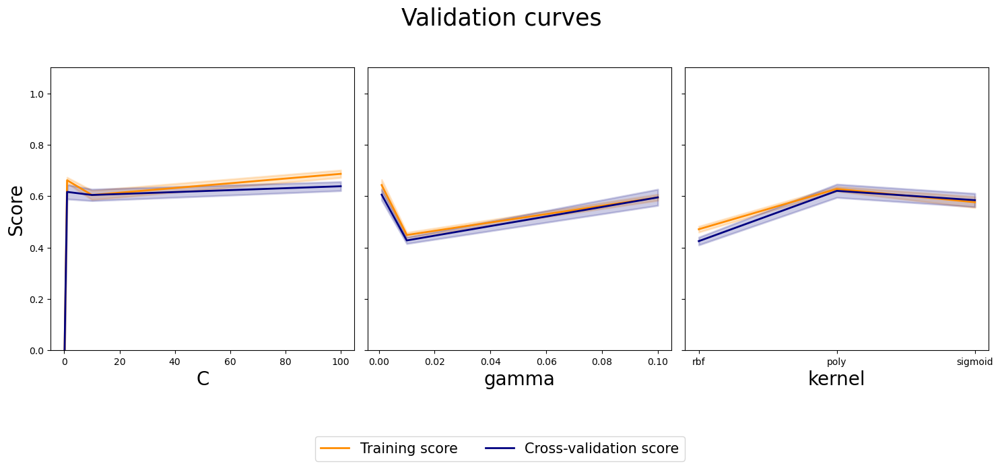

In [381]:
Utils.plotValidationCurve_F1(grid, param_grid)

#### Fitting the SVM with the best parameters

In [382]:
svm_classifier = svm.SVC(kernel = 'rbf', 
                         gamma = 0.01, 
                         C = 10)

In [383]:
scores_svm_classifier = cross_val_score(svm_classifier, X_train_classification, y_train, cv=8)
results['svm_classifier'] = scores_svm_classifier

In [384]:
svm_classifier.fit(X_train_classification, y_train)

SVC(C=10, gamma=0.01)

In [385]:
y_pred_SVM = svm_classifier.predict(X_test_classification)
rocList['SVM'] = y_pred_SVM
accuracy['SVM'] = accuracy_score(y_test, y_pred_SVM)

In [386]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_SVM))
print('F1-score %s' % f1_score(y_test, y_pred_SVM, average=None))
Utils.printReport(y_test, y_pred_SVM)

Accuracy 0.8080618994134532
F1-score [0.87727418 0.55981683]
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      6319
           1       0.54      0.58      0.56      1694

    accuracy                           0.81      8013
   macro avg       0.71      0.72      0.72      8013
weighted avg       0.81      0.81      0.81      8013



<AxesSubplot:>

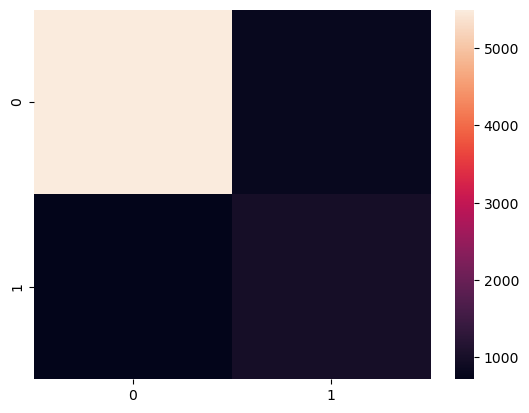

In [387]:
conf_matrix = confusion_matrix(y_test, y_pred_SVM)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

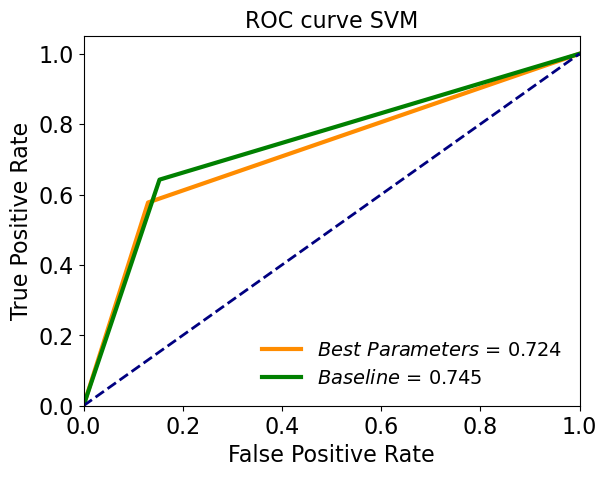

In [388]:
Utils.plotRoc(y_pred_SVM, y_test, y_pred_baseline, "SVM")

## Logistic regression

Logistic Regression models the probabilities for classification problems with two possible outcomes. 

We decided to use it because is interpretable.

#### Baseline model

In [389]:
lr = LogisticRegression(random_state=42)

In [390]:
lr.fit(X_train_classification, y_train)

LogisticRegression(random_state=42)

In [391]:
y_pred_baseline = lr.predict(X_test_classification)

In [392]:
y_pred = lr.predict(X_test_classification)

In [393]:
Utils.printReport(y_test, y_pred)

              precision    recall  f1-score   support

           0       0.90      0.83      0.86      6319
           1       0.51      0.66      0.58      1694

    accuracy                           0.79      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.79      0.80      8013



#### Finding the best hyper parameters

In [394]:
grid = {"C" : np.logspace(-3,3,7),
        "penalty" : ["l2"]} 

In [395]:
logreg=LogisticRegression(random_state=42)
logreg_cv=GridSearchCV(logreg,
                       grid,
                       cv=5,
                       scoring=scoring,
                       refit='f1',
                       return_train_score=True)
logreg_cv.fit(X_train_classification,y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=42),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             refit='f1', return_train_score=True,
             scoring={'f1': make_scorer(f1_score)})

In [396]:
print(logreg_cv.best_params_)

{'C': 1.0, 'penalty': 'l2'}


#### Evaluation of the best Model

In this plot we want to show how the performances of the model change base on the hyperparameters that we used during the training process.
For each plot we show the score that we obtained on the validation dataset and on the training dataset.

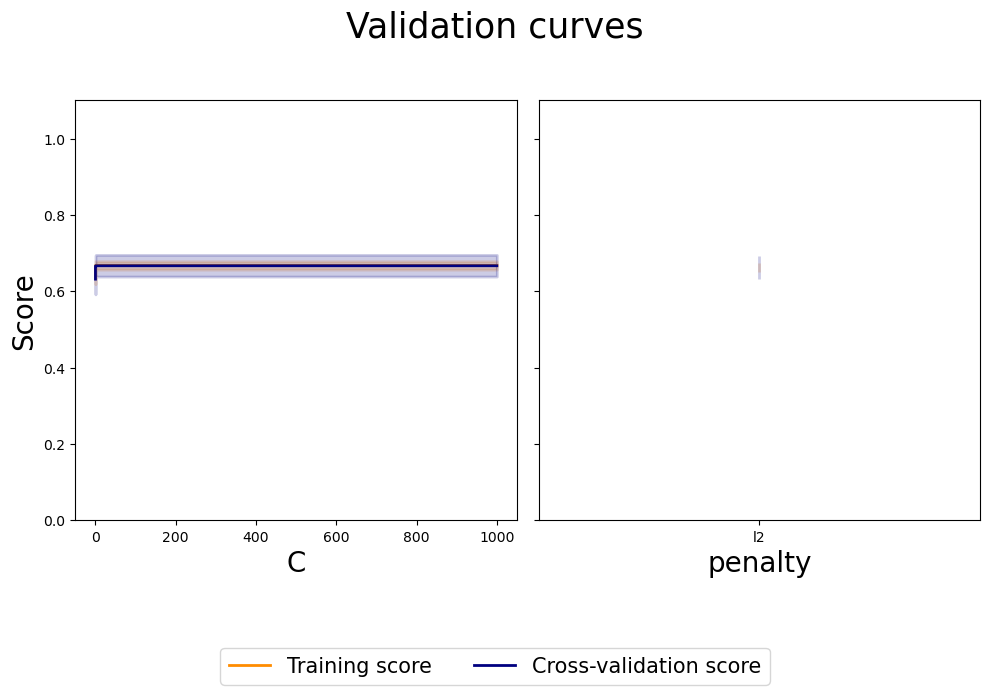

In [397]:
Utils.plotValidationCurve_F1(logreg_cv, grid)

#### Fitting the Logistic Regression with the best parameters

In [398]:
logistic_regression = LogisticRegression(random_state=42, 
                                         C = 1.0, 
                                         penalty = 'l2')

In [399]:
scores_logistic_regression = cross_val_score(logistic_regression, X_train_classification, y_train, cv=8)
results['logistic_regression'] = scores_logistic_regression

In [400]:
logistic_regression.fit(X_train_classification, y_train)

LogisticRegression(random_state=42)

In [401]:
y_pred_logistic_regression = logistic_regression.predict(X_test_classification)
rocList['Logistic Regression'] = y_pred_logistic_regression
accuracy['Logistic Regression'] = accuracy_score(y_test, y_pred_logistic_regression)

In [402]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_logistic_regression))
print('F1-score %s' % f1_score(y_test, y_pred_logistic_regression, average=None))
Utils.printReport(y_test, y_pred_logistic_regression)

Accuracy 0.7945838013228503
F1-score [0.86450445 0.57555441]
              precision    recall  f1-score   support

           0       0.90      0.83      0.86      6319
           1       0.51      0.66      0.58      1694

    accuracy                           0.79      8013
   macro avg       0.71      0.74      0.72      8013
weighted avg       0.82      0.79      0.80      8013



<AxesSubplot:>

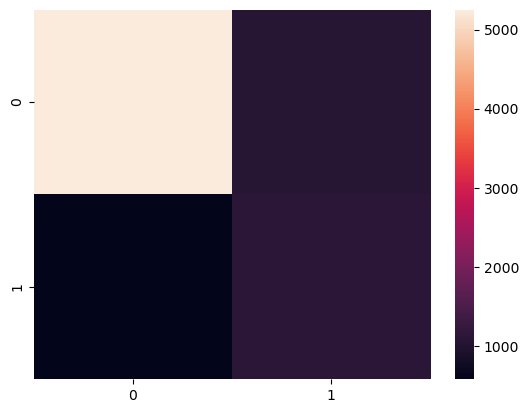

In [403]:
conf_matrix = confusion_matrix(y_test, y_pred_logistic_regression)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

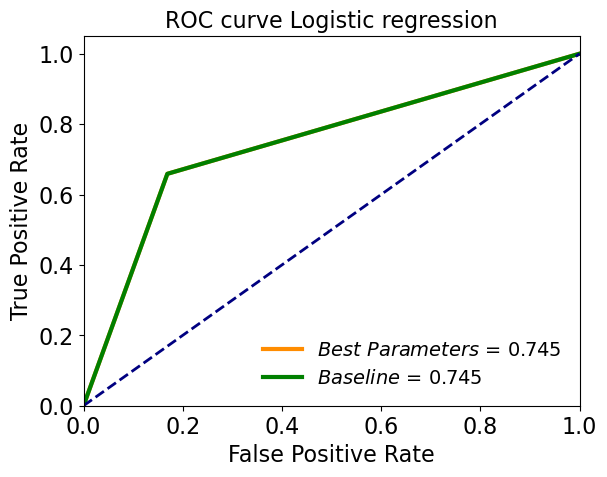

In [404]:
Utils.plotRoc(y_pred_logistic_regression, y_test, y_pred_baseline, "Logistic regression")

## Deep Learning Classifier using Keras

Neural Network are the most complex models we tried.

We decided to use them because we had a lot of data in our dataset. 

Unlike decision trees are difficult to interpret.

In [405]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [406]:
scoring = {'f1': make_scorer(f1_score)}

In [407]:
# Load the training set
df_train = pd.read_csv("./Data/h1n1.csv")

In [408]:
target_h1n1 = df_train.pop('h1n1_vaccine')

In [409]:
df_train.head()

,h1n1_knowledge,doctor_recc_h1n1,chronic_med_condition,child_under_6_months,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,age_group,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,FamilySize,behavior
0,0,0,0,0,0,3,1,2,3,3,0,0,1,8,2,1,2
1,2,0,0,0,0,5,4,4,1,3,1,0,0,1,0,1,4
2,1,0,1,0,0,3,1,1,0,3,1,1,0,9,0,3,1
3,1,0,1,0,0,3,3,5,4,3,0,0,1,5,1,1,2
4,1,0,0,0,0,3,3,2,2,3,0,1,0,9,0,2,3


In [410]:
X_train, X_test, y_train, y_test = train_test_split(df_train, target_h1n1, test_size=0.3, random_state=42, shuffle= True)
X_train, y_train = Utils.under_sampler(X_train, y_train, 42, 1)

Resampled dataset shape Counter({0: 3980, 1: 3980})


In [411]:
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.2, random_state=42, shuffle= True)

In [412]:
y_train.value_counts()

1    3207
0    3161
Name: h1n1_vaccine, dtype: int64

In [413]:
y_validation.value_counts()

0    819
1    773
Name: h1n1_vaccine, dtype: int64

In [414]:
y_test.value_counts()

0    6319
1    1694
Name: h1n1_vaccine, dtype: int64

In [415]:
df_test = pd.read_csv("./Data/test_set.csv")

In [416]:
df_test.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,...,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,26707,2.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,"> $75,000",Not Married,Rent,Employed,mlyzmhmf,"MSA, Not Principle City",1.0,0.0,atmlpfrs,hfxkjkmi
1,26708,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Below Poverty,Not Married,Rent,Employed,bhuqouqj,Non-MSA,3.0,0.0,atmlpfrs,xqwwgdyp
2,26709,2.0,2.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,"> $75,000",Married,Own,Employed,lrircsnp,Non-MSA,1.0,0.0,nduyfdeo,pvmttkik
3,26710,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,lrircsnp,"MSA, Not Principle City",1.0,0.0,NaN,NaN
4,26711,3.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,...,"<= $75,000, Above Poverty",Not Married,Own,Employed,lzgpxyit,Non-MSA,0.0,1.0,fcxhlnwr,mxkfnird


#### Define the Pipeline for the pre processing

In [417]:
numeric_cols = df_train.columns[df_train.dtypes != "object"].values

In [418]:
numeric_preprocessing_steps = Pipeline([
    ('standard_scaler', StandardScaler()),
    ('simple_imputer', SimpleImputer(strategy='median'))
])

preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", numeric_preprocessing_steps, numeric_cols)
    ],
    remainder = "drop"
)

In [419]:
X_train_classification = preprocessor.fit_transform(X_train)
X_validation_classification = preprocessor.fit_transform(X_validation)
X_test_classification = preprocessor.fit_transform(X_test)
X_train_refit = preprocessor.fit_transform(df_train)

#### Baseline Neural Network

In [420]:
from numpy.random import seed
seed(1)

In [421]:
from keras.layers import LeakyReLU
model = Sequential()
model.add(Dense(1, input_dim=17, activation='relu'))
model.add(Dense(1, input_dim=32, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='Adam', metrics=['accuracy', f1_m,precision_m, recall_m])

In [422]:
history = model.fit(X_train_classification,
                    y_train, 
                    epochs=30, 
                    validation_data=(X_validation_classification, y_validation),
                    batch_size = 16)

Epoch 1/30
398/398 [==============================] - 1s 2ms/step - loss: 0.6690 - accuracy: 0.6110 - f1_m: 0.4994 - precision_m: 0.5020 - recall_m: 0.5201 - val_loss: 0.6437 - val_accuracy: 0.6928 - val_f1_m: 0.6776 - val_precision_m: 0.6640 - val_recall_m: 0.7214
Epoch 2/30
398/398 [==============================] - 0s 1ms/step - loss: 0.6293 - accuracy: 0.6917 - f1_m: 0.6861 - precision_m: 0.6858 - recall_m: 0.7147 - val_loss: 0.6062 - val_accuracy: 0.7224 - val_f1_m: 0.7088 - val_precision_m: 0.6879 - val_recall_m: 0.7561
Epoch 3/30
398/398 [==============================] - 0s 1ms/step - loss: 0.5993 - accuracy: 0.7192 - f1_m: 0.7139 - precision_m: 0.7060 - recall_m: 0.7455 - val_loss: 0.5814 - val_accuracy: 0.7381 - val_f1_m: 0.7262 - val_precision_m: 0.7072 - val_recall_m: 0.7719
Epoch 4/30
398/398 [==============================] - 0s 1ms/step - loss: 0.5788 - accuracy: 0.7316 - f1_m: 0.7277 - precision_m: 0.7272 - recall_m: 0.7575 - val_loss: 0.5635 - val_accuracy: 0.7450 - va

In [423]:
model.summary()
# Il numero di parametri, ad esempio nel primo Dense Layer è 512 perchè abbiamo
# 32*15 + 32. 
# 32*15 perchè abbiamo 32*15 pesi nel senso che ognuno dei 15 input è collegato con i 32 neuroni
# poi però sommiamo 32 perchè dobbiamo anche considerare il bias

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_32 (Dense)             (None, 1)                 18        
_________________________________________________________________
dense_33 (Dense)             (None, 1)                 2         
Total params: 20
Trainable params: 20
Non-trainable params: 0
_________________________________________________________________


In [424]:
import pydot
plot_model(model, show_shapes=True, show_layer_names=True)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


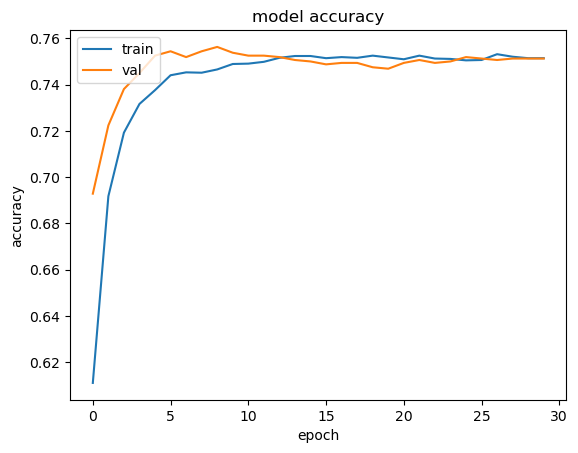

In [425]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

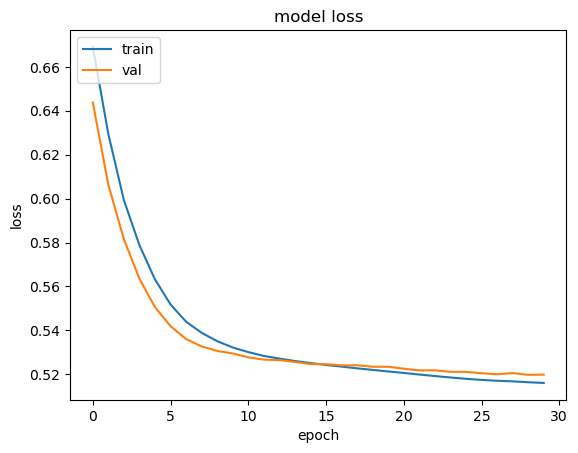

In [426]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


In [427]:
y_pred_baseline = model.predict_classes(X_test_classification)

In [428]:
Utils.printReport(y_test, y_pred_baseline)

              precision    recall  f1-score   support

           0       0.93      0.66      0.77      6319
           1       0.39      0.81      0.53      1694

    accuracy                           0.69      8013
   macro avg       0.66      0.74      0.65      8013
weighted avg       0.81      0.69      0.72      8013



In [429]:
print(confusion_matrix(y_test, y_pred_baseline))

[[4171 2148]
 [ 320 1374]]


#### Finding the best parameters - Batch Size and Number of Epochs

In [430]:
def create_model():
	model = Sequential()
	model.add(Dense(30, input_dim=17, activation='relu', input_shape=(17,)))
	model.add(Dense(1, activation='sigmoid'))
	model.compile(loss='binary_crossentropy', optimizer='adam', metrics=[f1_m, precision_m, recall_m, 'accuracy'])
	return model

In [431]:
seed = 42
np.random.seed(seed)

In [432]:
model = KerasClassifier(build_fn=create_model, verbose=0)

In [433]:
batch_size = [10, 20, 40, 60, 80, 100]
epochs = [10, 50, 100]
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = RandomizedSearchCV(estimator=model, 
                    param_distributions=param_grid, 
                    n_jobs=-1, 
                    cv=3,
                    verbose=2,
                    n_iter=7,  
                    scoring=scoring,
                    refit='f1',
                    return_train_score=True)

In [434]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:  1.2min finished


In [435]:
print(grid.best_params_)

{'epochs': 10, 'batch_size': 20}


#### Finding the best parameters - Optimizer

In [436]:
def create_model(optimizer):
	model = Sequential()
	model.add(Dense(30, input_dim=17, activation='relu', input_shape=(17,)))
	model.add(Dense(1, activation='sigmoid'))
	model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=[f1_m, precision_m, recall_m, 'accuracy'])
	return model

In [437]:
model = KerasClassifier(build_fn=create_model, 
                         epochs=10, 
                         batch_size=10, 
                         verbose=0)

In [438]:
optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']

param_grid = dict(optimizer=optimizer)

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    n_jobs=-1, 
                    cv=3,
                    verbose=2,  
                    scoring=scoring,
                    refit='f1',
                    return_train_score=True)

In [439]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:   31.5s finished


In [440]:
print(grid.best_params_)

{'optimizer': 'Adamax'}


#### Finding the best parameters - Learning Rate

In [441]:
def create_model(learn_rate=0.01):
    model = Sequential()
    model.add(Dense(30, input_dim=17, activation='relu', input_shape=(17,)))
    model.add(Dense(1, activation='sigmoid'))
    optimizer = tf.keras.optimizers.Adamax(lr=learn_rate)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=[f1_m, precision_m, recall_m, 'accuracy',])
    return model

In [442]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=10, 
                        batch_size=10,
                        verbose=0)

In [443]:
learn_rate = [0.001, 0.01, 0.1, 0.2, 0.3, 0.5]
param_grid = dict(learn_rate=learn_rate)

In [444]:
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    n_jobs=-1, 
                    cv=3, 
                    verbose = 2)

In [445]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:   26.8s finished


In [446]:
print(grid.best_params_)

{'learn_rate': 0.001}


#### Finding the best parameters - Weight Initialization

In [447]:
def create_model(init_mode='uniform'):
    model = Sequential()
    model.add(Dense(30, input_dim=17, kernel_initializer=init_mode, activation='relu', input_shape=(17,)))
    model.add(Dense(1, kernel_initializer=init_mode, activation='sigmoid'))
    optimizer = tf.keras.optimizers.Adamax(lr=0.001)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=[f1_m, precision_m, recall_m, 'accuracy',])
    return model

In [448]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=10, 
                        batch_size=10,
                        verbose=0)

In [449]:
init_mode = ['uniform', 'lecun_uniform', 'normal', 'zero', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform']
param_grid = dict(init_mode=init_mode)

In [450]:
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    n_jobs=-1, 
                    cv=3, 
                    verbose = 2)

In [451]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:   32.5s finished


In [452]:
print(grid.best_params_)

{'init_mode': 'glorot_normal'}


#### Finding the best parameters - Neuron Activation Function

In [453]:
def create_model(activation):
    model = Sequential()
    model.add(Dense(30, input_dim=17, 
                    kernel_initializer='lecun_uniform', 
                    activation= activation, 
                    input_shape=(17,)))
    model.add(Dense(1, 
                    kernel_initializer='lecun_uniform', 
                    activation='sigmoid'))
    optimizer = tf.keras.optimizers.Adamax(lr=0.001)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=[f1_m, precision_m, recall_m, 'accuracy',])
    return model

In [454]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=10, 
                        batch_size=10,
                        verbose=0)

In [455]:
activation = [activations.softmax, activations.softplus, activations.softsign, activations.relu, activations.tanh, activations.sigmoid, activations.hard_sigmoid, activations.linear]
param_grid = dict(activation=activation)

In [456]:
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    n_jobs=-1, 
                    cv=3, 
                    verbose = 2)

In [457]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:   31.4s finished


In [458]:
print(grid.best_params_)

{'activation': <function softsign at 0x7f021be325e0>}


#### Finding the best parameters - Number of Neurons in the Hidden Layer

In [459]:
def create_model(neurons):
    model = Sequential()
    model.add(Dense(30, 
                    input_dim=17, 
                    kernel_initializer='lecun_uniform',
                    activation='linear',
                    input_shape=(17,)))
    model.add(Dense(1, kernel_initializer='lecun_uniform', activation='linear'))
    optimizer = tf.keras.optimizers.Adamax(lr=0.001)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=[f1_m, precision_m, recall_m, 'accuracy',])
    return model

In [460]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=10, 
                        batch_size=10,
                        verbose=0)

In [461]:
neurons = [10, 20, 30, 50, 100, 200]
param_grid = dict(neurons=neurons)

In [462]:
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    n_jobs=-1, 
                    cv=3, 
                    verbose = 2)

In [463]:
grid_result = grid.fit(X_train_classification, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:   26.2s finished


In [464]:
print(grid.best_params_)

{'neurons': 50}


Considering the Grid Search, the best model has the following hyperparameters:
- Batch Size and Number of Epochs: 10, 10
- Optimizer: Adamax
- Learning Rate: 0.001
- Network Weight Initialization: lecun_uniform
- Neuron Activation Function: linear
- Number of Neurons in the Hidden Layern: 100

### Fitting the Neural Network with the bast hyperparameters

In [465]:
def create_model():
    model = Sequential()
    model.add(Dense(100, 
                    input_dim=17, 
                    kernel_initializer='lecun_uniform',
                    activation='linear',
                    input_shape=(17,)))
    model.add(Dense(1, kernel_initializer='lecun_uniform', activation='linear'))
    optimizer = tf.keras.optimizers.Adamax(lr=0.001)
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=[f1_m, precision_m, recall_m, 'accuracy',])
    return model

In [466]:
es = EarlyStopping(monitor='f1_m', 
                   mode='max', 
                   verbose=1, 
                   patience=20)

In [467]:
model = KerasClassifier(build_fn=create_model, 
                        epochs=100, 
                        batch_size=8,
                        verbose=1)

In [468]:
history = model.fit(X_train_classification, 
                    y_train, 
                    validation_data=(X_validation_classification, y_validation),
                    callbacks=[es])

Epoch 1/100
796/796 [==============================] - 1s 1ms/step - loss: 5.9581 - f1_m: 0.2389 - precision_m: 0.3718 - recall_m: 0.2011 - accuracy: 0.4559 - val_loss: 5.2685 - val_f1_m: 0.2556 - val_precision_m: 0.4075 - val_recall_m: 0.2156 - val_accuracy: 0.4893
Epoch 2/100
796/796 [==============================] - 1s 995us/step - loss: 5.7049 - f1_m: 0.2518 - precision_m: 0.4117 - recall_m: 0.2054 - accuracy: 0.4791 - val_loss: 5.0576 - val_f1_m: 0.2774 - val_precision_m: 0.4418 - val_recall_m: 0.2326 - val_accuracy: 0.5132
Epoch 3/100
796/796 [==============================] - 1s 983us/step - loss: 5.4053 - f1_m: 0.2838 - precision_m: 0.4312 - recall_m: 0.2381 - accuracy: 0.4915 - val_loss: 4.9048 - val_f1_m: 0.2947 - val_precision_m: 0.4578 - val_recall_m: 0.2469 - val_accuracy: 0.5214
Epoch 4/100
796/796 [==============================] - 1s 1ms/step - loss: 5.2981 - f1_m: 0.2902 - precision_m: 0.4501 - recall_m: 0.2455 - accuracy: 0.4923 - val_loss: 4.8668 - val_f1_m: 0.2952 

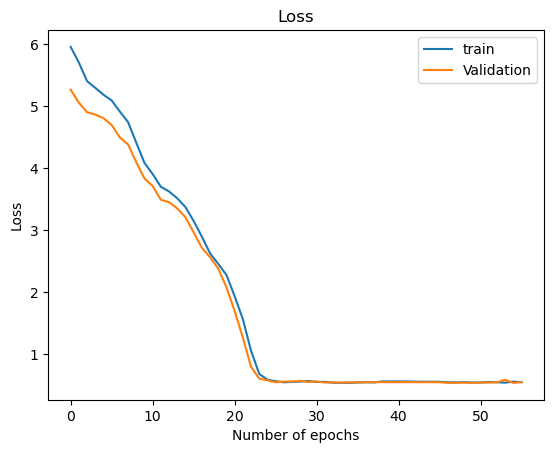

In [469]:
#_, train_acc = model.evaluate(X_train_classification, y_train, verbose=0)
#_, test_acc = model.evaluate(X_test, testy, verbose=0)
#print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))
# plot training history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='Validation')
plt.legend()
plt.xlabel('Number of epochs')
plt.ylabel('Loss')
plt.title('Loss')
plt.show()

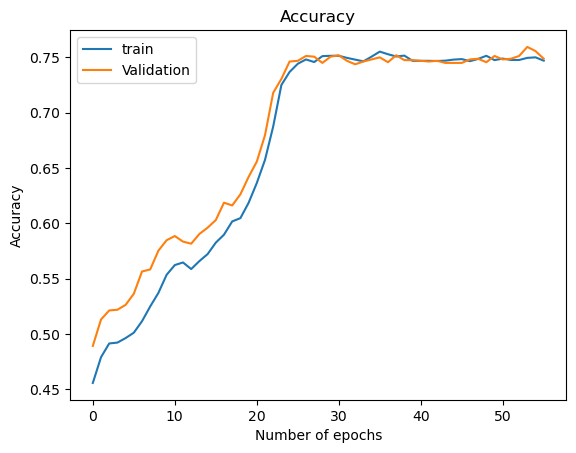

In [470]:
#_, train_acc = model.evaluate(X_train_classification, y_train, verbose=0)
#_, test_acc = model.evaluate(X_test, testy, verbose=0)
#print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))
# plot training history
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.legend()
plt.title('Accuracy')
plt.xlabel('Number of epochs')
plt.ylabel('Accuracy')
plt.show()

In [471]:
y_pred_neural = model.predict(X_test_classification).reshape(1,-1)[0]
rocList['Neural Network'] = y_pred_neural
accuracy['Neural Network'] = accuracy_score(y_test, y_pred_neural)

1002/1002 [==============================] - 1s 537us/step


In [472]:
scores_rf = cross_val_score(model, X_train_classification, y_train, cv=8)
results['neural_network'] = scores_rf

Epoch 1/100
697/697 [==============================] - 1s 1ms/step - loss: 5.0855 - f1_m: 0.4531 - precision_m: 0.5748 - recall_m: 0.4181 - accuracy: 0.5625
Epoch 2/100
697/697 [==============================] - 1s 965us/step - loss: 4.2230 - f1_m: 0.5209 - precision_m: 0.6661 - recall_m: 0.4745 - accuracy: 0.6206
Epoch 3/100
697/697 [==============================] - 1s 998us/step - loss: 3.8681 - f1_m: 0.5561 - precision_m: 0.7053 - recall_m: 0.5059 - accuracy: 0.6522
Epoch 4/100
697/697 [==============================] - 1s 936us/step - loss: 3.7206 - f1_m: 0.5590 - precision_m: 0.7008 - recall_m: 0.5110 - accuracy: 0.6588
Epoch 5/100
697/697 [==============================] - 1s 818us/step - loss: 3.5298 - f1_m: 0.5874 - precision_m: 0.7360 - recall_m: 0.5383 - accuracy: 0.6761
Epoch 6/100
697/697 [==============================] - 1s 794us/step - loss: 3.3258 - f1_m: 0.5945 - precision_m: 0.7391 - recall_m: 0.5421 - accuracy: 0.6872
Epoch 7/100
697/697 [===========================

In [473]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_neural))
print('F1-score %s' % f1_score(y_test, y_pred_neural, average=None))
Utils.printReport(y_test, y_pred_neural)

Accuracy 0.7261949332334956
F1-score [0.80515098 0.5396559 ]
              precision    recall  f1-score   support

           0       0.92      0.72      0.81      6319
           1       0.42      0.76      0.54      1694

    accuracy                           0.73      8013
   macro avg       0.67      0.74      0.67      8013
weighted avg       0.81      0.73      0.75      8013



<AxesSubplot:>

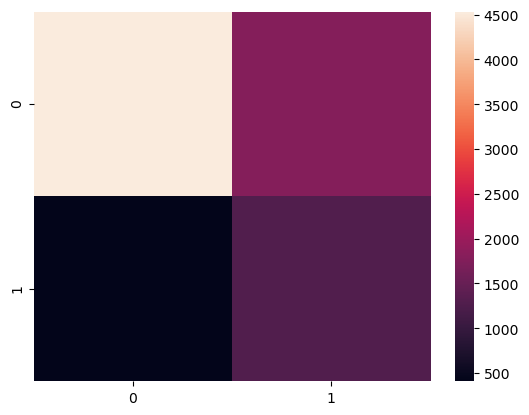

In [474]:
conf_matrix = confusion_matrix(y_test, y_pred_neural)
sns.heatmap(conf_matrix)

In the end we plot the ROC Curve of the model to show the performances of the baseline and the performances of the best model

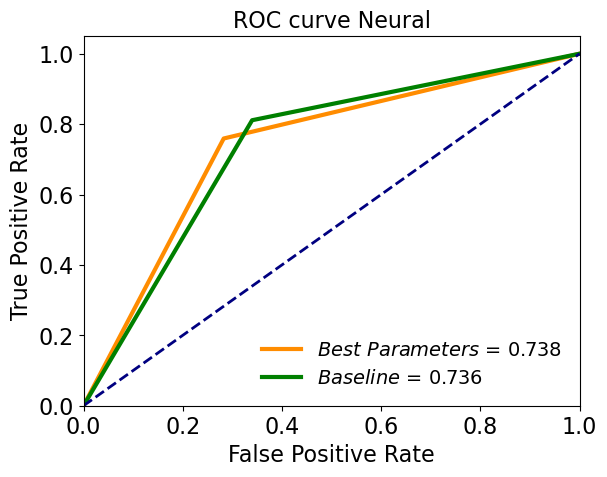

In [475]:
Utils.plotRoc(y_pred_neural, y_test, y_pred_baseline, "Neural")

## Model comparison and Evaluation

Once we finished the training of all the models for the seasonal target we made a plot to compare all the results.

In particulare we made a box plot to show the spread of the accuracy scores across each cross validation fold for each algorithm.

We valuated each model using the same random seed to ensure that the same splits to the training data were performed.

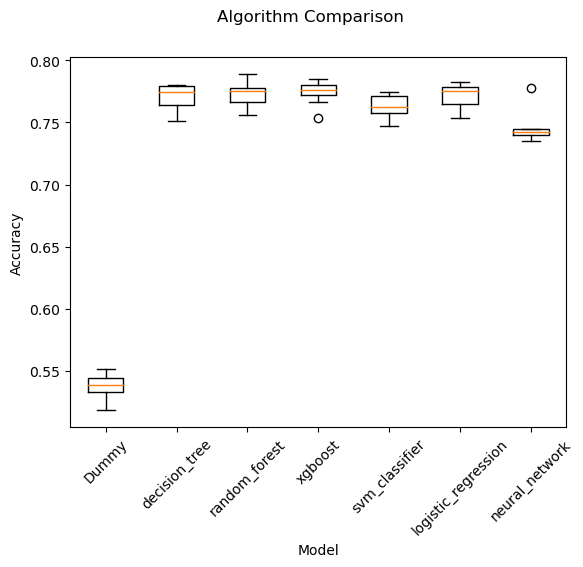

In [476]:
Utils.plotComparison(results)

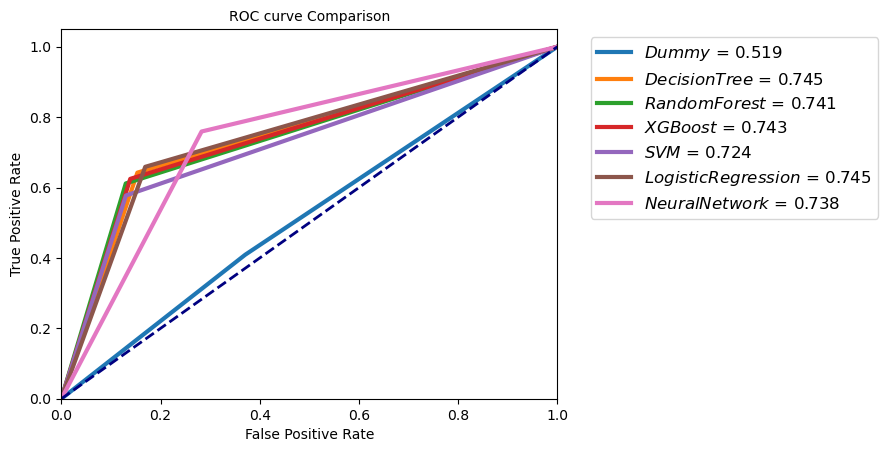

In [477]:
Utils.computeFullRoc(y_test, rocList)

<a id='fsh1n1'></a>
## 4BA. Feature selection H1N1 ([to top](#top))

In this section we apply the RFECV on the best Decision Tree for the H1N1 dataset. 
We use https://www.scikit-yb.org/en/latest/api/model_selection/rfecv.html.

### Decision Tree

In [478]:
X_train, X_test, y_train, y_test = train_test_split(df_train, target_h1n1, test_size=0.3, random_state=42)
X_train, y_train = Utils.under_sampler(X_train, y_train,42,0.6)
numeric_cols = df_train.columns[df_train.dtypes != "object"].values

Resampled dataset shape Counter({0: 6633, 1: 3980})


In [479]:
numeric_preprocessing_steps = Pipeline([
    ('standard_scaler', StandardScaler()),
    ('simple_imputer', SimpleImputer(strategy='median'))
])

preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", numeric_preprocessing_steps, numeric_cols)
    ],
    remainder = "drop"
)
X_train_classification = preprocessor.fit_transform(X_train)
X_test_classification = preprocessor.fit_transform(X_test)

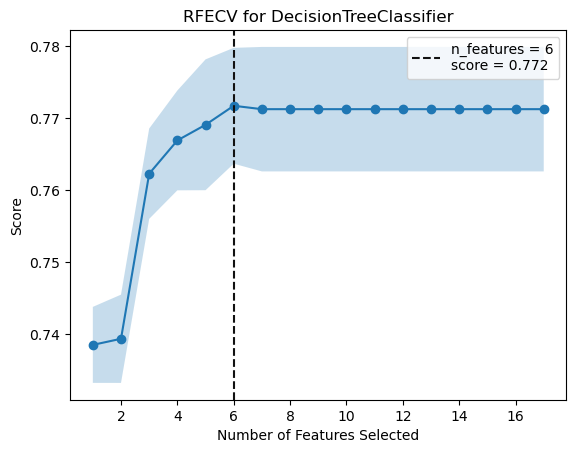

In [480]:
decision_tree = tree.DecisionTreeClassifier(criterion="entropy", 
                                 max_depth=5,
                                 min_samples_split=170)
H1N1_RFECV=Utils.visual_RFECV(decision_tree,X_train_classification, y_train)

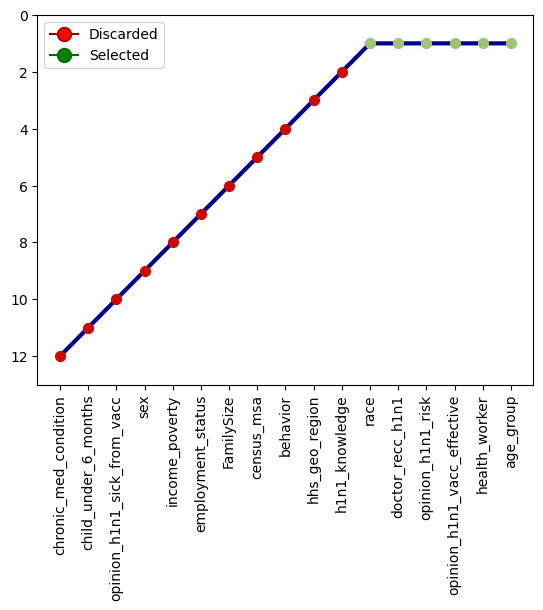

In [481]:
rank_df = Utils.print_features_rank(H1N1_RFECV, df_train,"h1n1_vaccine")

In [482]:
H1N1_RFECV.fit(X_train_classification, y_train)

RFECV(ax=<AxesSubplot:title={'center':'RFECV for DecisionTreeClassifier'}, xlabel='Number of Features Selected', ylabel='Score'>,
      model=None)

In [483]:
y_pred_decision_tree = H1N1_RFECV.predict(X_test_classification)

In [484]:
decision_tree.fit(X_train_classification, y_train)
y_pred_baseline = decision_tree.predict(X_test_classification)

In [485]:
print('Accuracy %s' % accuracy_score(y_test, y_pred_decision_tree))
print('F1-score %s' % f1_score(y_test, y_pred_decision_tree, average=None))
Utils.printReport(y_test, y_pred_decision_tree)

Accuracy 0.8040683888680894
F1-score [0.87229543 0.57931404]
              precision    recall  f1-score   support

           0       0.90      0.85      0.87      6319
           1       0.53      0.64      0.58      1694

    accuracy                           0.80      8013
   macro avg       0.71      0.74      0.73      8013
weighted avg       0.82      0.80      0.81      8013



<AxesSubplot:>

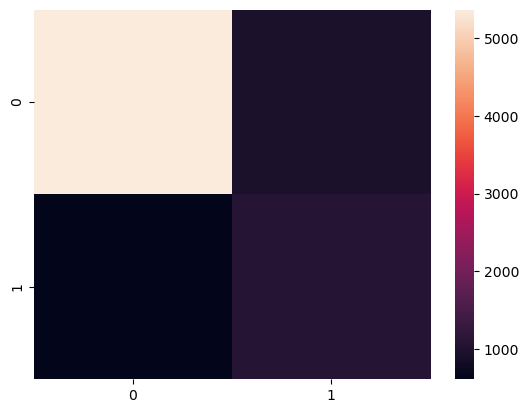

In [486]:
conf_matrix = confusion_matrix(y_test, y_pred_decision_tree)
sns.heatmap(conf_matrix)